<P> <img src="https://i.ibb.co/gyNf19D/nhslogo.png" alt="nhslogo" border="0" width="100" align="right"><font size="6"><b> CS4132 Data Analytics</b> </font>

<font size=5>***Analysis of Pop Music over the Years*** by ***Liu Wenkai***</font>

# Table of Contents

1. [Motivation & Background](#motivbg)
2. [Summary of Research Questions & Results](#qnandres)
3. [Dataset](#dataset)
4. [Methodology](#meth)
    1. [Data Acquisition](#acqui)
        1. [RIAA Music Sales](#riaaaq)
        2. [Billboard *Hot 100*](#hot100aq)
        3. [Spotify Search](#searchaq)
        4. [Audio Analysis](#analysisaq)
        5. [Album Rating](#ratingaq)
    2. [Data Cleaning](#clean)
        1. [RIAA Music Sales](#riaaclean)
    3. [Exploratory Data Analysis](#eda)
        1. [Q1: Music Formats](#q1eda)
            1. Stacked Area Charts
            2. Grouped Area Charts
            3. Revenue per Unit
        2. [Q2: New Artists](#q2eda)
            1. Without Spotify Data
                1. Chart Toppers
                2. Prior Appearances
            2. With Spotify Data
                1. Merging
                2. Missing Data Analysis
                3. Chart Toppers
                4. Artist Distribution
                5. Prior Appearances
                6. First Appearances
                7. Spotify Popularity
        3. [Q3: Song Happiness/Valence](#q3eda)
            1. Valence Distribution
            2. Valence Over Time
            3. Valence, Higher on the Chart
            4. Spotify Popularity
            5. Maximum Chart Ranking
            6. Top 25 Valence
        4. [Q4: Song Duration](#q4eda)
            1. Length Distribution
            2. Length Over Time
            3. Maximum Chart Ranking
            4. Spotify Popularity
            5. Top 25 Length
        5. [Modelling](#model)
            1. Cleaning
            2. Max Chart Position
                1. Correlations
                2. Multiple Linear Regression
                3. Random Forest
            3. Spotify Popularity
                1. Correlations
                2. Multiple Linear Regression
                3. Random Forest
            4. Conclusions
        6. [Q5: Song/Album Ratings](#q5eda)
            1. Album Time
            2. Album Distribution
            3. User/Critic Distributions
            4. User/Critic Scores Over Time
            5. Reviews With Comments
            6. Charting Songs
            7. Highest Scoring Albums
            8. Critic vs. User
5. [Findings & Conclusions](#findings)
    1. [Q1: Music Formats](#q1res)
    2. [Q2: New Artists](#q2res)
    3. [Q3: Song Happiness](#q3res)
    4. [Q4: Song Length](#q4res)
    5. [Q5: Music Ratings](#q5res)
6. [Recommendations & Further Works](#rec)
7. [References](#ref)

<a id='motivbg'/>

# Motivation and Background

Music is a very popular form of entertainment, that has greatly changed throughout the years. From the old radio and television methods, and now Youtube and Spotify, discovering new music has never been easier. But how has this affected the industry? Are digital sales increasing the revenue of the music industry, or is it decreasing it? Is Spotify helping newer artists be heard, or is it suppressing them? Are popular songs nowadays reaching more people, as Spotify's userbase has grown? Are they getting shorter? Is popular music getting better or worse, based on critic's opinions? 

<a id='qnandres'/>

# Summary of Research Questions & Results

1. Are digital sales increasing music industry revenue, or decreasing it?
    - Turns out, digital sales, in terms of downloads, is not at all worth it to the music industry. However, streaming is incredibly, incredinly lucrative, and for physical formats, CD and DVD are king.

2. Is digital media helping newer artists be heard?
    - Turns out, it is not! We are at an all-time low in terms of new artists on the chart, actually, despite the trend of the new-age TikTok artiste.
   
3. Are popular songs getting less happy?
    - Indeed, popular charting songs are less happy nowadays! Actually, this has been a trend since around the 1990s, so it seems that cynicism in pop is not new at all.

4. Are popular songs getting shorter?
    - Popular songs are indeed getting shorter, after a peak in the 1990s! As with the previous question, though, this has been a trend since the 2000s.

5. Based on critics and users, is popular music getting better or worse?
    - Popular music is getting better, it seems. Both critics and users agree, today's music is better than before, however their opinions seem to differ in the prior decade.

<a id='dataset'/>

# Dataset

1. https://www.billboard.com/charts/hot-100/
    - The Billboard Hot 100 is a list of all the hottest music in a week. It has great history, and is widely considered when people ask what music is popular right now.

2. https://api.spotify.com/
    - The Spotify API, letting us access Spotify track listen counts. Also allows us to find information like track length and more.
    - Additionally, Spotify provides audio analysis of tracks, which we will be using to answe Q3 in particular.

3. https://www.metacritic.com/music
    - Metacritic collates critic and user ratings for albums across the internet. This allows us to gauge the quality of an album, and thus songs in general.

4. https://www.riaa.com/u-s-sales-database/
    - Collects US music sales data of different mediums, starting from the 1970s.

<a id='meth'/>

# Methodology

## Data Acquisition

Note that I am using **orjson**, a module for parsing **JSON** data quickly. Some rows in the data are stored as JSON-encoded strings, that can be parsed to lists, so the library allows for fast parsing of such data.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import orjson
import pandas as pd
import plotly.express as px
import seaborn as sns
from matplotlib.patches import Patch
from scipy import stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm

In [2]:
sns.set()
tqdm.pandas()

<a id='riaaaq'/>

### RIAA Music Sales

Dataset 1: The RIAA music sales csv data. Downloaded from the RIAA's website, from their Tableau chart. Important columns are the "Year", the "Value (For Charting)", and the "Format", which should be self-explanatory. 

In [3]:
riaa_sales_revenue = pd.read_csv("data/riaa_sales_revenue_by_format.csv")
riaa_sales_revenue

,Year of Year Date,Adjusted for Inflation Notes,Adjusted for Inflation Title,Format,Metric,Year,Value (For Charting),Adjusted for Inflation Flag,Year Date,Format Value # (Billion),Format Value # (Million),Total Value # (Billion),Total Value # (Million),Total Value For Year,Value (Actual),Year (copy)
0,1973,NaN,NaN,8 - Track,Value,1973,489.0,NaN,1973,NaN,£489.0M,£2.0B,NaN,£2016.6B,489.0,1973
1,1974,NaN,NaN,8 - Track,Value,1974,549.2,NaN,1974,NaN,£549.2M,£2.2B,NaN,£2199.7B,549.2,1974
2,1975,NaN,NaN,8 - Track,Value,1975,583.0,NaN,1975,NaN,£583.0M,£2.4B,NaN,£2388.5B,583.0,1975
3,1976,NaN,NaN,8 - Track,Value,1976,678.2,NaN,1976,NaN,£678.2M,£2.7B,NaN,£2737.1B,678.2,1976
4,1977,NaN,NaN,8 - Track,Value,1977,811.0,NaN,1977,NaN,£811.0M,£3.5B,NaN,£3500.8B,811.0,1977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
467,2017,NaN,NaN,Synchronization,Value,2017,232.1,NaN,2017,NaN,£232.1M,£8.5B,NaN,£8503.4B,232.1,2017
468,2018,NaN,NaN,Synchronization,Value,2018,285.5,NaN,2018,NaN,£285.5M,£9.7B,NaN,£9738.2B,285.5,2018
469,2019,NaN,NaN,Synchronization,Value,2019,281.1,NaN,2019,NaN,£281.1M,£11.1B,NaN,£11130.6B,281.1,2019
470,2020,NaN,NaN,Synchronization,Value,2020,265.2,NaN,2020,NaN,£265.2M,£12.1B,NaN,£12144.4B,265.2,2020


In [4]:
riaa_sales_volume = pd.read_csv("data/riaa_sales_volume_by_format.csv")
riaa_sales_volume

,Year of Year Date,Format,Format (copy),Metric,Value (Actual),Adjusted for Inflation Flag,Year,Year Date,% of Total Volume,Format Value # (Billion),Format Value # (Million),Total Value # (Billion),Total Value # (Million),Total Value For Year,Value (Actual) (copy),Year (copy)
0,1983,CD,CD,Units,0.800000,NaN,1983,1983,0.1%,NaN,$0.8M,NaN,$572.0M,$572.0B,$1M,1983
1,1984,CD,CD,Units,5.800000,NaN,1984,1984,0.9%,NaN,$5.8M,NaN,$673.9M,$673.9B,$6M,1984
2,1985,CD,CD,Units,22.600000,NaN,1985,1985,3.5%,NaN,$22.6M,NaN,$649.4M,$649.4B,$23M,1985
3,1986,CD,CD,Units,53.000000,NaN,1986,1986,8.6%,NaN,$53.0M,NaN,$616.6M,$616.6B,$53M,1986
4,1987,CD,CD,Units,102.100000,NaN,1987,1987,14.5%,NaN,$102.1M,NaN,$706.2M,$706.2B,$102M,1987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,2017,Ringtones & Ringbacks,Ringtones & Ringbacks,Units,14.262870,NaN,2017,2017,2.0%,NaN,$14.3M,NaN,$730.9M,$730.9B,$14M,2017
469,2018,Ringtones & Ringbacks,Ringtones & Ringbacks,Units,10.026287,NaN,2018,2018,1.9%,NaN,$10.0M,NaN,$531.2M,$531.2B,$10M,2018
470,2019,Ringtones & Ringbacks,Ringtones & Ringbacks,Units,8.290340,NaN,2019,2019,1.9%,NaN,$8.3M,NaN,$445.0M,$445.0B,$8M,2019
471,2020,Ringtones & Ringbacks,Ringtones & Ringbacks,Units,8.128392,NaN,2020,2020,2.3%,NaN,$8.1M,NaN,$348.9M,$348.9B,$8M,2020


<a id='hot100aq'/>

### Billboard Hot 100

Dataset 2: The *Billboard Hot 100*, scraped from the Billboard website, weekly, from the year 1958 to 2022. Scraping code is in *data/billboard.ipynb*. Columns are pretty self-explanatory.

In [5]:
hot_100 = pd.read_csv("data/billboard_hot_100.csv", parse_dates=["date"])
hot_100

,date,ranking,song_name,artist
0,1958-08-09,1,Poor Little Fool,Ricky Nelson
1,1958-08-09,2,Patricia,Perez Prado And His Orchestra
2,1958-08-09,3,Splish Splash,Bobby Darin
3,1958-08-09,4,Hard Headed Woman,Elvis Presley With The Jordanaires
4,1958-08-09,5,When,Kalin Twins
...,...,...,...,...
334582,2022-09-17,96,Thought You Should Know,Morgan Wallen
334583,2022-09-17,97,Country On,Luke Bryan
334584,2022-09-17,98,Static,Steve Lacy
334585,2022-09-17,99,Billie Eilish.,Armani White


<a id='searchaq'/>

### Spotify Search

Dataset 3: Spotify data for each song on the *Billboard Hot 100*, obtained from the Web API by searching for every song. Scraping code in *data/spotify_search.ipynb*, and data extracted from the JSON in *data/spotify_data_extraction.ipynb*.

Columns, again, pretty self-explanatory.

In [6]:
spotify_search = pd.read_csv("data/spotify.csv")
spotify_search

,song_name,artist,track_id,album_name,track_name,album_type,popularity,album_artists,track_artists,length_ms,explicit
0,Woof Woof,69 Boyz,1bg4iNalDl3bUBClWGmK2b,The Wait Is Over,Woof Woof,album,26,"[""69 Boyz""]","[""69 Boyz""]",271933,False
1,One Of Those Nights,Tim McGraw,3ZHjQSfJ46zjFbt79MAqD2,Two Lanes Of Freedom (Accelerated Deluxe),One Of Those Nights,album,49,"[""Tim McGraw""]","[""Tim McGraw""]",236520,False
2,Still Runnin,"Lil Baby, Lil Durk & Meek Mill",5cAN3P7jWVf78gev1eF7TJ,The Voice of the Heroes,Still Runnin (feat. Meek Mill),album,65,"[""Lil Baby"",""Lil Durk""]","[""Lil Baby"",""Lil Durk"",""Meek Mill""]",173419,True
3,Find Another Fool,Quarterflash,1kWIbNb9gqmYBb9anvWkOA,Quarterflash,Find Another Fool,album,35,"[""Quarterflash""]","[""Quarterflash""]",274933,False
4,Me About You,The Mojo Men,300qXG6Be7OeOIVCFuk2rR,San Francisco Nuggets,Sit Down I Think I Love You - Single Version,compilation,23,"[""Various Artists""]","[""The Mojo Men""]",142333,False
...,...,...,...,...,...,...,...,...,...,...,...
30035,Detox,Lil Baby,7fSM2taFBEB1WNZl8AOIoo,Detox,Detox,single,79,"[""Lil Baby""]","[""Lil Baby""]",161636,True
30036,Sin Fin,Romeo Santos & Justin Timberlake,4BBTalxG6c1Aoai1x1EA5g,"Fórmula, Vol. 3",Sin Fin,album,70,"[""Romeo Santos""]","[""Romeo Santos"",""Justin Timberlake""]",234666,False
30037,Calm Down,Rema & Selena Gomez,0WtM2NBVQNNJLh6scP13H8,Calm Down (with Selena Gomez),Calm Down (with Selena Gomez),single,88,"[""Rema"",""Selena Gomez""]","[""Rema"",""Selena Gomez""]",239317,False
30038,Romantic Homicide,d4vd,1xK59OXxi2TAAAbmZK0kBL,Romantic Homicide,Romantic Homicide,single,86,"[""d4vd""]","[""d4vd""]",132630,False


<a id='analysisaq'/>

### Audio Analysis

Dataset 4: Audio analysis of the songs on the list, provided by Spotify. Scraping code in *data/spotify_audio_analysis.ipynb*.

Column explanation:
- Track ID: Spotify's assigned track id for this song.
- Acousticness: Whether Spotify thinks the song is acoustic or not
- Danceability: How danceable the music is, according to Spotify
- Energy: High energy is like death metal, low like lofi-style music
- Instrumentalness: Does the track contain only instruments, and no vocals? Higher -> less vocals.
- Key: Musical key, from C to B (C=0, B=11). -1 means no key detected.
- Loudness: Averaged decibel value for the track.
- Mode: Major(1) or minor(0).
- Speechiness: Whether the track is mostly speech. 0.33 ~ 0.66 is like rap, <0.33 is music, >0.66 is like a podcast.
- Tempo: Track bpm.
- Valence: Measure of positivity of a track.
- Time signature: Time signature, given as a number /4 (so like 4 means 4/4, 7 means 7/4)

The original explanation can be found at https://developer.spotify.com/documentation/web-api/reference/#/operations/get-audio-features.

In [7]:
spotify_audio_analysis = pd.read_csv("data/spotify_analysis.csv")
spotify_audio_analysis

,track_id,acousticness,danceability,energy,instrumentalness,key,loudness,mode,speechiness,tempo,valence,time_signature
0,39HRFAea1JwoG8vQzKDilP,0.15500,0.676,0.5630,0.000950,5,-7.605,1,0.0238,104.385,0.463,4
1,53m1rGnPJVtI0zUryVyL9N,0.03590,0.617,0.5590,0.000000,4,-5.738,1,0.0269,111.747,0.664,4
2,7uOlL4oeW3SrMugsYr8xZu,0.89000,0.654,0.0852,0.892000,9,-20.452,1,0.0456,80.085,0.386,4
3,0uIMx0KeoqyBYKHMkwyAFq,0.42900,0.859,0.8750,0.054600,9,-7.306,0,0.0519,106.561,0.881,4
4,4aaOblwrIiVnScKL51pGdo,0.03560,0.759,0.7950,0.000011,3,-8.713,1,0.0620,130.803,0.877,4
...,...,...,...,...,...,...,...,...,...,...,...,...
29509,0IcbJnZAwVMWoHdcQqLjk4,0.00399,0.699,0.9450,0.003580,10,-13.158,0,0.0422,121.086,0.822,4
29510,2SusUbsUQnw8OJDq56ZMbE,0.19700,0.344,0.7450,0.000000,8,-6.901,1,0.0333,172.124,0.832,4
29511,7kQJCw0ZkvHgfJqRwPblmG,0.02230,0.625,0.5420,0.000000,9,-4.365,1,0.2660,152.403,0.328,4
29512,6RnEe2AkQIicLcRvwuGUmI,0.22300,0.666,0.8280,0.000019,1,-5.276,1,0.0303,101.408,0.613,4


<a id='ratingaq'/>

### Album Rating

Dataset 5: Metacritic rating for albums containing songs in the *Billboard Hot 100*. Scraping code in *data/metacritic.ipynb*

*Note: Metacritic only has ratings for the most popular albums, so there isn't a lot of data. However, the other options (like Album of the Year) turned out to be difficult to scrape, given their URL formats, along with CloudFlare anti-DDOS protection, thus we resort to Metacritic.*

In [8]:
metacritic_scores = pd.read_csv("data/metacritic.csv")
metacritic_scores

,album_name,artist,top_100_songs,critic_score,user_score,critic_distribution,user_distribution,critic_score_bucket,user_score_bucket,critic_total_ratings,user_total_ratings
0,Red River Blue (Deluxe Edition),Blake Shelton,"[[""Over"",""Blake Shelton""],[""Drink On It"",""Blak...",62,3.9,"[4,5,0]","[1,0,0]",Generally favorable reviews,Generally unfavorable reviews,9,17
1,Human,Brandy,"[[""Right Here (Departed)"",""Brandy""]]",67,5.4,"[4,5,1]","[8,0,0]",Generally favorable reviews,Mixed or average reviews,10,66
2,Rule 3:36,Ja Rule,"[[""Between Me And You"",""Ja Rule Featuring Chri...",56,7.4,"[1,4,0]","[2,0,1]",Mixed or average reviews,Generally favorable reviews,5,8
3,Wildflower (Deluxe Edition),Sheryl Crow,"[[""Good Is Good"",""Sheryl Crow""]]",63,5.6,"[9,6,2]","[19,3,0]",Generally favorable reviews,Mixed or average reviews,17,52
4,Restless,Xzibit,"[[""X"",""Xzibit""]]",75,8.3,"[9,2,0]","[3,1,0]",Generally favorable reviews,Universal acclaim,11,18
...,...,...,...,...,...,...,...,...,...,...,...
1426,Partie Traumatic,Black Kids,"[[""I'm Not Gonna Teach Your Boyfriend To Dance...",75,6.4,"[24,6,2]","[12,3,4]",Generally favorable reviews,Generally favorable reviews,32,40
1427,Trip At Knight (Complete Edition),Trippie Redd,"[[""Rich MF"",""Trippie Redd Featuring Lil Durk &...",68,7.2,"[3,2,0]","[4,1,2]",Generally favorable reviews,Generally favorable reviews,5,17
1428,Rotten Apple,Lloyd Banks,"[[""Hands Up"",""Lloyd Banks Featuring 50 Cent""]]",51,6.4,"[3,8,3]","[13,3,5]",Mixed or average reviews,Generally favorable reviews,14,32
1429,True,Avicii,"[[""Hey Brother"",""Avicii""],[""Wake Me Up!"",""Avic...",69,7.8,"[5,1,1]","[17,0,4]",Generally favorable reviews,Generally favorable reviews,7,119


<a id='clean'/>

## Data Cleaning

<a id='riaaclean'/>

### RIAA Music Sales

Let's delete the irrelevant columns from the dataset.

In [9]:
relevant_columns_revenue = ["Year", "Format", "Value (For Charting)"]

In [10]:
riaa_sales_revenue = riaa_sales_revenue[relevant_columns_revenue].copy()
riaa_sales_revenue.rename(columns={"Value (For Charting)": "Value"}, inplace=True)
riaa_sales_revenue

,Year,Format,Value
0,1973,8 - Track,489.0
1,1974,8 - Track,549.2
2,1975,8 - Track,583.0
3,1976,8 - Track,678.2
4,1977,8 - Track,811.0
...,...,...,...
467,2017,Synchronization,232.1
468,2018,Synchronization,285.5
469,2019,Synchronization,281.1
470,2020,Synchronization,265.2


In [11]:
relevant_columns_volume = ["Year", "Format", "Value (Actual)"]

In [12]:
riaa_sales_volume = riaa_sales_volume[relevant_columns_volume].copy()
riaa_sales_volume.rename(columns={"Value (Actual)": "Value"}, inplace=True)
riaa_sales_volume.loc[riaa_sales_volume["Value"] < 0, "Value"] = 0
riaa_sales_volume

,Year,Format,Value
0,1983,CD,0.800000
1,1984,CD,5.800000
2,1985,CD,22.600000
3,1986,CD,53.000000
4,1987,CD,102.100000
...,...,...,...
468,2017,Ringtones & Ringbacks,14.262870
469,2018,Ringtones & Ringbacks,10.026287
470,2019,Ringtones & Ringbacks,8.290340
471,2020,Ringtones & Ringbacks,8.128392


The 'Synchronisation' format is simply to synchronise the total value of format sales to the total sales value data; we will rename it to 'Others' to better reflect its role.

In [13]:
riaa_sales_revenue.loc[
    riaa_sales_revenue["Format"] == "Synchronization", "Format"
] = "Others"

In [14]:
riaa_sales_revenue.tail(5)

,Year,Format,Value
467,2017,Others,232.1
468,2018,Others,285.5
469,2019,Others,281.1
470,2020,Others,265.2
471,2021,Others,302.9


To make this data easier to work with, let us change the indexing, such that each row is a year, and each column is a format.

In [15]:
categories = np.unique(
    np.concatenate(
        [riaa_sales_volume["Format"].unique(), riaa_sales_revenue["Format"].unique()]
    )
)

In [16]:
def transpose_df(df):
    transposed = pd.DataFrame(
        columns=categories,
        index=df["Year"].unique(),
        dtype="float64",
    )

    def set_value(row):
        transposed.loc[row["Year"], row["Format"]] = row["Value"]

    df.apply(set_value, axis=1)

    transposed.fillna(0, inplace=True)

    return transposed

In [17]:
riaa_sales_volume = transpose_df(riaa_sales_volume)
riaa_sales_volume.sort_index(inplace=True)
riaa_sales_volume

,8 - Track,CD,CD Single,Cassette,Cassette Single,DVD Audio,Download Album,Download Music Video,Download Single,Kiosk,...,On-Demand Streaming (Ad-Supported),Other Ad-Supported Streaming,Other Digital,Other Tapes,Others,Paid Subscription,Ringtones & Ringbacks,SACD,SoundExchange Distributions,Vinyl Single
1973,91.0,0.000000,0.000000,15.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,2.2,0.0,0.0,0.000000,0.000000,0.0,228.000000
1974,96.7,0.000000,0.000000,15.3,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.9,0.0,0.0,0.000000,0.000000,0.0,204.000000
1975,94.6,0.000000,0.000000,16.2,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.5,0.0,0.0,0.000000,0.000000,0.0,164.000000
1976,106.1,0.000000,0.000000,21.8,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.7,0.0,0.0,0.000000,0.000000,0.0,190.000000
1977,127.3,0.000000,0.000000,36.9,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,190.000000
1978,133.6,0.000000,0.000000,61.3,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,190.000000
1979,102.3,0.000000,0.000000,78.5,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,212.000000
1980,85.0,0.000000,0.000000,99.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,157.000000
1981,50.0,0.000000,0.000000,124.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,154.700000
1982,13.7,0.000000,0.000000,183.2,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,137.200000


In [18]:
riaa_sales_revenue = transpose_df(riaa_sales_revenue)
riaa_sales_revenue

,8 - Track,CD,CD Single,Cassette,Cassette Single,DVD Audio,Download Album,Download Music Video,Download Single,Kiosk,...,On-Demand Streaming (Ad-Supported),Other Ad-Supported Streaming,Other Digital,Other Tapes,Others,Paid Subscription,Ringtones & Ringbacks,SACD,SoundExchange Distributions,Vinyl Single
1973,489.0,0.0,0.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,15.6,0.0,0.0,0.0,0.0,0.0,190.0
1974,549.2,0.0,0.0,87.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,13.3,0.0,0.0,0.0,0.0,0.0,194.0
1975,583.0,0.0,0.0,98.8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10.2,0.0,0.0,0.0,0.0,0.0,211.5
1976,678.2,0.0,0.0,145.7,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,5.1,0.0,0.0,0.0,0.0,0.0,245.1
1977,811.0,0.0,0.0,249.6,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,245.1
1978,948.0,0.0,0.0,449.8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,260.3
1979,684.3,0.0,0.0,580.6,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,353.6
1980,527.0,0.0,0.0,705.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0
1981,313.0,0.0,0.0,1062.8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,256.4
1982,36.0,0.0,0.0,1384.5,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,283.0


***Note: the rest of the data is webscraped, and thus has already been cleaned in the scraping notebooks.***

<a id='eda'/>

## Exploratory Data Analysis

### Q1: Music Formats

#### Stacked Area Charts

For this question, RIAA data will be used to answer it.

Let us make a stacked area chart of this data.

In [19]:
colours = list(sns.color_palette("deep", len(categories)).as_hex())

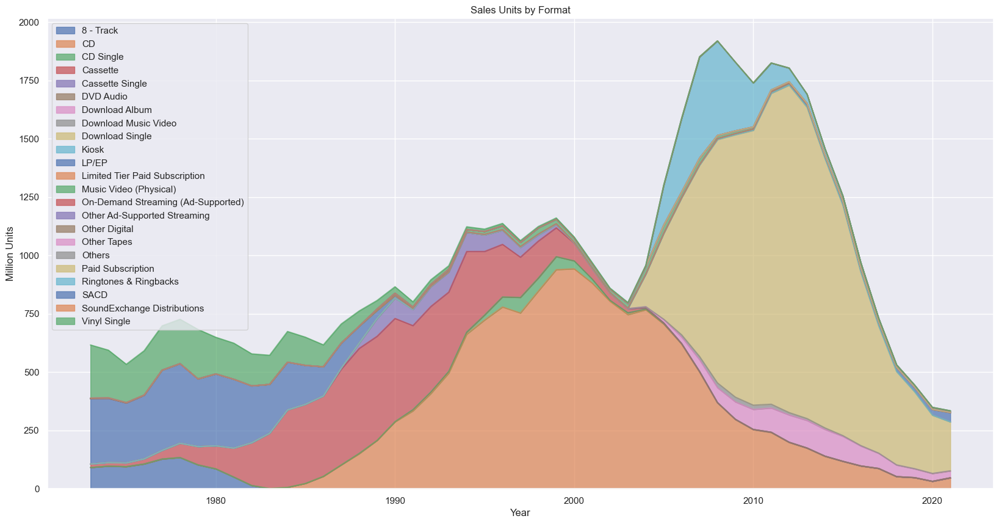

In [20]:
riaa_sales_volume.plot.area(
    figsize=(20, 10),
    title="Sales Units by Format",
    ylabel="Million Units",
    xlabel="Year",
    color=colours,
    alpha=0.7,
)

plt.show()

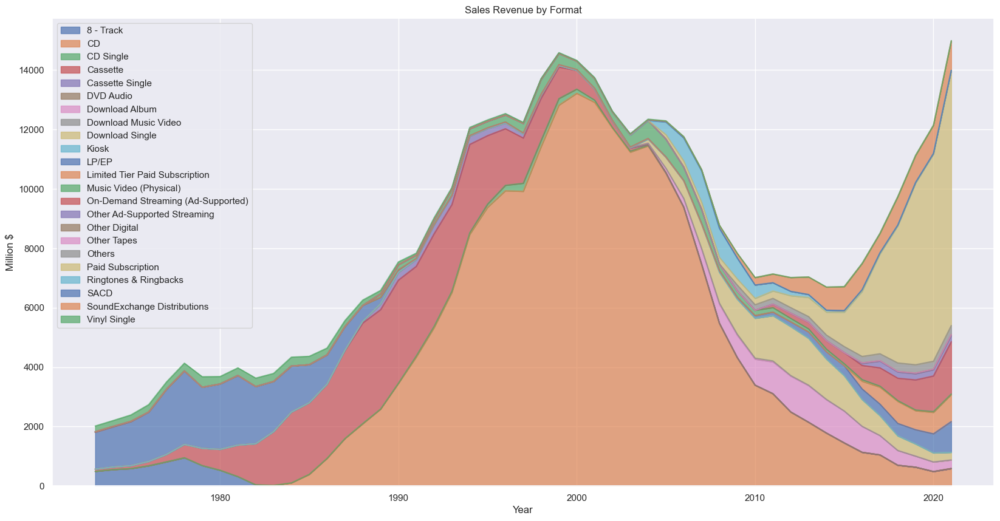

In [21]:
riaa_sales_revenue.plot.area(
    figsize=(20, 10),
    title="Sales Revenue by Format",
    ylabel="Million $",
    xlabel="Year",
    color=colours,
    alpha=0.7,
)

plt.show()

#### Grouped Area Charts

These graphs are very confusing and are quite uninformative. Let us group some of them together.

In [22]:
groupings = {
    "Others": ["Others", "Kiosk"],
    "Tapes": [
        "8 - Track",
        "Cassette",
        "Cassette Single",
        "LP/EP",
        "Vinyl Single",
        "Other Tapes",
    ],
    "Digital": ["CD", "CD Single", "SACD", "DVD Audio", "Music Video (Physical)"],
    "Downloads": [
        "Download Album",
        "Download Single",
        "Download Music Video",
        "Ringtones & Ringbacks",
        "Other Digital",
    ],
    "Streaming": [
        "Paid Subscription",
        "On-Demand Streaming (Ad-Supported)",
        "Other Ad-Supported Streaming",
        "SoundExchange Distributions",
        "Limited Tier Paid Subscription",
    ],
}

In [23]:
def group_types(df):
    df = df.copy()

    for group_name, columns in groupings.items():
        series = df[columns].sum(axis=1)
        df.drop(columns=columns, inplace=True)
        df[group_name] = series

    return df

In [24]:
riaa_sales_revenue_grouped = group_types(riaa_sales_revenue)

In [25]:
riaa_sales_volume_grouped = group_types(riaa_sales_volume)

With the grouping, here's the new graphs:

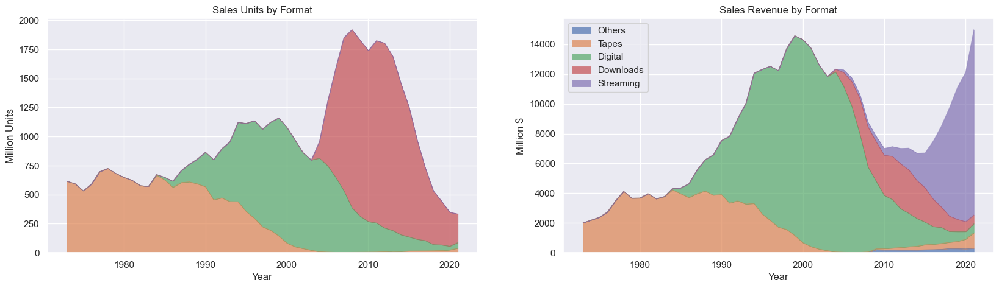

In [26]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))

riaa_sales_volume_grouped.plot.area(
    title="Sales Units by Format",
    ylabel="Million Units",
    xlabel="Year",
    color=colours,
    alpha=0.7,
    linewidth=0.5,
    ax=axs[0],
    legend=None,
)

riaa_sales_revenue_grouped.plot.area(
    title="Sales Revenue by Format",
    ylabel="Million $",
    xlabel="Year",
    color=colours,
    alpha=0.7,
    linewidth=0.5,
    ax=axs[1],
)

fig.show()

Let us look at the time period around 2010. Units sold reached an all-time high, yet revenue hit a decade low. During this period, digital downloads skyrocketed, yet their sales revenue only marginally increased.

#### Revenue per Unit

Another way is to rank each format by revenue per unit sold;

In [27]:
revenue_per_unit = riaa_sales_revenue.sum() / riaa_sales_volume.sum()
revenue_per_unit

8 - Track                              6.240920
CD                                    13.853625
CD Single                              4.330796
Cassette                               7.862341
Cassette Single                        3.212338
DVD Audio                             21.917255
Download Album                        10.087864
Download Music Video                   1.988508
Download Single                        1.129087
Kiosk                                  1.943519
LP/EP                                  7.650399
Limited Tier Paid Subscription              inf
Music Video (Physical)                18.511994
On-Demand Streaming (Ad-Supported)          inf
Other Ad-Supported Streaming                inf
Other Digital                               inf
Other Tapes                            7.015873
Others                                      inf
Paid Subscription                           inf
Ringtones & Ringbacks                  2.428686
SACD                                  20

Note the 'inf'; these are mostly due to lack of data, or inability to count units (as in Subscriptions and SoundExchange Distributions, which aren't sold as units)

In [28]:
revenue_per_unit = (
    revenue_per_unit.replace(np.inf, np.nan).dropna().to_frame().reset_index()
)

In [29]:
revenue_per_unit.columns = ["Format", "Value"]

In [30]:
revenue_per_unit

,Format,Value
0,8 - Track,6.240920
1,CD,13.853625
2,CD Single,4.330796
3,Cassette,7.862341
4,Cassette Single,3.212338
5,DVD Audio,21.917255
6,Download Album,10.087864
7,Download Music Video,1.988508
8,Download Single,1.129087
9,Kiosk,1.943519


Let us group them in the same way we grouped them above: 

In [31]:
def group_format(format):
    for group_name, formats in groupings.items():
        if format in formats:
            return group_name

In [32]:
revenue_per_unit["Format Group"] = revenue_per_unit["Format"].apply(group_format)

In [33]:
revenue_per_unit

,Format,Value,Format Group
0,8 - Track,6.240920,Tapes
1,CD,13.853625,Digital
2,CD Single,4.330796,Digital
3,Cassette,7.862341,Tapes
4,Cassette Single,3.212338,Tapes
5,DVD Audio,21.917255,Digital
6,Download Album,10.087864,Downloads
7,Download Music Video,1.988508,Downloads
8,Download Single,1.129087,Downloads
9,Kiosk,1.943519,Others


Let us pre-sort the groups by average revenue per unit:

In [34]:
revenue_order = (
    revenue_per_unit.groupby("Format Group")["Value"]
    .mean()
    .sort_values(ascending=True)
    .index.to_list()
)

In [35]:
revenue_order

['Others', 'Downloads', 'Tapes', 'Digital']

In [36]:
revenue_per_unit["Order"] = revenue_per_unit["Format Group"].apply(
    lambda group: revenue_order.index(group)
)

In [37]:
revenue_per_unit = revenue_per_unit.sort_values(
    by=["Order", "Value"], ascending=False
).reset_index(drop=True)

In [38]:
revenue_per_unit

,Format,Value,Format Group,Order
0,DVD Audio,21.917255,Digital,3
1,SACD,20.509529,Digital,3
2,Music Video (Physical),18.511994,Digital,3
3,CD,13.853625,Digital,3
4,CD Single,4.330796,Digital,3
5,Cassette,7.862341,Tapes,2
6,LP/EP,7.650399,Tapes,2
7,Other Tapes,7.015873,Tapes,2
8,8 - Track,6.240920,Tapes,2
9,Cassette Single,3.212338,Tapes,2


In [39]:
color = sns.color_palette("Set2")

In [40]:
def get_colour(order):
    return color[order]

In [41]:
revenue_per_unit["Colour"] = revenue_per_unit["Order"].apply(get_colour)

In [42]:
revenue_per_unit.sort_values(by="Value", ascending=False, inplace=True)

Now, let us plot this data:

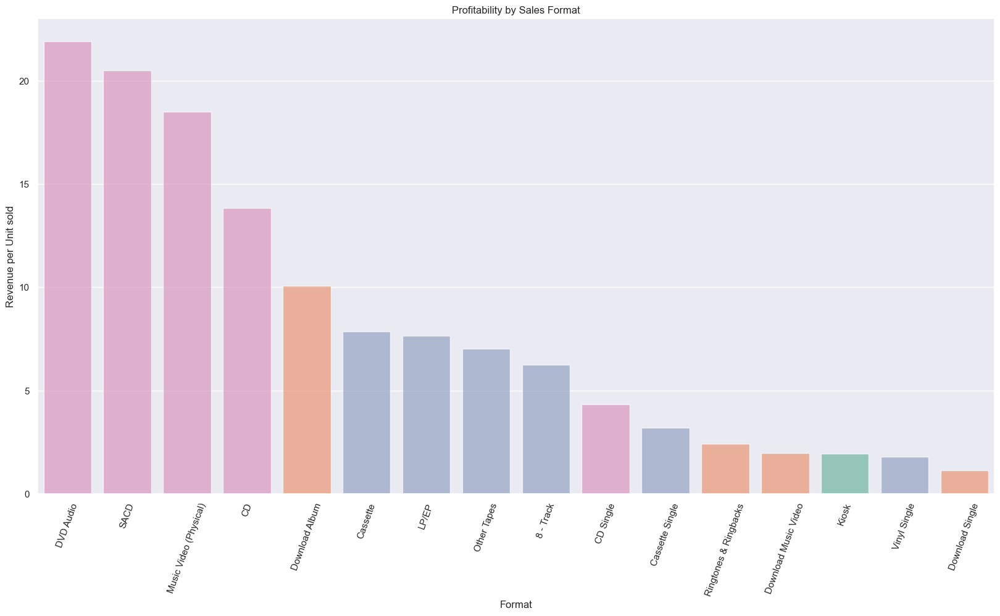

In [43]:
plt.figure(figsize=(20, 10))

sns.barplot(
    x=revenue_per_unit["Format"],
    y=revenue_per_unit["Value"],
    palette=revenue_per_unit["Colour"],
    alpha=0.7,
)

for label in plt.gca().get_xticklabels():
    label.set_rotation(70)

plt.ylabel("Revenue per Unit sold")
plt.xlabel("Format")

plt.title("Profitability by Sales Format")

plt.show()

As we can see, 3 of the lowest revenue per unit sold formats are download formats. This shows that downloads are not very profitable at all for the music industry.

Despite this fact, streaming has more than made up for this loss in revenue, as can be seen from the original revenue graph. This implies that the open nature of downloads, with the ability to freely copy and paste to other people, really hurt the music industry, while the more gated nature of streaming has reigned this piracy in, and has restored the earnings of the industry.

<a id='q2eda'/>

### Q2: New Artists

#### Without Spotify Data

##### Chart Toppers

To quantify the "newness" of an artist, let us count how many times they have been on the *Billboard Hot 100* before the song in question.

In [44]:
artist_appearance_counts = {}
appeared_songs = set()

In [45]:
def count_previous_appearances(row):
    artist = row["artist"]
    song_name = row["song_name"]

    # to not reward long stints on the boards, we only count each unique song once.
    if (song_name, artist) in appeared_songs:
        return artist_appearance_counts[artist]

    appeared_songs.add((song_name, artist))

    if artist not in artist_appearance_counts:
        artist_appearance_counts[artist] = 0
    artist_appearance_counts[artist] += 1
    return artist_appearance_counts[artist]

In [46]:
hot_100_appearances = hot_100[["date", "artist", "song_name"]].copy()

In [47]:
hot_100_appearances["appearances"] = hot_100_appearances.progress_apply(
    count_previous_appearances, axis=1
)

  0%|          | 0/334587 [00:00<?, ?it/s]

In [48]:
hot_100_appearances

,date,artist,song_name,appearances
0,1958-08-09,Ricky Nelson,Poor Little Fool,1
1,1958-08-09,Perez Prado And His Orchestra,Patricia,1
2,1958-08-09,Bobby Darin,Splish Splash,1
3,1958-08-09,Elvis Presley With The Jordanaires,Hard Headed Woman,1
4,1958-08-09,Kalin Twins,When,1
...,...,...,...,...
334582,2022-09-17,Morgan Wallen,Thought You Should Know,22
334583,2022-09-17,Luke Bryan,Country On,32
334584,2022-09-17,Steve Lacy,Static,2
334585,2022-09-17,Armani White,Billie Eilish.,1


Unfortunately, as we can see, this analysis is flawed. Note how the last row, "Romeo Santos & Justin Timberlake", is counted as appearing once, even though Justin Timberlake definitely has more than 1 *Billboard Hot 100* hit.

Given how common features are in modern music, this is a huge issue. And yet, since merging the Spotify data is more error-prone and introduces nulls, let us visualise this data first, and then compare to the Spotify data later.

Firstly, let's see who has appeared the most over this 70-year period.

In [49]:
appearances = pd.Series(artist_appearance_counts).sort_values(ascending=False).head(25)

In [50]:
appearances

Glee Cast                             183
Taylor Swift                          144
Drake                                 120
YoungBoy Never Broke Again             73
The Beatles                            65
Aretha Franklin                        64
Elton John                             58
The Rolling Stones                     57
Kanye West                             56
The Beach Boys                         54
Stevie Wonder                          54
The Weeknd                             53
Elvis Presley With The Jordanaires     53
Madonna                                53
Connie Francis                         53
Future                                 53
Neil Diamond                           52
Elvis Presley                          50
Justin Bieber                          49
The Temptations                        49
Brenda Lee                             48
Ray Charles                            48
Beyonce                                48
Jackie Wilson                     

Let us plot this data on a bar chart.

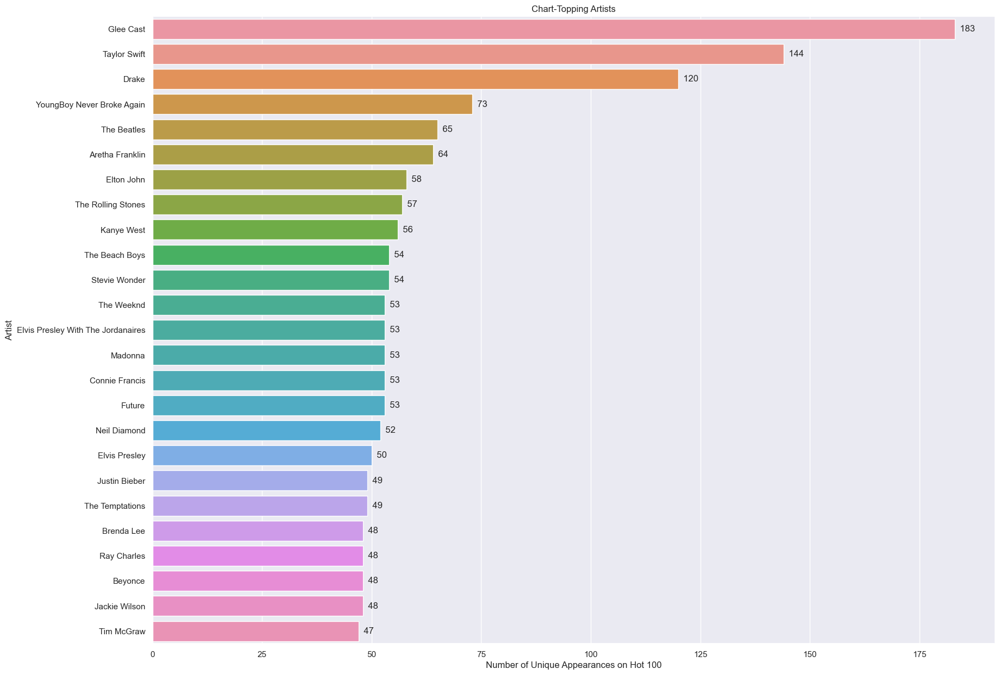

In [51]:
plt.figure(figsize=(20, 15))

ax = sns.barplot(y=appearances.index, x=appearances.values)
ax.bar_label(ax.containers[0], fmt="  %d")

plt.ylabel("Artist")
plt.xlabel("Number of Unique Appearances on Hot 100")
plt.title("Chart-Topping Artists")

plt.show()

To no one's surprise, Taylor Swift and Drake are the top individual artists. Given their huge song output, this is no big surprise. Also, note how Elvis Presley appears twice, once as "Elvis Presley", and then as "Elvis Presley With The Jordanaires", showing the issues with this data.

Surprisingly, the Glee Cast are the top performers. [***glee***](https://en.wikipedia.org/wiki/Glee_(TV_series)) is an American TV show featuring covers of pop songs, as it centers around a "show choir". Given the fact that they are a TV show, along with the fact that they have been around for so long, probably has given them many fans, who listen to their many covers.

##### Prior Appearances

Now, let us analyse the newness of the artists who show up:

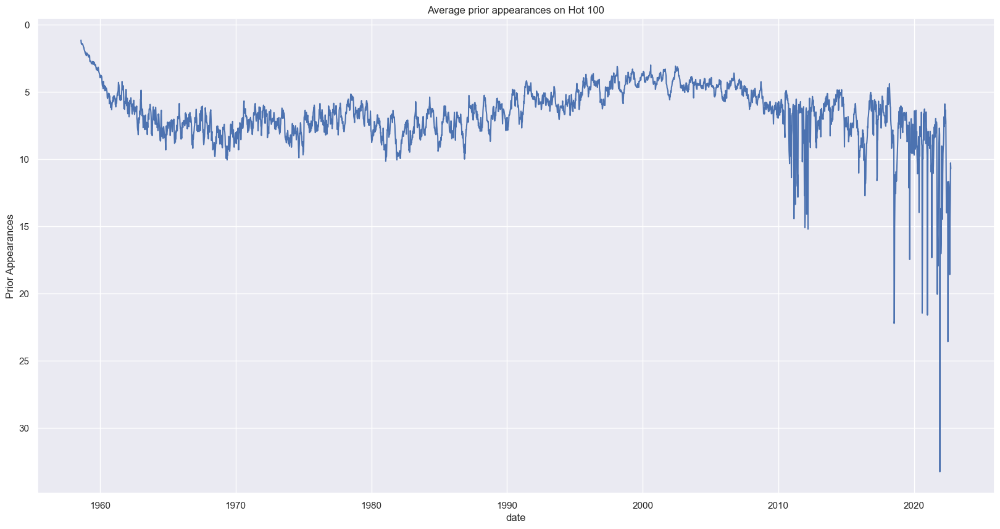

In [52]:
plt.figure(figsize=(20, 10))

# Confidence interval calculation takes forever, so it is disabled
ax = sns.lineplot(
    x=hot_100_appearances["date"], y=hot_100_appearances["appearances"], ci=None
)

ax.invert_yaxis()

plt.title("Average prior appearances on Hot 100")
plt.ylabel("Prior Appearances")
plt.show()

This graph is too spiky to show any real trend; let us run a 12-week rolling average (~3 months) on the data.

In [53]:
rolling = (
    hot_100_appearances.groupby("date")["appearances"]
    .mean()
    .rolling(12)
    .mean()
    .dropna()
)

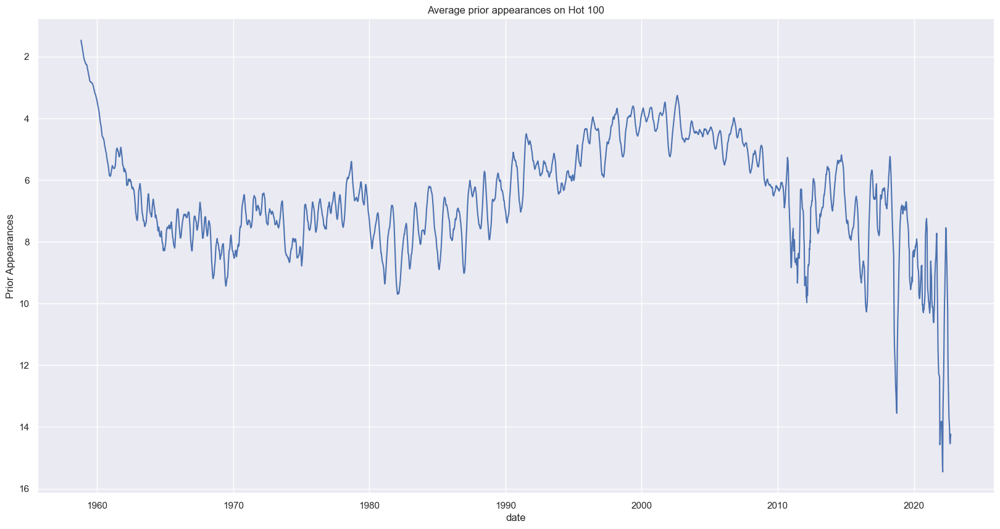

In [54]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(x=rolling.index, y=rolling.values, ci=None)

ax.invert_yaxis()

plt.title("Average prior appearances on Hot 100")
plt.ylabel("Prior Appearances")
plt.show()

It seems that newer artists were most popular in the 2000s, and have recently actually fallen increasingly out of favour. With the rise of celebrity culture and "stanning", perhaps that offers an explanation to this trend.

Also, there appears to be some periodicity in this, especially looking at the 1980 - 2000 region. Let us investigate this with an autocorrelation plot.

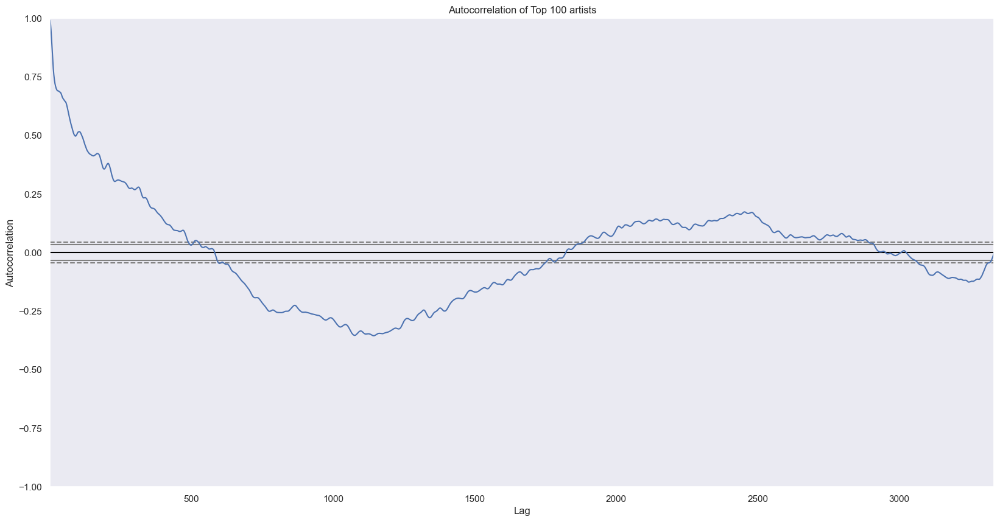

In [55]:
plt.figure(figsize=(20, 10))

pd.plotting.autocorrelation_plot(rolling)

plt.title("Autocorrelation of Top 100 artists")
plt.show()

Since a lag of ~1100 weeks is ridiculous for an autocorrelation, it seems there is no periodicity.

#### With Spotify Data

##### Merging

Now, let us do an analysis, including the Spotify data, for a hopefully clearer picture.

The first step is to merge the *Billboard Hot 100* data with the Spotify search data.

In [56]:
hot_100_spotify = hot_100.merge(
    spotify_search, on=["song_name", "artist"], how="outer"
).sort_values(by=["date", "ranking"])

In [57]:
hot_100_spotify

,date,ranking,song_name,artist,track_id,album_name,track_name,album_type,popularity,album_artists,track_artists,length_ms,explicit
0,1958-08-09,1,Poor Little Fool,Ricky Nelson,5ayybTSXNwcarDtxQKqvWX,Ricky Nelson (Expanded Edition / Remastered),Poor Little Fool - Remastered,album,53.0,"[""Ricky Nelson""]","[""Ricky Nelson""]",153933.0,False
11,1958-08-09,2,Patricia,Perez Prado And His Orchestra,2bwhOdCOLgQ8v6xStAqnju,Coleccion Original,Patricia,album,25.0,"[""Pérez Prado""]","[""Pérez Prado""]",140000.0,False
25,1958-08-09,3,Splish Splash,Bobby Darin,40fD7ct05FvQHLdQTgJelG,Bobby Darin,Splish Splash,album,59.0,"[""Bobby Darin""]","[""Bobby Darin""]",131719.0,False
33,1958-08-09,4,Hard Headed Woman,Elvis Presley With The Jordanaires,3SU1TXJtAsf8jCKdUeYy53,Elvis 30 #1 Hits (Expanded Edition),Hard Headed Woman - From the Hal Wallis Produc...,album,53.0,"[""Elvis Presley""]","[""Elvis Presley""]",114240.0,False
41,1958-08-09,5,When,Kalin Twins,3HZJ9BLBpDya4p71VfXSWp,The Kalin Twins,When,album,42.0,"[""Kalin Twins""]","[""Kalin Twins""]",146573.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333606,2022-09-17,96,Thought You Should Know,Morgan Wallen,6NHpyYvJyQsg2nXXzGYc2R,Thought You Should Know,Thought You Should Know,single,78.0,"[""Morgan Wallen""]","[""Morgan Wallen""]",215571.0,True
334313,2022-09-17,97,Country On,Luke Bryan,1tRxwf8Q0AcshfHuaD86Yt,Country On,Country On,single,71.0,"[""Luke Bryan""]","[""Luke Bryan""]",236455.0,False
334584,2022-09-17,98,Static,Steve Lacy,4OmfWzukSVD140NiAIEjem,Gemini Rights,Static,album,85.0,"[""Steve Lacy""]","[""Steve Lacy""]",156506.0,True
334585,2022-09-17,99,Billie Eilish.,Armani White,27ZZdyTSQWI7Cug2d2PkqV,BILLIE EILISH.,BILLIE EILISH.,single,87.0,"[""Armani White""]","[""Armani White""]",99282.0,True


Some songs were not found by Spotify; let us analyse that data first.

In [58]:
no_data = hot_100_spotify[hot_100_spotify.isna().any(axis=1)]

In [59]:
no_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1317 entries, 404 to 310551
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           1317 non-null   datetime64[ns]
 1   ranking        1317 non-null   int64         
 2   song_name      1317 non-null   object        
 3   artist         1317 non-null   object        
 4   track_id       0 non-null      object        
 5   album_name     0 non-null      object        
 6   track_name     0 non-null      object        
 7   album_type     0 non-null      object        
 8   popularity     0 non-null      float64       
 9   album_artists  0 non-null      object        
 10  track_artists  0 non-null      object        
 11  length_ms      0 non-null      float64       
 12  explicit       0 non-null      object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(9)
memory usage: 144.0+ KB


Note that the nulls are only due to Spotify not having the songs; this makes sense as we only scraped them based on the *Billboard Hot 100* data.

##### Missing Data Analysis

Now, let us visualise this missing data, to determine the consequences of dropping them.

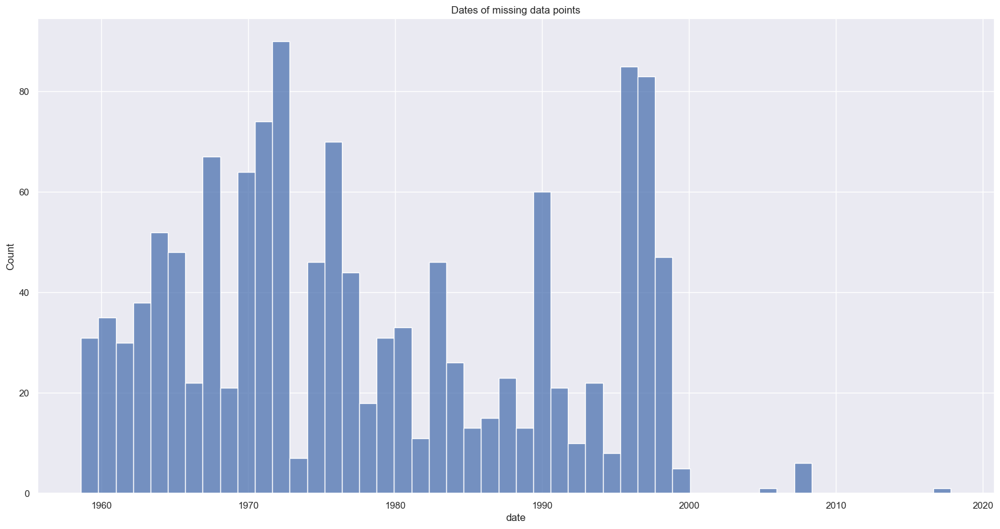

In [60]:
plt.figure(figsize=(20, 10))

sns.histplot(data=no_data["date"], bins=50)

plt.title("Dates of missing data points")

plt.show()

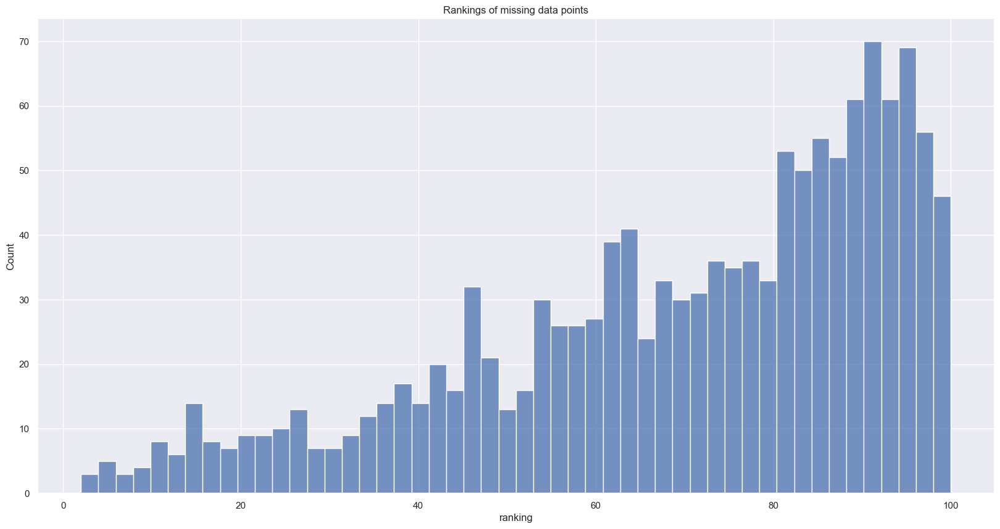

In [61]:
plt.figure(figsize=(20, 10))

sns.histplot(data=no_data["ranking"], bins=50)

plt.title("Rankings of missing data points")

plt.show()

As expected, given Spotify's newness, most of the data missing is for old songs, topping before 2000. Also, the occurrence of missing data increases the lower down on the chart we go.

However, since we have the names of the artists from *Billboard*, too, we can simply substitute the *Billboard* names for the missing data instead.

##### Chart Toppers

Repeating the analysis, let us see who has the most top charting songs now.

In [62]:
artist_appearance_counts = {}
appeared_songs = set()

In [63]:
def count_previous_appearances(row):
    artist = row["artist"]
    song_name = row["song_name"]
    track_artists = row["track_artists"]

    if not isinstance(track_artists, float):
        artists = tuple(orjson.loads(track_artists))
    else:
        artists = (artist,)

    if (song_name, artists) in appeared_songs:
        return tuple(artist_appearance_counts[artist] for artist in artists)

    appeared_songs.add((song_name, artists))

    for artist in artists:
        if artist not in artist_appearance_counts:
            artist_appearance_counts[artist] = 0
        artist_appearance_counts[artist] += 1

    return tuple(artist_appearance_counts[artist] for artist in artists)

In [64]:
hot_100_appearances = hot_100_spotify[
    ["date", "artist", "song_name", "track_artists"]
].copy()

In [65]:
hot_100_appearances["appearances"] = hot_100_appearances.progress_apply(
    count_previous_appearances, axis=1
)

  0%|          | 0/334587 [00:00<?, ?it/s]

In [66]:
hot_100_appearances

,date,artist,song_name,track_artists,appearances
0,1958-08-09,Ricky Nelson,Poor Little Fool,"[""Ricky Nelson""]","(1,)"
11,1958-08-09,Perez Prado And His Orchestra,Patricia,"[""Pérez Prado""]","(1,)"
25,1958-08-09,Bobby Darin,Splish Splash,"[""Bobby Darin""]","(1,)"
33,1958-08-09,Elvis Presley With The Jordanaires,Hard Headed Woman,"[""Elvis Presley""]","(1,)"
41,1958-08-09,Kalin Twins,When,"[""Kalin Twins""]","(1,)"
...,...,...,...,...,...
333606,2022-09-17,Morgan Wallen,Thought You Should Know,"[""Morgan Wallen""]","(28,)"
334313,2022-09-17,Luke Bryan,Country On,"[""Luke Bryan""]","(36,)"
334584,2022-09-17,Steve Lacy,Static,"[""Steve Lacy""]","(2,)"
334585,2022-09-17,Armani White,Billie Eilish.,"[""Armani White""]","(1,)"


In [67]:
appearances = pd.Series(artist_appearance_counts).sort_values(ascending=False)

In [68]:
appearances

Drake           266
Glee Cast       206
Lil Wayne       167
Taylor Swift    164
Future          138
               ... 
Leroy Gomez       1
dj Shawny         1
Mike Brooks       1
Belle Epoque      1
Armani White      1
Length: 9314, dtype: int64

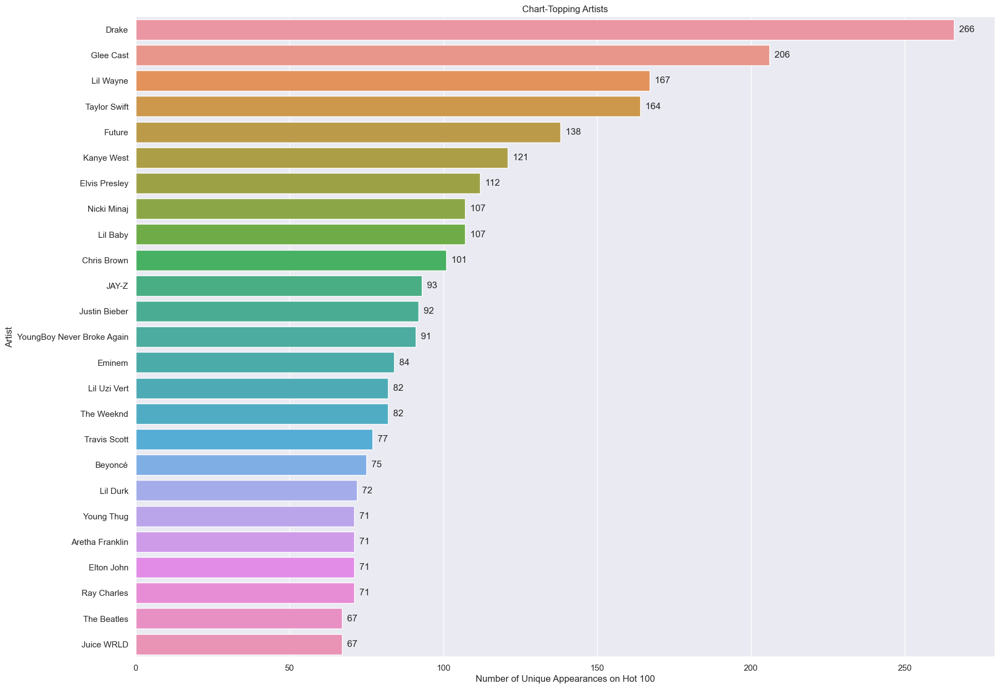

In [69]:
plt.figure(figsize=(20, 15))

ax = sns.barplot(y=appearances.head(25).index, x=appearances.head(25).values)
ax.bar_label(ax.containers[0], fmt="  %d")

plt.ylabel("Artist")
plt.xlabel("Number of Unique Appearances on Hot 100")
plt.title("Chart-Topping Artists")

plt.show()

Drake has taken the throne from Glee in this analysis. As we can see, it is now counting artists better, with all top artists appearing much more frequently. Hopefully, this represents the real distribution of the *Hot 100* appearances better.

##### Artist Distribution

Additionally, let us see the distribution of appearances by artist:

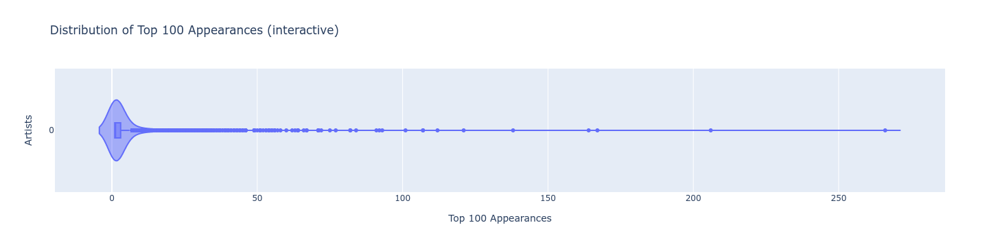

In [70]:
fig = px.violin(
    appearances,
    orientation="h",
    box=True,
    labels={"value": "Top 100 Appearances", "variable": "Artists"},
    title="Distribution of Top 100 Appearances (interactive)",
)
fig.show()

In [71]:
appearances.describe()

count    9314.000000
mean        3.843891
std         8.564189
min         1.000000
25%         1.000000
50%         1.000000
75%         3.000000
max       266.000000
dtype: float64

As can be seen by both the violin and the 5-number summary, it is incredibly right-skewed, with most artists appearing only once.

##### Prior Appearances

Now, let us analyse the "newness" of artists on the chart, using a prior appearances approach;

In [72]:
# flattening the tuples in "appearances"
average_appearances = (
    hot_100_appearances.groupby("date")["appearances"]
    .apply(tuple)
    .apply(lambda l: tuple(elem for nested in l for elem in nested))
    .apply(np.mean)
    .rolling(12)
    .mean()
)

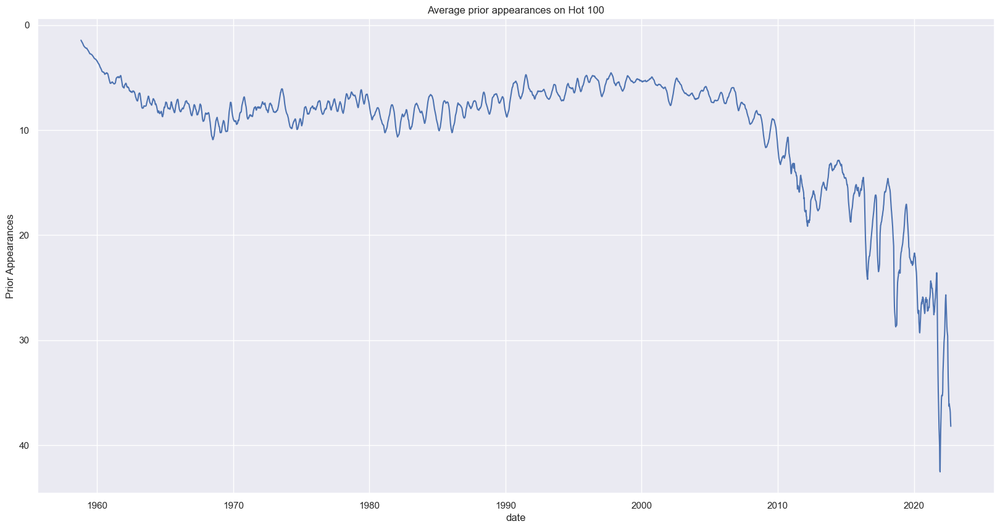

In [73]:
plt.figure(figsize=(20, 10))

# Confidence interval calculation takes forever, so it is disabled
ax = sns.lineplot(x=average_appearances.index, y=average_appearances.values, ci=None)

ax.invert_yaxis()

plt.title("Average prior appearances on Hot 100")
plt.ylabel("Prior Appearances")
plt.show()

This graph paints a clearer picture than above. We see that it was actually quite constant from 1970 to 2000, before a huge drop-off in recent times, with less hit songs by people without previous hits.

However, note that this graph is prone to outliers. For example, Drake, who has had 266 charting songs, is a huge outlier.

##### First Appearances

Thus, another way to picture this is to show when everyone's first appearance was:

In [74]:
hot_100_first_appearances = hot_100_appearances[
    hot_100_appearances["appearances"].apply(lambda appearances: 1 in appearances)
]

In [75]:
hot_100_first_count = (
    hot_100_first_appearances.groupby("date")["artist"].count().rolling(12).mean()
)
hot_100_first_count

date
1958-08-09          NaN
1958-08-16          NaN
1958-08-23          NaN
1958-08-30          NaN
1958-09-06          NaN
                ...    
2022-08-20    17.916667
2022-08-27    18.000000
2022-09-03    18.083333
2022-09-10    18.416667
2022-09-17    19.083333
Name: artist, Length: 3346, dtype: float64

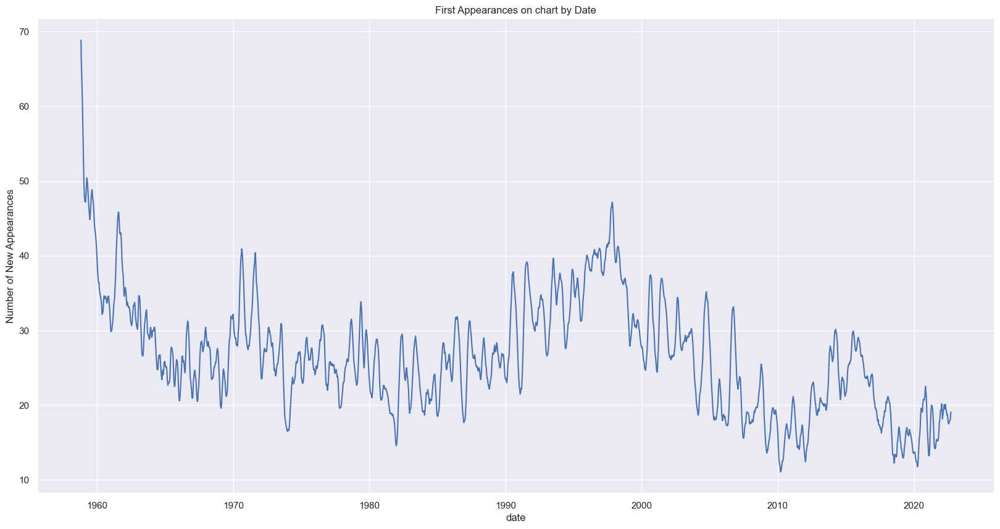

In [76]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=hot_100_first_count.index, y=hot_100_first_count.values, ci=None)

plt.title("First Appearances on chart by Date")
plt.ylabel("Number of New Appearances")

plt.show()

This plot needs more aggressive rolling to show the general trend.

In [77]:
hot_100_first_count = hot_100_first_count.rolling(36).mean()

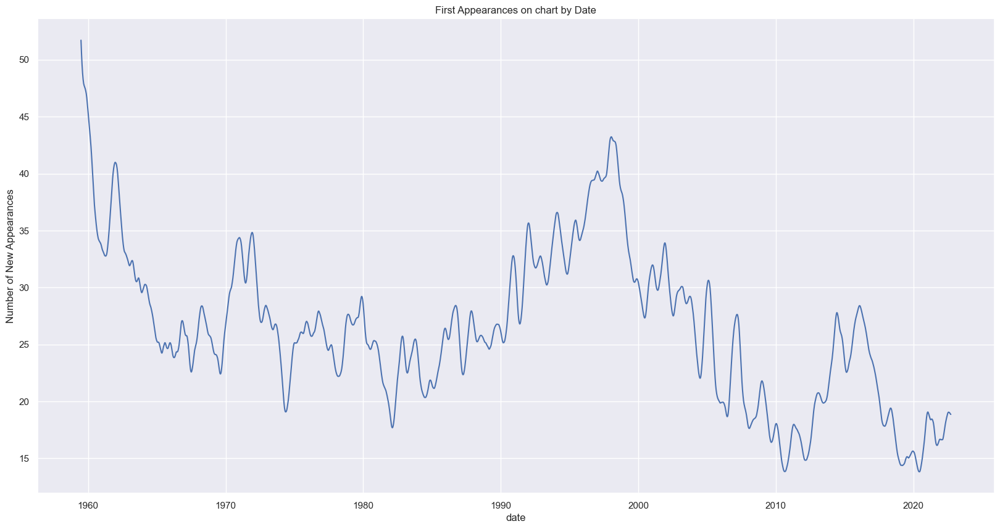

In [78]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=hot_100_first_count.index, y=hot_100_first_count.values, ci=None)

plt.title("First Appearances on chart by Date")
plt.ylabel("Number of New Appearances")

plt.show()

Interestingly, we see a spike around 1997, where around half of the *Hot 100* was taken by new artists. Yet, currently, we are at an all-time low for new contenders for stardom, corroborating with the average prior appearances graph above.

##### Spotify Popularity

Yet, the *Billboard Hot 100* is not the only measure of popularity. Indeed, Spotify has its own popularity metric, a number between 0 and 100, that represents how much interest there currently is in a song. The *Billboard Hot 100* prioritises music sales, which may not be a good measure of popularity anymore.

Thus, let us explore artists vs. the popularity of their songs on Spotify. Due to the the newness of Spotify, let us restrict our analysis to songs released past 2000.

In [79]:
hot_100_spotify_2000 = hot_100_spotify[hot_100_spotify["date"] >= np.datetime64("2000")]

In [80]:
hot_100_spotify_2000

,date,ranking,song_name,artist,track_id,album_name,track_name,album_type,popularity,album_artists,track_artists,length_ms,explicit
215090,2000-01-01,1,Smooth,Santana Featuring Rob Thomas,4LFAij97vWFISgjMY9FrPh,Drew's Famous # 1 Karaoke Hits: Sing the Hits ...,Smooth (As Made Famous by Santana Featuring Ro...,album,0.0,"[""The Karaoke Crew""]","[""The Karaoke Crew""]",240013.0,False
215429,2000-01-01,2,Back At One,Brian McKnight,6mwA6YiKDjAUG8kWvRRUPh,Back At One,Back At One,album,69.0,"[""Brian McKnight""]","[""Brian McKnight""]",263666.0,False
216119,2000-01-01,3,I Wanna Love You Forever,Jessica Simpson,5gZEhPrN1VLqTG1nIAXeNK,Sweet Kisses,I Wanna Love You Forever,album,57.0,"[""Jessica Simpson""]","[""Jessica Simpson""]",263800.0,False
215550,2000-01-01,4,My Love Is Your Love,Whitney Houston,1ckU1EhAO0Nr73QYw24SWJ,My Love Is Your Love,My Love Is Your Love,album,67.0,"[""Whitney Houston""]","[""Whitney Houston""]",261573.0,False
216224,2000-01-01,5,I Knew I Loved You,Savage Garden,6nozDLxeL0TE4MS9GqYU1v,Affirmation,I Knew I Loved You,album,70.0,"[""Savage Garden""]","[""Savage Garden""]",250360.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333606,2022-09-17,96,Thought You Should Know,Morgan Wallen,6NHpyYvJyQsg2nXXzGYc2R,Thought You Should Know,Thought You Should Know,single,78.0,"[""Morgan Wallen""]","[""Morgan Wallen""]",215571.0,True
334313,2022-09-17,97,Country On,Luke Bryan,1tRxwf8Q0AcshfHuaD86Yt,Country On,Country On,single,71.0,"[""Luke Bryan""]","[""Luke Bryan""]",236455.0,False
334584,2022-09-17,98,Static,Steve Lacy,4OmfWzukSVD140NiAIEjem,Gemini Rights,Static,album,85.0,"[""Steve Lacy""]","[""Steve Lacy""]",156506.0,True
334585,2022-09-17,99,Billie Eilish.,Armani White,27ZZdyTSQWI7Cug2d2PkqV,BILLIE EILISH.,BILLIE EILISH.,single,87.0,"[""Armani White""]","[""Armani White""]",99282.0,True


In [81]:
artist_popularity = {}
appeared_songs = set()

In [82]:
def get_popularity(row):
    artist = row["artist"]
    song_name = row["song_name"]
    track_artists = row["track_artists"]

    if not isinstance(track_artists, float):
        artists = tuple(orjson.loads(track_artists))
    else:
        artists = (artist,)

    if (song_name, artists) in appeared_songs:
        return None

    appeared_songs.add((song_name, artists))

    for artist in artists:
        if artist not in artist_popularity:
            artist_popularity[artist] = []
        artist_popularity[artist].append(row["popularity"])

    return None

In [83]:
hot_100_spotify_2000.progress_apply(get_popularity, axis=1);

  0%|          | 0/118600 [00:00<?, ?it/s]

In [84]:
artist_popularity = pd.DataFrame(
    artist_popularity.items(), columns=["artist", "popularities"]
)

Now, let us calculate the mean popularity, maximum popularity, and amount of songs per artist.

In [85]:
def calc_stats(row):
    popularities = row["popularities"]
    return np.mean(popularities), np.max(popularities), len(popularities)

In [86]:
artist_popularity[["mean", "max", "count"]] = artist_popularity.progress_apply(
    calc_stats, result_type="expand", axis=1
)

  0%|          | 0/2924 [00:00<?, ?it/s]

In [87]:
artist_popularity.drop(columns=["popularities"], inplace=True)

As we saw from above, lots of artists appear only once. For the purposes of this analysis, we will only look at those with at least 5 songs.

In [88]:
artist_popularity = artist_popularity[artist_popularity["count"] >= 5]

In [89]:
artist_popularity

,artist,mean,max,count
0,The Karaoke Crew,0.071429,1.0,28.0
2,Jessica Simpson,46.333333,57.0,9.0
3,Whitney Houston,53.923077,81.0,13.0
5,Marc Anthony,55.333333,76.0,6.0
10,*NSYNC,62.000000,71.0,6.0
...,...,...,...,...
2703,Pooh Shiesty,41.285714,70.0,7.0
2722,Giveon,78.200000,86.0,5.0
2726,Silk Sonic,70.714286,84.0,7.0
2727,EST Gee,63.142857,68.0,7.0


Now, let us plot a scatterplot of count vs. mean and max:

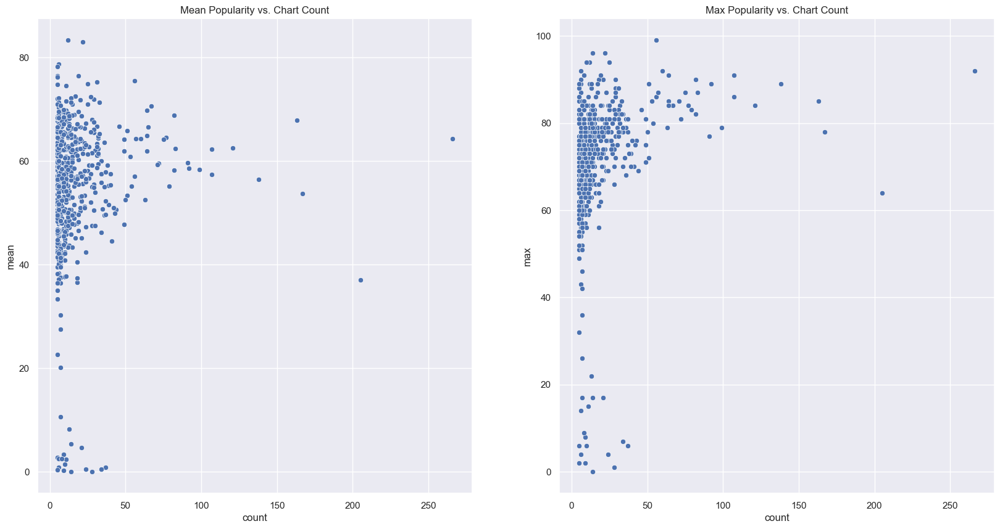

In [90]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

ax1 = sns.scatterplot(
    y=artist_popularity["mean"], x=artist_popularity["count"], ax=axs[0]
)
ax2 = sns.scatterplot(
    y=artist_popularity["max"], x=artist_popularity["count"], ax=axs[1]
)

ax1.set_title("Mean Popularity vs. Chart Count")
ax2.set_title("Max Popularity vs. Chart Count")

plt.show()

With less songs, the popularities are much more variable. And yet, looking at the max popularity chart, it seems that certain groups are achieving comparable max popularity to larger artists, even with much less songs.

Let us check for correlation with the Pearson R coefficient;

In [91]:
stats.pearsonr(y=artist_popularity["mean"], x=artist_popularity["count"])

PearsonRResult(statistic=0.08561973061436805, pvalue=0.04154982947457834)

In [92]:
stats.pearsonr(y=artist_popularity["max"], x=artist_popularity["count"])

PearsonRResult(statistic=0.23462755827988901, pvalue=1.570537383840225e-08)

The Pearson R coefficient tells us that there is a low correlation for maximum popularity, and almost no correlation for the mean popularity. With more songs, the maximum popularity is likely to go up; this is thus expected.

All-in-all, it seems this line of analysis has not been very fruitful, due to the randomness of the data. It does, however, show that songs by small artists can be just as popular as those from bigger artists.

<a id='q3eda'/>

### Q3: Song Happiness/Valence

#### Valence Distribution

For this question, we will be using the "valence" metric from the Spotify audio analysis.

Unfortunately, for this question, we can no longer work around the nulls in the dataset, and we must drop them, as there is no real way to replace the valence data.

In [93]:
hot_100_analysis = (
    hot_100_spotify.dropna()
    .merge(spotify_audio_analysis, on="track_id", how="inner")
    .sort_values(by=["date", "ranking"])
    .reset_index(drop=True)
)

In [94]:
hot_100_analysis

,date,ranking,song_name,artist,track_id,album_name,track_name,album_type,popularity,album_artists,...,danceability,energy,instrumentalness,key,loudness,mode,speechiness,tempo,valence,time_signature
0,1958-08-09,1,Poor Little Fool,Ricky Nelson,5ayybTSXNwcarDtxQKqvWX,Ricky Nelson (Expanded Edition / Remastered),Poor Little Fool - Remastered,album,53.0,"[""Ricky Nelson""]",...,0.474,0.338,0.000000,0,-11.528,1,0.0299,154.596,0.810,4
1,1958-08-09,2,Patricia,Perez Prado And His Orchestra,2bwhOdCOLgQ8v6xStAqnju,Coleccion Original,Patricia,album,25.0,"[""Pérez Prado""]",...,0.699,0.715,0.415000,1,-5.976,1,0.0391,137.373,0.810,4
2,1958-08-09,3,Splish Splash,Bobby Darin,40fD7ct05FvQHLdQTgJelG,Bobby Darin,Splish Splash,album,59.0,"[""Bobby Darin""]",...,0.645,0.943,0.000000,0,-1.526,1,0.0393,147.768,0.965,4
3,1958-08-09,4,Hard Headed Woman,Elvis Presley With The Jordanaires,3SU1TXJtAsf8jCKdUeYy53,Elvis 30 #1 Hits (Expanded Edition),Hard Headed Woman - From the Hal Wallis Produc...,album,53.0,"[""Elvis Presley""]",...,0.616,0.877,0.000119,0,-4.232,1,0.1080,97.757,0.919,4
4,1958-08-09,5,When,Kalin Twins,3HZJ9BLBpDya4p71VfXSWp,The Kalin Twins,When,album,42.0,"[""Kalin Twins""]",...,0.666,0.468,0.000041,6,-9.823,1,0.0315,93.018,0.946,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333213,2022-09-17,96,Thought You Should Know,Morgan Wallen,6NHpyYvJyQsg2nXXzGYc2R,Thought You Should Know,Thought You Should Know,single,78.0,"[""Morgan Wallen""]",...,0.529,0.695,0.000012,6,-6.174,1,0.0278,139.993,0.514,4
333214,2022-09-17,97,Country On,Luke Bryan,1tRxwf8Q0AcshfHuaD86Yt,Country On,Country On,single,71.0,"[""Luke Bryan""]",...,0.520,0.751,0.000007,5,-5.064,1,0.0551,156.044,0.519,4
333215,2022-09-17,98,Static,Steve Lacy,4OmfWzukSVD140NiAIEjem,Gemini Rights,Static,album,85.0,"[""Steve Lacy""]",...,0.335,0.305,0.631000,1,-12.661,1,0.0741,79.001,0.215,5
333216,2022-09-17,99,Billie Eilish.,Armani White,27ZZdyTSQWI7Cug2d2PkqV,BILLIE EILISH.,BILLIE EILISH.,single,87.0,"[""Armani White""]",...,0.900,0.509,0.000002,1,-6.647,1,0.2570,100.007,0.765,4


First, a histogram of valence;

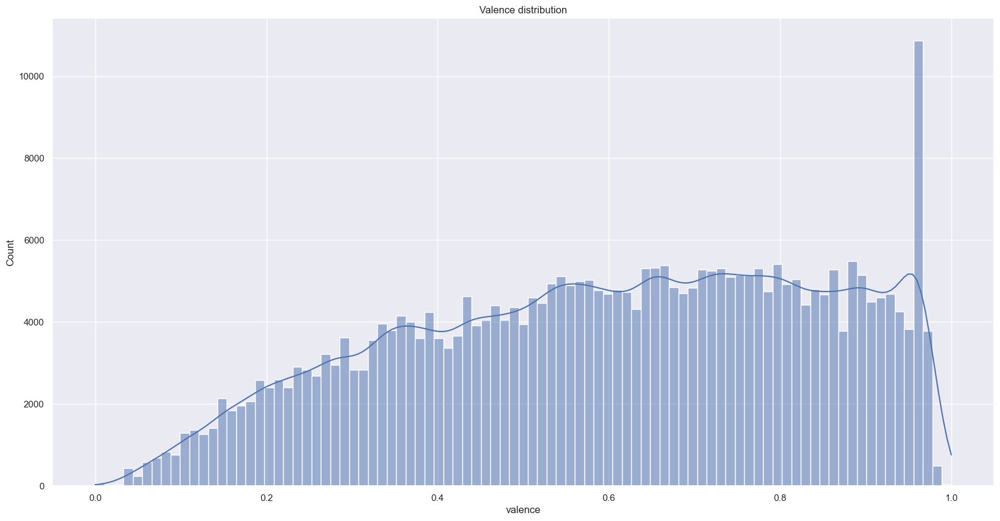

In [95]:
plt.figure(figsize=(20, 10))

sns.histplot(hot_100_analysis["valence"], kde=True)

plt.title("Valence distribution")

plt.show()

Seems that, in general, there are more happy than sad songs in the dataset. Also, note the huge peak at ~0.95 (perhaps an artifact of sigmoid activation in Spotify's AI?). Note that the valence is left-skewed.

#### Valence Over Time

Now, for preliminary analysis, let us do a lineplot of valence against time.

In [96]:
mean_valence = hot_100_analysis.groupby("date")["valence"].mean()

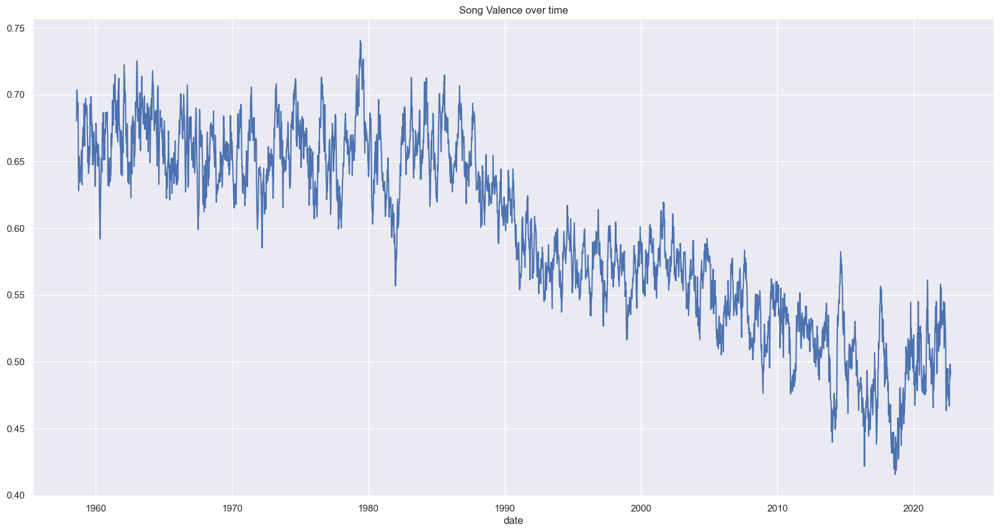

In [97]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=mean_valence.index, y=mean_valence.values, ci=None)

plt.title("Song Valence over time")

plt.show()

As we can see, there is a clear decreasing trend, from 1990 to 2020. A rolling average can probably help us see this trend better:

In [98]:
rolling = mean_valence.rolling(72).mean()

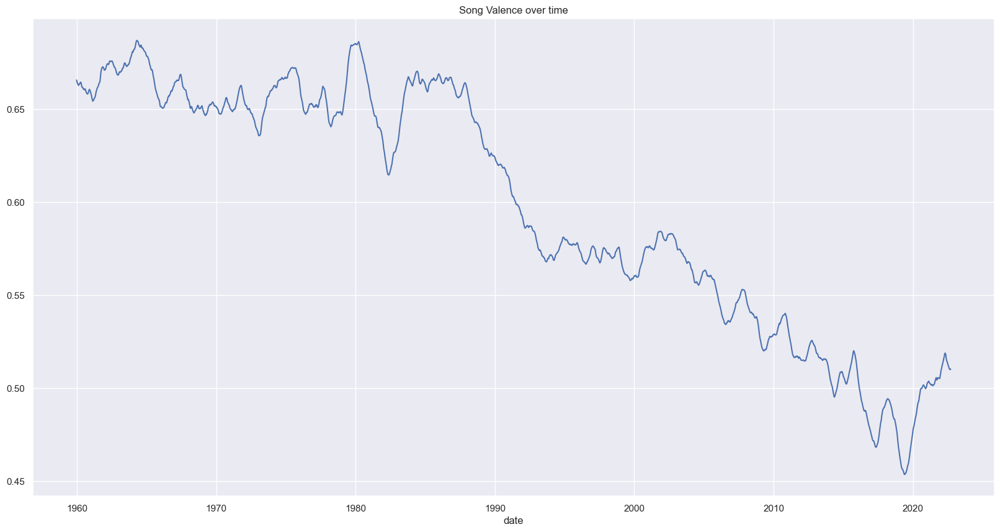

In [99]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=rolling.index, y=rolling.values, ci=None)

plt.title("Song Valence over time")

plt.show()

#### Valence, Higher on the Chart

However, even though sad songs are charting much more now, is this true if we limit it to the top of the top? What if we limit to top 20, top 10, top 5 even?

In [100]:
cutoffs = [50, 20, 10, 5]

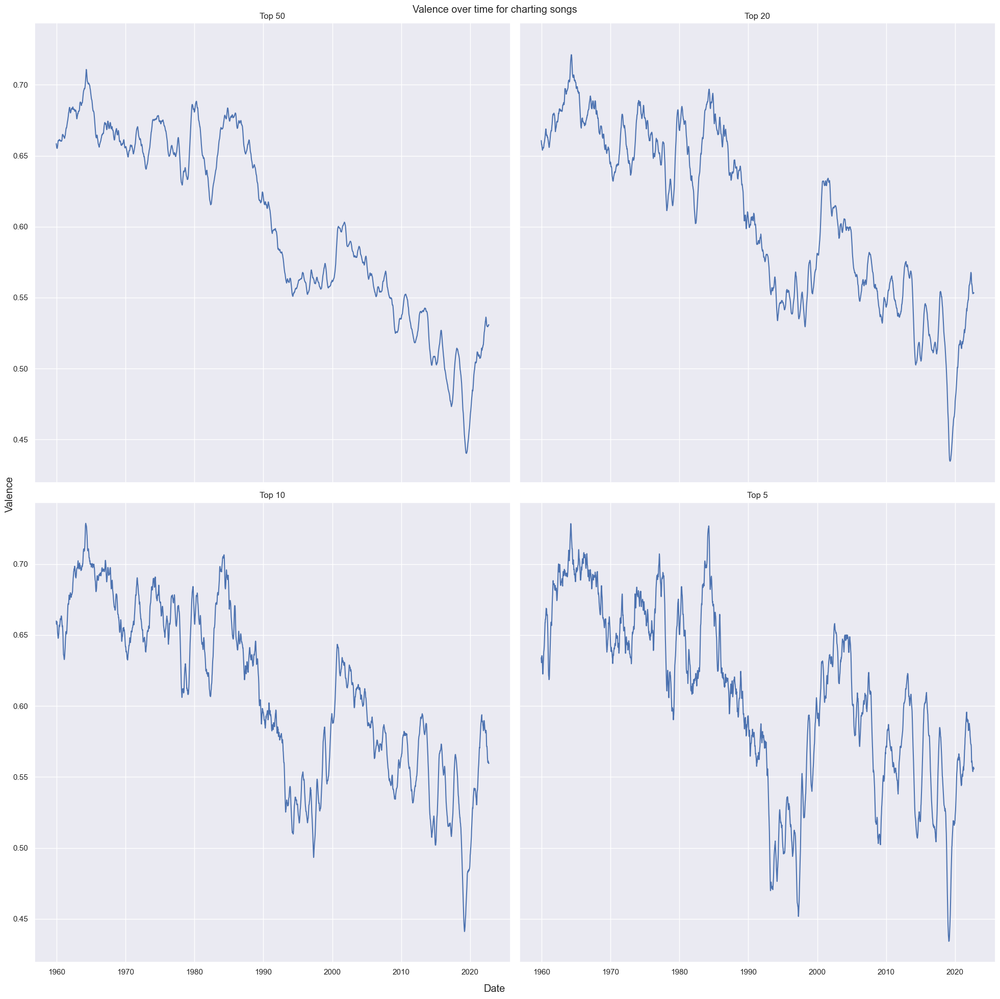

In [101]:
fig, axs = plt.subplots(2, 2, figsize=(20, 20), sharex=True, sharey=True)

for plot_num, cutoff in enumerate(cutoffs):
    to_plot = hot_100_analysis[hot_100_analysis["ranking"] <= cutoff]
    to_plot = to_plot.groupby("date")["valence"].mean()
    to_plot = to_plot.rolling(72).mean()

    row, col = divmod(plot_num, 2)

    cax = sns.lineplot(x=to_plot.index, y=to_plot.values, ax=axs[row, col])

    cax.set_title(f"Top {cutoff}")
    cax.set_xlabel(None)

fig.supylabel("Valence")
fig.supxlabel("Date")

fig.suptitle("Valence over time for charting songs")

fig.tight_layout()

fig.show()

The trend stays, save for a spate of sad top-charting songs between 1990 to 2000, seen from the Top 10 and Top 5 chart, which had around the same valence as the average song now.

#### Spotify Popularity

Now, what if we look at Spotify's popularity metric instead? Are sadder songs now getting more popular on Spotify?

Let's run a scatterplot of popularity of sad songs, restricted to the year 2020.

In [102]:
hot_100_analysis_2020 = hot_100_analysis[
    (hot_100_analysis["date"] >= np.datetime64("2020"))
    & (hot_100_analysis["date"] < np.datetime64("2021"))
].copy()

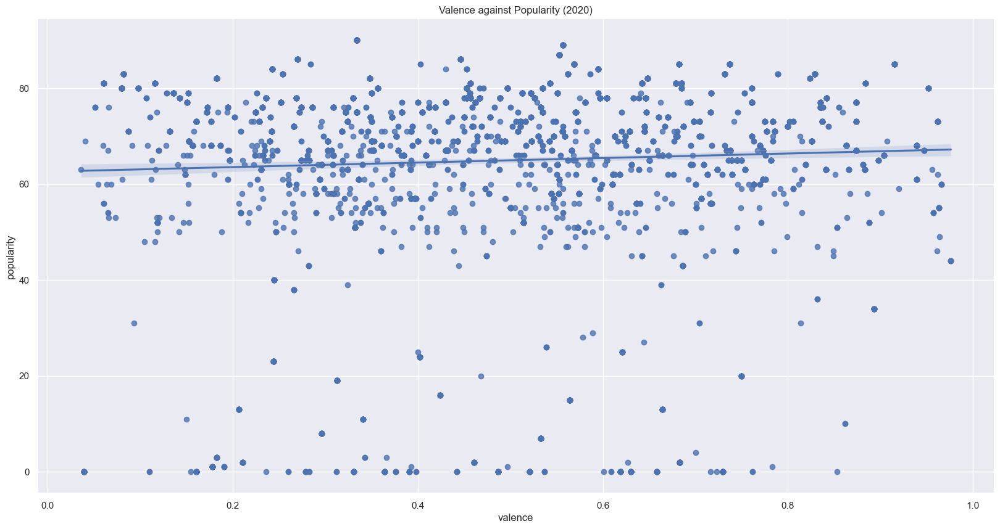

In [103]:
plt.figure(figsize=(20, 10))

sns.regplot(y=hot_100_analysis_2020["popularity"], x=hot_100_analysis_2020["valence"])

plt.title("Valence against Popularity (2020)")

plt.show()

In [104]:
stats.pearsonr(
    y=hot_100_analysis_2020["popularity"], x=hot_100_analysis_2020["valence"]
)

PearsonRResult(statistic=0.04923916939129917, pvalue=0.00038233247233228064)

The results appear inconclusive. It seems that no matter the happiness, songs will still be popular, according to Spotify's algorithm.

We can try this again with a earlier year:

In [105]:
hot_100_analysis_2000 = hot_100_analysis[
    (hot_100_analysis["date"] >= np.datetime64("2000"))
    & (hot_100_analysis["date"] < np.datetime64("2001"))
].copy()

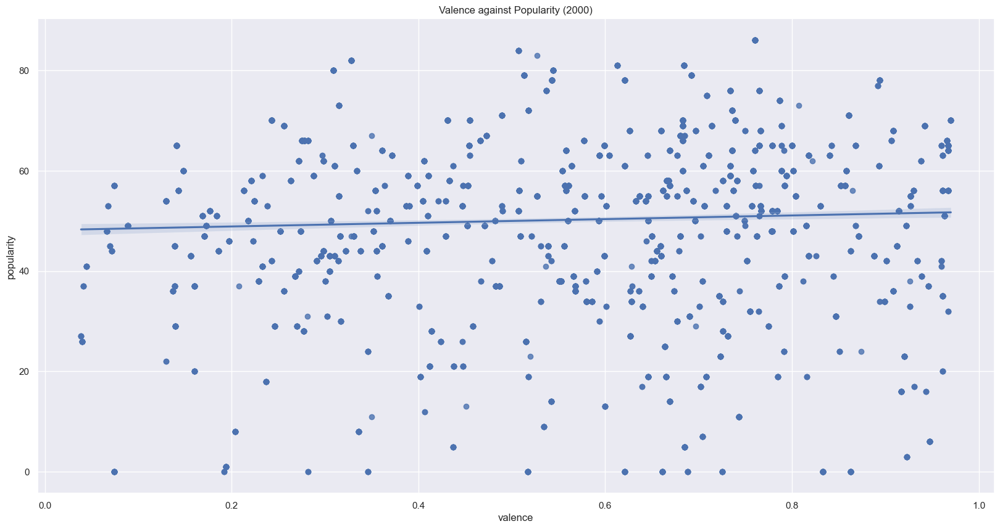

In [106]:
plt.figure(figsize=(20, 10))

sns.regplot(y=hot_100_analysis_2000["popularity"], x=hot_100_analysis_2000["valence"])

plt.title("Valence against Popularity (2000)")

plt.show()

In [107]:
stats.pearsonr(
    y=hot_100_analysis_2000["popularity"], x=hot_100_analysis_2000["valence"]
)

PearsonRResult(statistic=0.04681611784803998, pvalue=0.0006512259774944308)

Similarly, it seems that there is no real correlation between Spotify's popularity and the music's happiness.

#### Maximum Chart Ranking

We can also analyse the maximum chart ranking based on valence.

First, let us set the ranking of each track to its max ranking (ever, since a song can peak just outside the year)

In [108]:
best_placements = hot_100_analysis.groupby("track_id")["ranking"].min()

In [109]:
hot_100_analysis_2020["ranking"] = hot_100_analysis_2020["track_id"].apply(
    lambda track: best_placements[track]
)

In [110]:
hot_100_analysis_2000["ranking"] = hot_100_analysis_2000["track_id"].apply(
    lambda track: best_placements[track]
)

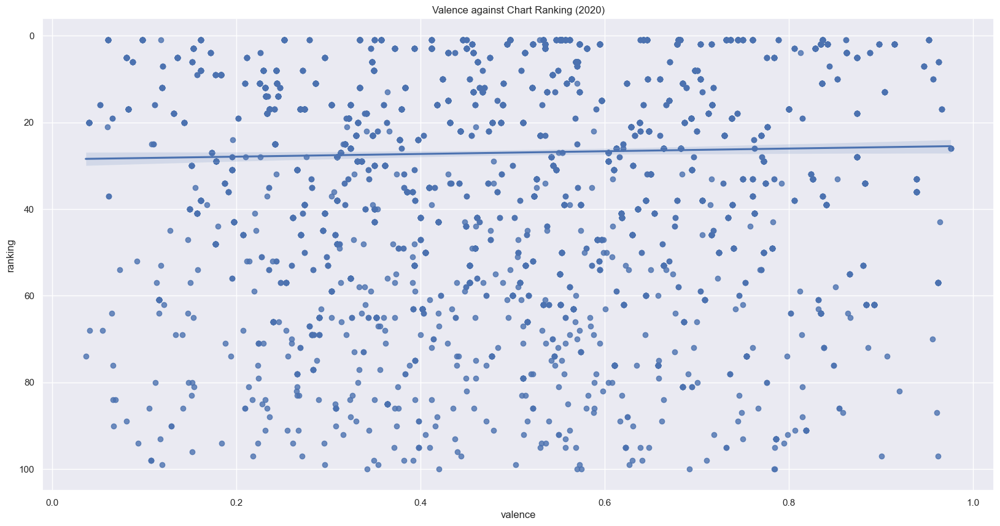

In [111]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["valence"])

ax.invert_yaxis()
plt.title("Valence against Chart Ranking (2020)")

plt.show()

In [112]:
stats.pearsonr(y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["valence"])

PearsonRResult(statistic=-0.027652704428732924, pvalue=0.04615568801548025)

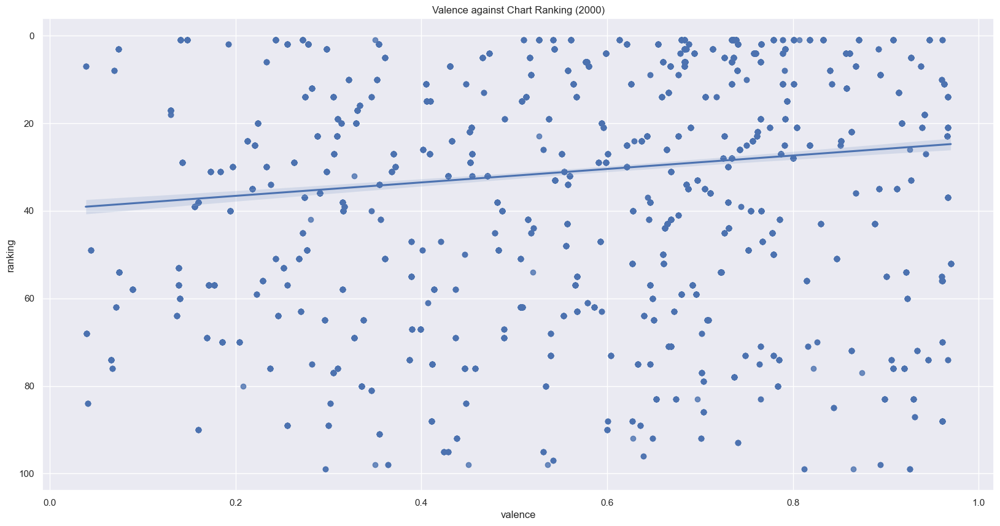

In [113]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(y=hot_100_analysis_2000["ranking"], x=hot_100_analysis_2000["valence"])

ax.invert_yaxis()
plt.title("Valence against Chart Ranking (2000)")

plt.show()

In [114]:
stats.pearsonr(y=hot_100_analysis_2000["ranking"], x=hot_100_analysis_2000["valence"])

PearsonRResult(statistic=-0.13867615145456244, pvalue=3.580629503902204e-24)

In conclusion, it seems that the average charting song is sadder than before. Yet, it seems that for songs on the chart, sad songs seem to rank equally to those that are happier. For musicians, sadder songs can make you chart more often, but yet your chart position is likely not going to be much higher than the happier songs.

#### Top 25 Valence

As a supplement, here's an animated graph of the valence of top 25 charting songs over time:

In [115]:
date_list = hot_100_analysis.groupby("date")["ranking"].count().index.tolist()

In [116]:
one_day = pd.Timedelta(days=1)

In [117]:
buckets = date_list[::30] + [date_list[-1] + one_day]

In [118]:
def cut_into_buckets(df):
    df = df.set_index("date")
    data = pd.Series(dtype="float64")
    for bucket_num in range(len(buckets) - 1):
        data[str(buckets[bucket_num].date())] = df.loc[
            buckets[bucket_num] : buckets[bucket_num + 1] - one_day, "valence"
        ].mean()
    return data

In [119]:
hot_100_analysis_dates = hot_100_analysis.groupby("ranking")[
    ["date", "valence"]
].progress_apply(cut_into_buckets)

  0%|          | 0/100 [00:00<?, ?it/s]

*(bucket the Hot 100 to not render as many frames)*

In [120]:
hot_100_analysis_dates = hot_100_analysis_dates.stack().reset_index()

In [121]:
hot_100_analysis_dates.columns = ["ranking", "date", "valence"]

In [122]:
hot_100_analysis_dates = hot_100_analysis_dates[hot_100_analysis_dates["ranking"] <= 25]

*(properly format the data for plotly, and filter only top 25)*

In [123]:
fig = px.bar(
    hot_100_analysis_dates,
    y="ranking",
    x="valence",
    color="valence",
    animation_frame="date",
    orientation="h",
    range_x=[0, 1],
    range_y=[25.5, 0.5],
    range_color=[0.3, 0.8],
    color_continuous_scale=px.colors.diverging.RdYlGn,
    text="valence",
    height=800,
    title="Average Valence",
)

*(draw with plotly)*

In [124]:
for k in range(len(fig.frames)):
    frame = fig.frames[k]

    med_valence = np.median(
        hot_100_analysis_dates.set_index("date").loc[str(buckets[k].date()), "valence"]
    )

    frame["layout"].update(
        title_text=f"Average Valence from {buckets[k].date()} to {buckets[k + 1].date()}",
        shapes=[
            {
                "type": "line",
                "line": {"dash": "dash"},
                "yref": "y",
                "y0": 0,
                "y1": 26,
                "xref": "x",
                "x0": med_valence,
                "x1": med_valence,
            }
        ],
        annotations=[
            {
                "showarrow": False,
                "text": f"Median: {round(med_valence, 4)}",
                "align": "right",
                "x": med_valence,
                "xanchor": "center",
                "xref": "x",
                "yref": "paper",
                "y": 1,
                "yanchor": "bottom",
                "textangle": 10,
            }
        ],
    )

*(annotate median)*

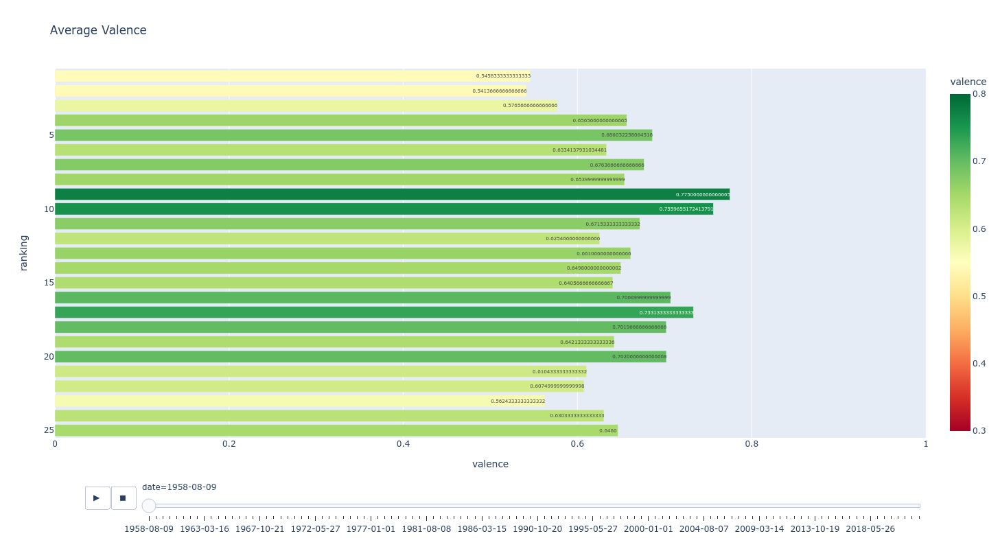

In [125]:
fig.show()

We can see that the distribution of valences does indeed seem to be quite random. There are, however, clear overall peaks and falls at certain times in this graph.

### Q4: Song Duration

#### Length Distribution

To answer this question, we will use "length_ms" as acquired from Spotify. It is already in the dataframe "hot_100_analysis".

Let us start with a histogram:

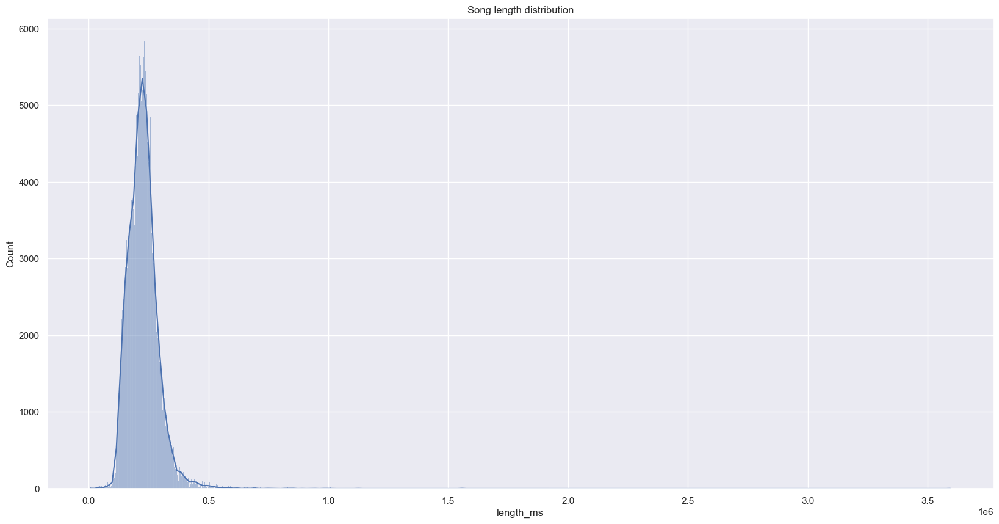

In [126]:
plt.figure(figsize=(20, 10))

sns.histplot(hot_100_analysis["length_ms"], kde=True)

plt.title("Song length distribution")

plt.show()

Most songs seem to be around 200,000 milliseconds (3:20) long, however there are huge outliers, with songs at 3,500,000 milliseconds (58:20) long. The overall distribution is quite right-skewed.

#### Length Over Time

Let us investigate the lengths over time now, with a lineplot:

In [127]:
mean_length = hot_100_analysis.groupby("date")["length_ms"].mean()

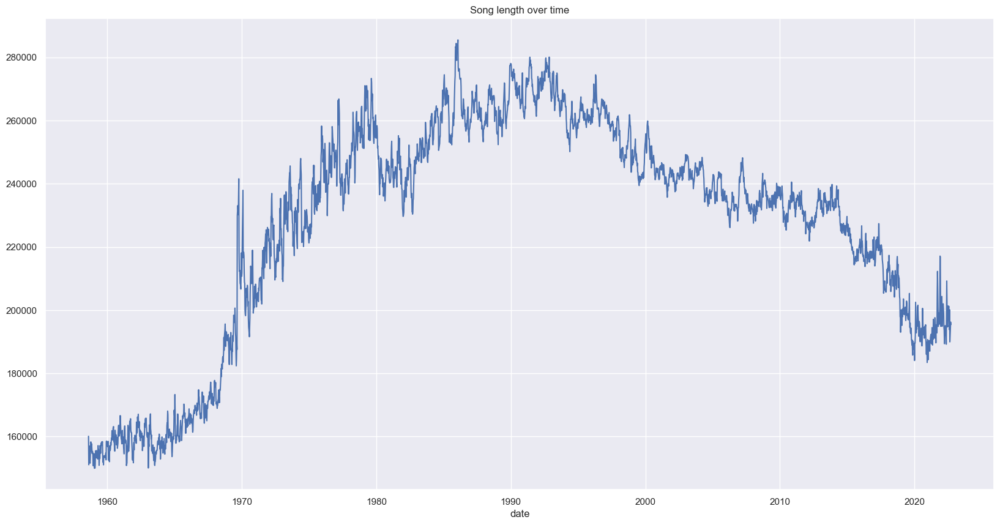

In [128]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=mean_length.index, y=mean_length.values, ci=None)

plt.title("Song length over time")

plt.show()

Let us take a rolling average:

In [129]:
rolling = mean_length.rolling(72).mean()

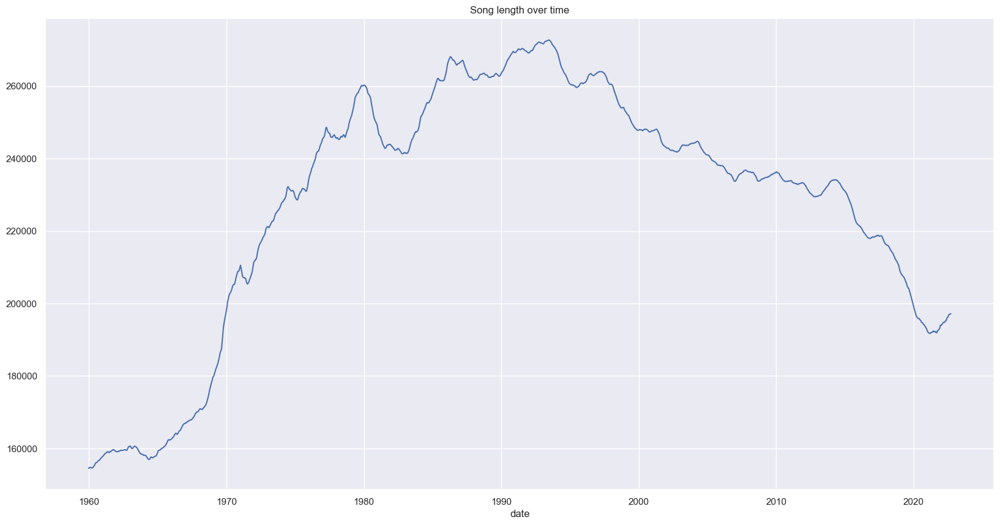

In [130]:
plt.figure(figsize=(20, 10))

sns.lineplot(x=rolling.index, y=rolling.values, ci=None)

plt.title("Song length over time")

plt.show()

There is a clear trend here. The average song length appears to have risen drastically between 1970 to 1990, peaked around 1995, and then has gone back down.

It seems that, recently, the charting songs have been ~190 seconds, or 3:10 long on average.

#### Maximum Chart Ranking

Now, as with valence, let us investigate if there is any relation between highest chart position on the chart and song length.

We must first filter the data, to only show the maximum rankings of a track; luckily, this has already been done above.

First, looking at the year 2020,

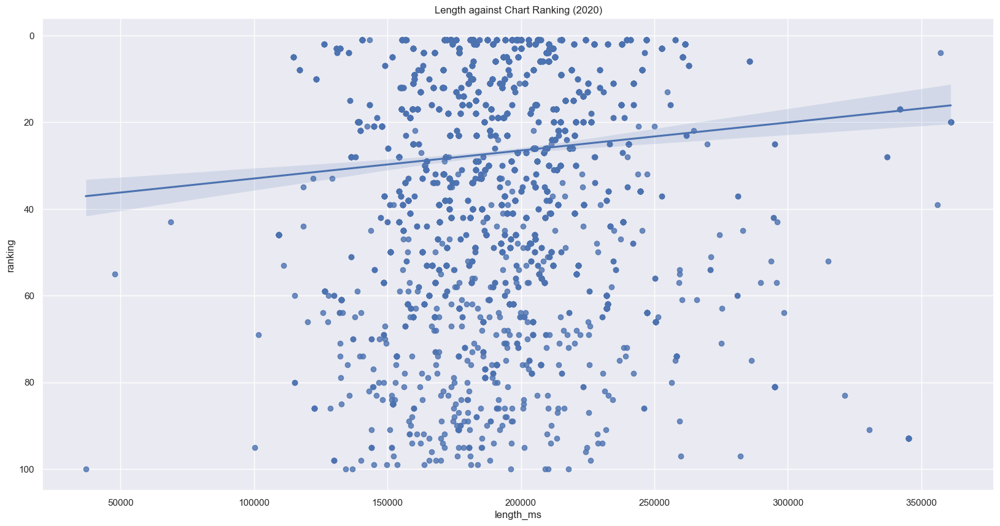

In [131]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(
    y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["length_ms"]
)

ax.invert_yaxis()

plt.title("Length against Chart Ranking (2020)")

plt.show()

In [132]:
stats.pearsonr(y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["length_ms"])

PearsonRResult(statistic=-0.08349699400655643, pvalue=1.6381962139576552e-09)

As with valence, once it comes to chart position itself, length does not seem to have much correlation with chart position, as confirmed by the Pearson R-coefficient.

Looking at the year 2000,

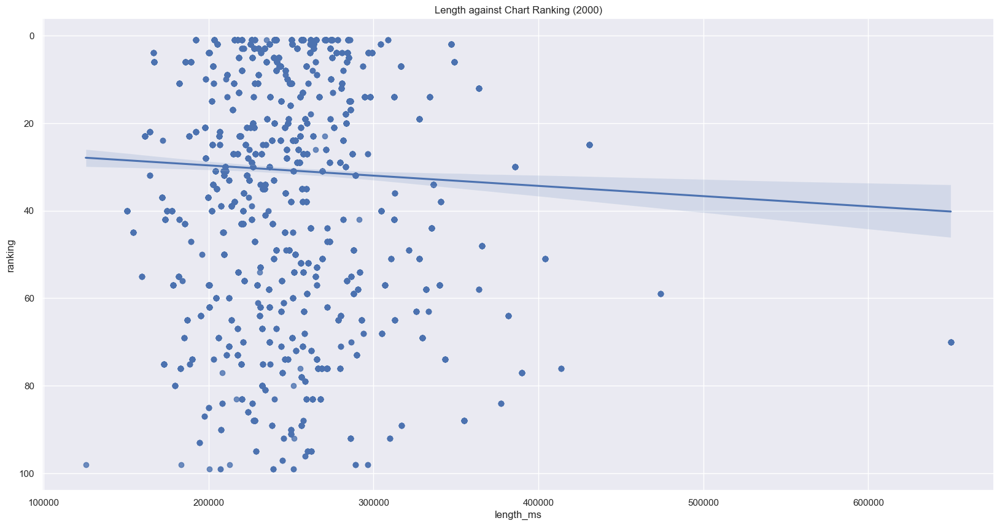

In [133]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(
    y=hot_100_analysis_2000["ranking"], x=hot_100_analysis_2000["length_ms"]
)

ax.invert_yaxis()

plt.title("Length against Chart Ranking (2000)")

plt.show()

In [134]:
stats.pearsonr(y=hot_100_analysis_2000["ranking"], x=hot_100_analysis_2000["length_ms"])

PearsonRResult(statistic=0.04243036117889806, pvalue=0.002003994651313723)

As with 2020, we see a similar lack of correlation, as the graph and the Pearson R-value clearly shows us.

#### Spotify Popularity

Looking at Spotify's popularity ratings,

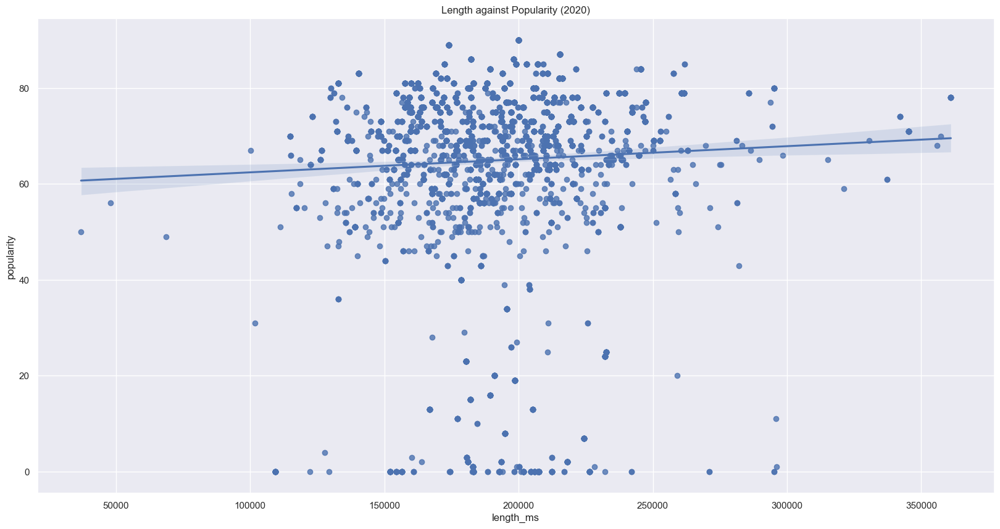

In [135]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(
    y=hot_100_analysis_2020["popularity"], x=hot_100_analysis_2020["length_ms"]
)

plt.title("Length against Popularity (2020)")

plt.show()

In [136]:
stats.pearsonr(
    y=hot_100_analysis_2020["popularity"], x=hot_100_analysis_2020["length_ms"]
)

PearsonRResult(statistic=0.04139079019506973, pvalue=0.002833058645297663)

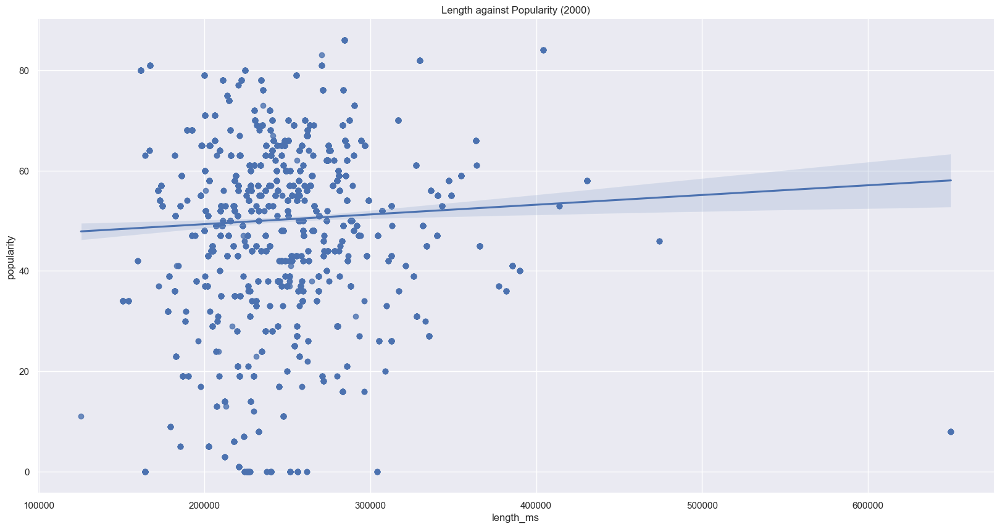

In [137]:
plt.figure(figsize=(20, 10))

ax = sns.regplot(
    y=hot_100_analysis_2000["popularity"], x=hot_100_analysis_2000["length_ms"]
)

plt.title("Length against Popularity (2000)")

plt.show()

In [138]:
stats.pearsonr(
    y=hot_100_analysis_2000["popularity"], x=hot_100_analysis_2000["length_ms"]
)

PearsonRResult(statistic=0.04980062106770305, pvalue=0.0002868052080065002)

As with valence, we find no correlation. As with valence, there is a general trend, but no trend within the chart.

#### Top 25 Length

As a supplement, here's an animated graph of the length of top 25 charting songs over time:

In [139]:
date_list = hot_100_analysis.groupby("date")["ranking"].count().index.tolist()

In [140]:
one_day = pd.Timedelta(days=1)

In [141]:
buckets = date_list[::30] + [date_list[-1] + one_day]

In [142]:
def cut_into_buckets(df):
    df = df.set_index("date")
    data = pd.Series(dtype="float64")
    for bucket_num in range(len(buckets) - 1):
        data[str(buckets[bucket_num].date())] = df.loc[
            buckets[bucket_num] : buckets[bucket_num + 1] - one_day, "length_ms"
        ].mean()
    return data

In [143]:
hot_100_analysis_dates = hot_100_analysis.groupby("ranking")[
    ["date", "length_ms"]
].progress_apply(cut_into_buckets)

  0%|          | 0/100 [00:00<?, ?it/s]

In [144]:
hot_100_analysis_dates = hot_100_analysis_dates.stack().reset_index()

In [145]:
hot_100_analysis_dates.columns = ["ranking", "date", "length_ms"]

In [146]:
hot_100_analysis_dates = hot_100_analysis_dates[hot_100_analysis_dates["ranking"] <= 25]

In [147]:
fig = px.bar(
    hot_100_analysis_dates,
    y="ranking",
    x="length_ms",
    color="length_ms",
    animation_frame="date",
    orientation="h",
    range_x=[140000, 350000],
    range_y=[25.5, 0.5],
    range_color=[200000, 300000],
    color_continuous_scale=px.colors.diverging.RdBu,
    text="length_ms",
    height=800,
    title="Average Length",
)

In [148]:
for k in range(len(fig.frames)):
    frame = fig.frames[k]

    med_length = np.median(
        hot_100_analysis_dates.set_index("date").loc[
            str(buckets[k].date()), "length_ms"
        ]
    )

    frame["layout"].update(
        title_text=f"Average Length from {buckets[k].date()} to {buckets[k + 1].date()}",
        shapes=[
            {
                "type": "line",
                "line": {"dash": "dash"},
                "yref": "y",
                "y0": 0,
                "y1": 26,
                "xref": "x",
                "x0": med_length,
                "x1": med_length,
            }
        ],
        annotations=[
            {
                "showarrow": False,
                "text": f"Median: {int(med_length)}",
                "align": "right",
                "x": med_length,
                "xanchor": "center",
                "xref": "x",
                "yref": "paper",
                "y": 1,
                "yanchor": "bottom",
                "textangle": 10,
            }
        ],
    )

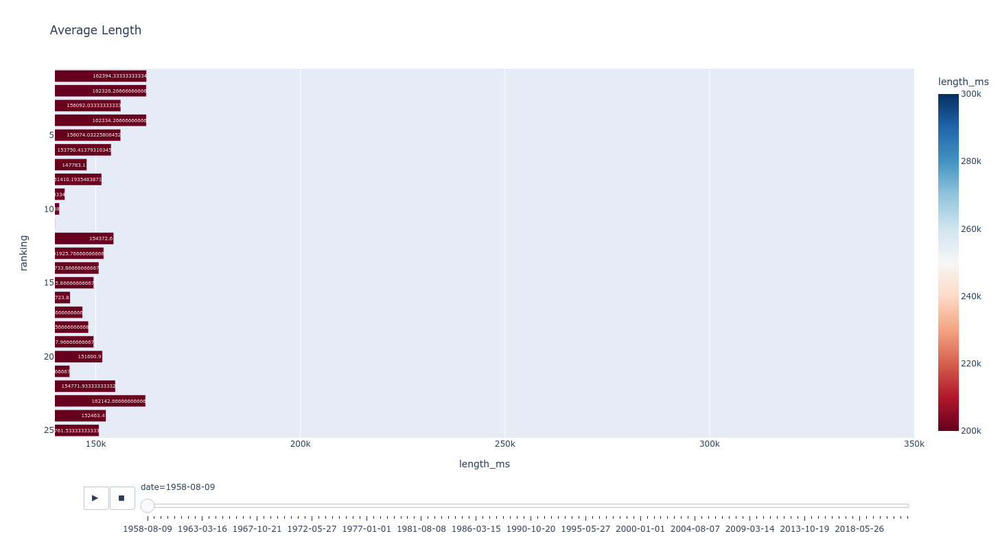

In [149]:
fig.show()

We can see that the distribution of song lengths does indeed seem to be quite random. There are, however, clear overall peaks and falls at certain times in this graph.

<a id='model'/>

### Modelling

#### Cleaning

So, if valence and track length are bad predictors of how well a song will chart, what is a good predictor, then?

Let us create an MLRM, to determine maximum chart position, based on the Spotify analysis.

We will focus only from 2021 onwards, in order to preserve the recency of the model's accuracy.

In [150]:
hot_100_analysis_2021 = hot_100_analysis[
    hot_100_analysis["date"] >= np.datetime64("2021")
].copy()

In [151]:
hot_100_analysis_2021.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9000 entries, 324218 to 333217
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              9000 non-null   datetime64[ns]
 1   ranking           9000 non-null   int64         
 2   song_name         9000 non-null   object        
 3   artist            9000 non-null   object        
 4   track_id          9000 non-null   object        
 5   album_name        9000 non-null   object        
 6   track_name        9000 non-null   object        
 7   album_type        9000 non-null   object        
 8   popularity        9000 non-null   float64       
 9   album_artists     9000 non-null   object        
 10  track_artists     9000 non-null   object        
 11  length_ms         9000 non-null   float64       
 12  explicit          9000 non-null   object        
 13  acousticness      9000 non-null   float64       
 14  danceability     

First, we set each song's ranking to its best placement ever:

In [152]:
hot_100_analysis_2021["ranking"] = hot_100_analysis_2021["track_id"].apply(
    lambda track: best_placements[track]
)

Also, since all of a song's data is based on it's Track ID, to not bias the model, let us remove all rows with duplicate track_id:

In [153]:
hot_100_analysis_2021.drop_duplicates(subset=["track_id"], inplace=True)

Let us check how many data points we now have;

In [154]:
len(hot_100_analysis_2021)

1255

Let us now define its inputs and outputs:

In [155]:
lrm_data = hot_100_analysis_2021[
    [
        "length_ms",
        "explicit",
        "acousticness",
        "danceability",
        "energy",
        "instrumentalness",
        "loudness",
        "mode",
        "speechiness",
        "tempo",
        "valence",
    ]
].copy()

In [156]:
lrm_y = hot_100_analysis_2021["ranking"]

Let us fix "explicit", to make it numerical;

In [157]:
lrm_data["explicit"] = lrm_data["explicit"].astype("boolean").astype("int64")

#### Max Chart Position

##### Correlations

Before we get into the MRLM, let us first see the correlations between the variables.

In [158]:
corr_data = lrm_data.apply(
    lambda var: tuple(stats.pearsonr(var, lrm_y)), result_type="expand"
).T

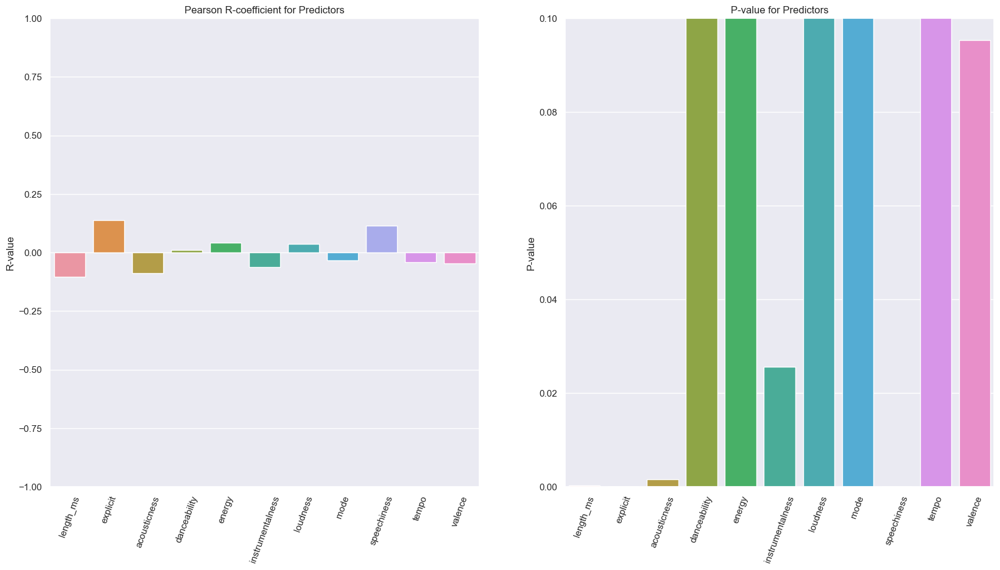

In [159]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.barplot(y=corr_data[0], x=corr_data.index, ax=axs[0])
sns.barplot(y=np.log(1 + corr_data[1]), x=corr_data.index, ax=axs[1])

for ax in axs:
    for label in ax.get_xticklabels():
        label.set_rotation(70)

axs[0].set_ylim([-1, 1])
axs[0].set_ylabel("R-value")
axs[0].set_title("Pearson R-coefficient for Predictors")

axs[1].set_ylim([0, 0.1])
axs[1].set_ylabel("P-value")
axs[1].set_title("P-value for Predictors")

fig.show()

Interestingly, no variable seems like a good fit. The expected results will probably not be good.

Let us only keep the variables with a P-value <= 0.05, and a absolute R-value >= 0.05;

In [160]:
lrm_data_sbst = lrm_data[
    corr_data[(np.abs(corr_data[0]) >= 0.05) & (corr_data[1] <= 0.05)].index
]

In [161]:
lrm_data_sbst.columns

Index(['length_ms', 'explicit', 'acousticness', 'instrumentalness',
       'speechiness'],
      dtype='object')

##### Multiple Linear Regression

Now, let us use a MLRM to try and predict the best placement for a track.

First, let us do the train-test split, with 20% test data;

In [162]:
x_train, x_test, y_train, y_test = train_test_split(
    lrm_data_sbst, lrm_y, test_size=0.2, random_state=42
)

Now, we fit the regression, and check the coefficients,

In [163]:
lm = LinearRegression()
lm.fit(x_train, y_train)

print(lm.coef_)
print(lm.intercept_)

[-5.04088084e-05  5.26099622e+00 -6.82325144e+00 -9.18888308e+00
  1.32465220e+01]
56.77569422674003


First, let us check the accuracy of the model, with a residual plot.

In [164]:
y_pred = lm.predict(x_test)

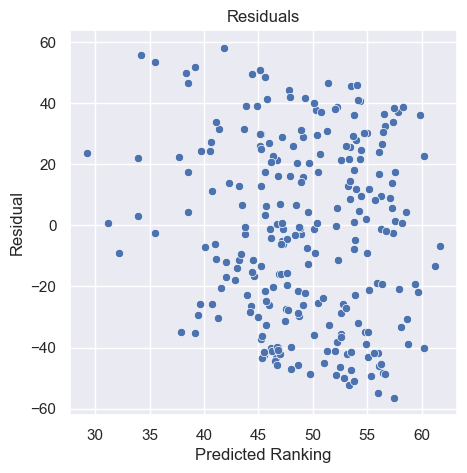

In [165]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.scatterplot(y=y_test - y_pred, x=y_pred)

plt.title("Residuals")
plt.ylabel("Residual")
plt.xlabel("Predicted Ranking")
plt.show()

The model seems to be quite bad. Despite the residual plot looking randomly scattered, note the range of the residuals is -60 to 60. Given that there are only 100 spots, this is more than 60% error, which shows how bad the model is.

Another way to see this is the KDE:

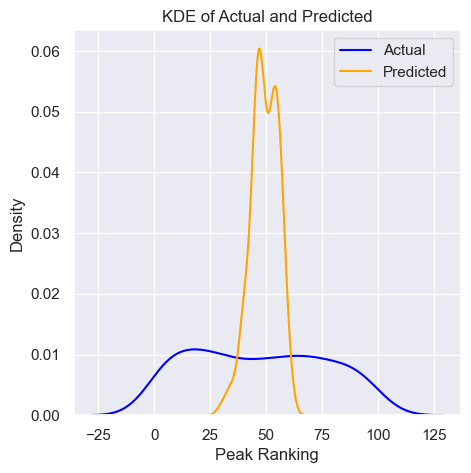

In [166]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.kdeplot(data=y_test, color="blue", label="Actual")
sns.kdeplot(data=y_pred, color="orange", label="Predicted")

plt.title("KDE of Actual and Predicted")
plt.ylabel("Density")
plt.xlabel("Peak Ranking")

plt.legend()
plt.show()

This is an incredibly poor fit.

##### Random Forest

Let us try a more complicated model (in this case, the Random Forest Regressor):

In [167]:
rf = RandomForestRegressor(n_jobs=-1)
rf.fit(x_train, y_train);

In [168]:
y_pred_rf = rf.predict(x_test)

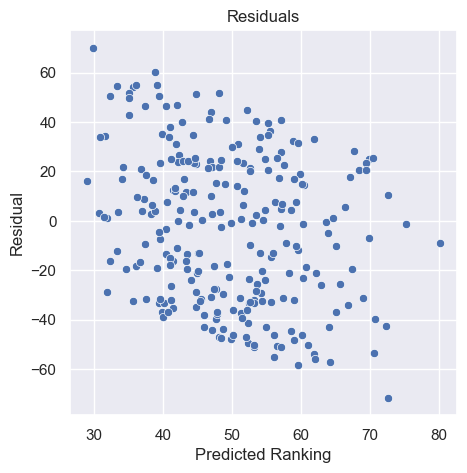

In [169]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.scatterplot(y=y_test - y_pred_rf, x=y_pred_rf)

plt.title("Residuals")
plt.ylabel("Residual")
plt.xlabel("Predicted Ranking")
plt.show()

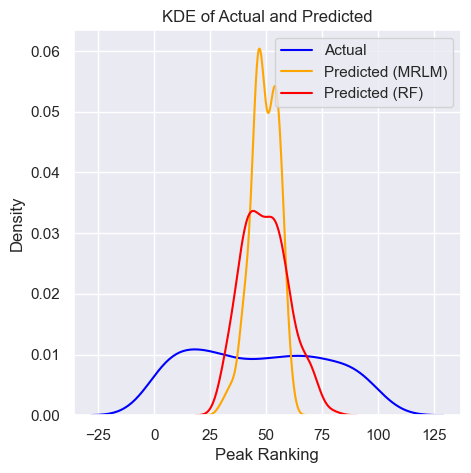

In [170]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.kdeplot(data=y_test, color="blue", label="Actual")
sns.kdeplot(data=y_pred, color="orange", label="Predicted (MRLM)")
sns.kdeplot(data=y_pred_rf, color="red", label="Predicted (RF)")

plt.title("KDE of Actual and Predicted")
plt.ylabel("Density")
plt.xlabel("Peak Ranking")

plt.legend()
plt.show()

Seems like there isn't really a good predictor of chart position at all. The random forest regressor does better than the MLRM, but still not good enough.

#### Spotify Popularity

But what about Spotify's popularity metric?

In [171]:
lrm_y = hot_100_analysis_2021["popularity"]

##### Correlations

Investigating the correlations,

In [172]:
corr_data = lrm_data.apply(
    lambda var: tuple(stats.pearsonr(var, lrm_y)), result_type="expand"
).T

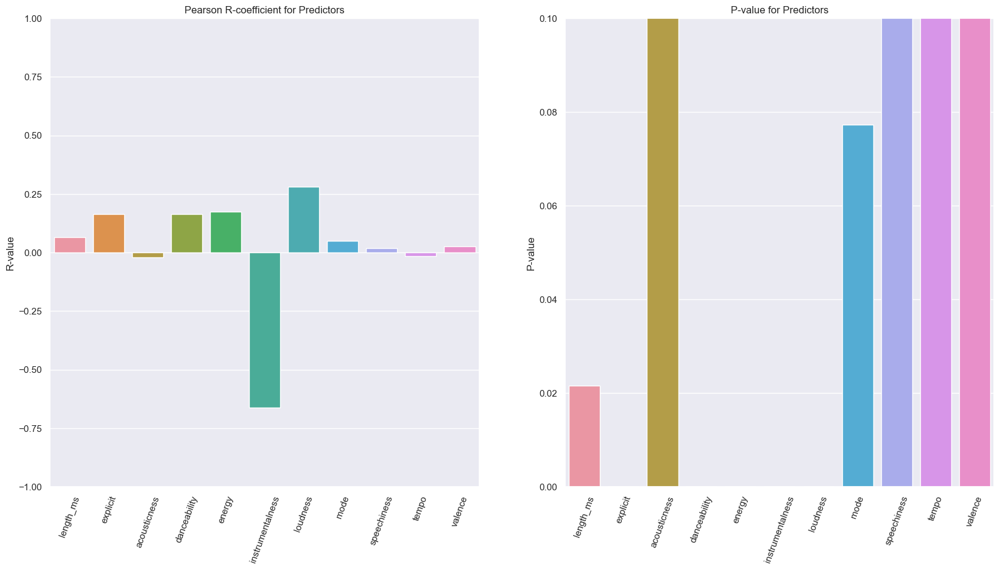

In [173]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.barplot(y=corr_data[0], x=corr_data.index, ax=axs[0])
sns.barplot(y=np.log(1 + corr_data[1]), x=corr_data.index, ax=axs[1])

for ax in axs:
    for label in ax.get_xticklabels():
        label.set_rotation(70)

axs[0].set_ylim([-1, 1])
axs[0].set_ylabel("R-value")
axs[0].set_title("Pearson R-coefficient for Predictors")

axs[1].set_ylim([0, 0.1])
axs[1].set_ylabel("P-value")
axs[1].set_title("P-value for Predictors")

fig.show()

There seem to be a few good predictors. Maybe this will be better?

##### Multiple Linear Regression

In [174]:
lrm_data_sbst = lrm_data[
    corr_data[(np.abs(corr_data[0]) >= 0.05) & (corr_data[1] <= 0.05)].index
]

In [175]:
lrm_data_sbst.columns

Index(['length_ms', 'explicit', 'danceability', 'energy', 'instrumentalness',
       'loudness'],
      dtype='object')

In [176]:
x_train, x_test, y_train, y_test = train_test_split(
    lrm_data_sbst, lrm_y, test_size=0.2, random_state=42
)

In [177]:
lm = LinearRegression()
lm.fit(x_train, y_train)

print(lm.coef_)
print(lm.intercept_)

[ 2.83571587e-05  8.78472795e-03  5.93356315e+00 -5.30599829e-01
 -6.82513141e+01  6.04757845e-01]
62.349067156131895


Let us check the accuracy of this model, with a residual plot.

In [178]:
y_pred = lm.predict(x_test)

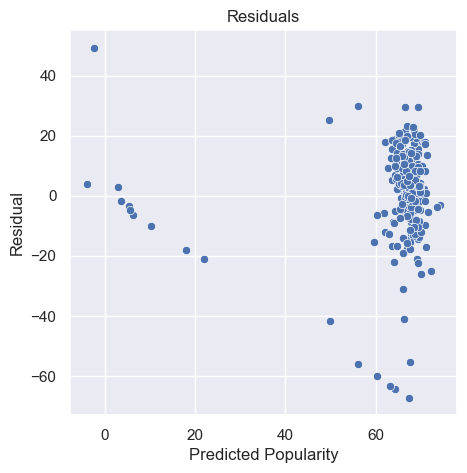

In [179]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.scatterplot(y=y_test - y_pred, x=y_pred)

plt.title("Residuals")
plt.ylabel("Residual")
plt.xlabel("Predicted Popularity")
plt.show()

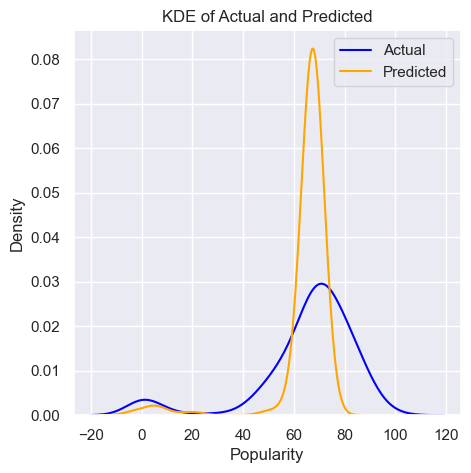

In [180]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.kdeplot(data=y_test, color="blue", label="Actual")
sns.kdeplot(data=y_pred, color="orange", label="Predicted")

plt.title("KDE of Actual and Predicted")
plt.ylabel("Density")
plt.xlabel("Popularity")

plt.legend()
plt.show()

The model still seems to be extremely bad. The peaks are somewhat aligned, but the magnitude is way off.

##### Random Forest

Let us try Random Forest again;

In [181]:
rf = RandomForestRegressor(n_jobs=-1)
rf.fit(x_train, y_train);

In [182]:
y_pred_rf = rf.predict(x_test)

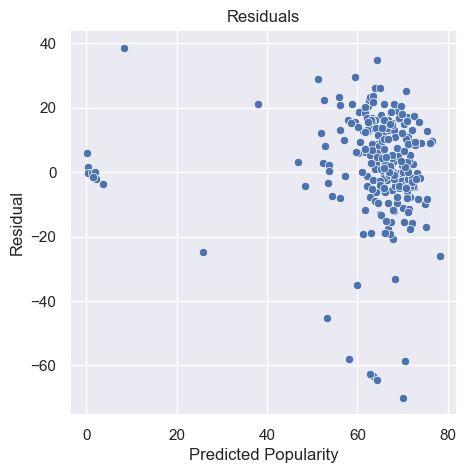

In [183]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.scatterplot(y=y_test - y_pred_rf, x=y_pred_rf)

plt.title("Residuals")
plt.ylabel("Residual")
plt.xlabel("Predicted Popularity")
plt.show()

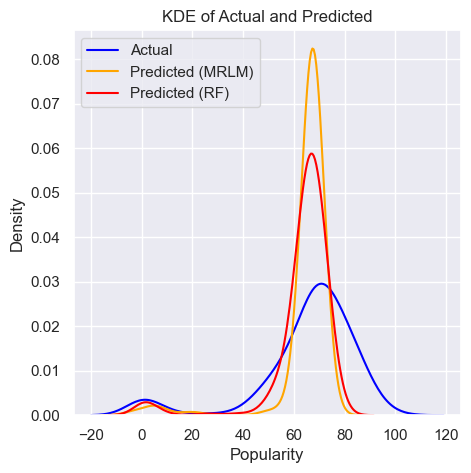

In [184]:
plt.figure(facecolor="w", figsize=(5, 5))
sns.kdeplot(data=y_test, color="blue", label="Actual")
sns.kdeplot(data=y_pred, color="orange", label="Predicted (MRLM)")
sns.kdeplot(data=y_pred_rf, color="red", label="Predicted (RF)")

plt.title("KDE of Actual and Predicted")
plt.ylabel("Density")
plt.xlabel("Popularity")

plt.legend()
plt.show()

At least it's better than the MRLM.

#### Conclusions

There are a few possible explanations for this poor result:

1. The industry is just too volatile lately.
2. We don't have enough predictor variables.
3. The model isn't complicated enough.
4. The model doesn't understand context; which songs end up high has a lot to do with what other options are available.

<a id='q5eda'/>

### Q5: Song/Album Ratings

#### Album Time

Note that we don't have much album data, so this question, especially, is much harder to answer.

Let us first load the Metacritic data;

In [185]:
metacritic_scores

,album_name,artist,top_100_songs,critic_score,user_score,critic_distribution,user_distribution,critic_score_bucket,user_score_bucket,critic_total_ratings,user_total_ratings
0,Red River Blue (Deluxe Edition),Blake Shelton,"[[""Over"",""Blake Shelton""],[""Drink On It"",""Blak...",62,3.9,"[4,5,0]","[1,0,0]",Generally favorable reviews,Generally unfavorable reviews,9,17
1,Human,Brandy,"[[""Right Here (Departed)"",""Brandy""]]",67,5.4,"[4,5,1]","[8,0,0]",Generally favorable reviews,Mixed or average reviews,10,66
2,Rule 3:36,Ja Rule,"[[""Between Me And You"",""Ja Rule Featuring Chri...",56,7.4,"[1,4,0]","[2,0,1]",Mixed or average reviews,Generally favorable reviews,5,8
3,Wildflower (Deluxe Edition),Sheryl Crow,"[[""Good Is Good"",""Sheryl Crow""]]",63,5.6,"[9,6,2]","[19,3,0]",Generally favorable reviews,Mixed or average reviews,17,52
4,Restless,Xzibit,"[[""X"",""Xzibit""]]",75,8.3,"[9,2,0]","[3,1,0]",Generally favorable reviews,Universal acclaim,11,18
...,...,...,...,...,...,...,...,...,...,...,...
1426,Partie Traumatic,Black Kids,"[[""I'm Not Gonna Teach Your Boyfriend To Dance...",75,6.4,"[24,6,2]","[12,3,4]",Generally favorable reviews,Generally favorable reviews,32,40
1427,Trip At Knight (Complete Edition),Trippie Redd,"[[""Rich MF"",""Trippie Redd Featuring Lil Durk &...",68,7.2,"[3,2,0]","[4,1,2]",Generally favorable reviews,Generally favorable reviews,5,17
1428,Rotten Apple,Lloyd Banks,"[[""Hands Up"",""Lloyd Banks Featuring 50 Cent""]]",51,6.4,"[3,8,3]","[13,3,5]",Mixed or average reviews,Generally favorable reviews,14,32
1429,True,Avicii,"[[""Hey Brother"",""Avicii""],[""Wake Me Up!"",""Avic...",69,7.8,"[5,1,1]","[17,0,4]",Generally favorable reviews,Generally favorable reviews,7,119


Let us now associate each album to a time; this will be done by finding the average time that its Top 100 songs were on the Billboard charts.

In [186]:
metacritic_scores["top_100_songs"] = metacritic_scores["top_100_songs"].progress_apply(
    lambda songs: orjson.loads(songs)
)

  0%|          | 0/1431 [00:00<?, ?it/s]

In [187]:
song_time_on_chart = hot_100.groupby(["song_name", "artist"])["date"].mean()

In [188]:
def get_mean_album_time(album_songs):
    data = []

    for song in album_songs:
        data.append(song_time_on_chart.loc[tuple(song)])

    data = pd.Series(data)
    return data.mean()

In [189]:
metacritic_scores["album_date"] = metacritic_scores["top_100_songs"].progress_apply(
    get_mean_album_time
)

  0%|          | 0/1431 [00:00<?, ?it/s]

In [190]:
metacritic_scores

,album_name,artist,top_100_songs,critic_score,user_score,critic_distribution,user_distribution,critic_score_bucket,user_score_bucket,critic_total_ratings,user_total_ratings,album_date
0,Red River Blue (Deluxe Edition),Blake Shelton,"[[Over, Blake Shelton], [Drink On It, Blake Sh...",62,3.9,"[4,5,0]","[1,0,0]",Generally favorable reviews,Generally unfavorable reviews,9,17,2012-01-22 18:00:00
1,Human,Brandy,"[[Right Here (Departed), Brandy]]",67,5.4,"[4,5,1]","[8,0,0]",Generally favorable reviews,Mixed or average reviews,10,66,2008-11-25 12:00:00
2,Rule 3:36,Ja Rule,"[[Between Me And You, Ja Rule Featuring Christ...",56,7.4,"[1,4,0]","[2,0,1]",Mixed or average reviews,Generally favorable reviews,5,8,2001-03-12 08:00:00
3,Wildflower (Deluxe Edition),Sheryl Crow,"[[Good Is Good, Sheryl Crow]]",63,5.6,"[9,6,2]","[19,3,0]",Generally favorable reviews,Mixed or average reviews,17,52,2005-11-02 04:48:00
4,Restless,Xzibit,"[[X, Xzibit]]",75,8.3,"[9,2,0]","[3,1,0]",Generally favorable reviews,Universal acclaim,11,18,2001-01-30 12:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
1426,Partie Traumatic,Black Kids,[[I'm Not Gonna Teach Your Boyfriend To Dance ...,75,6.4,"[24,6,2]","[12,3,4]",Generally favorable reviews,Generally favorable reviews,32,40,2011-05-28 00:00:00
1427,Trip At Knight (Complete Edition),Trippie Redd,"[[Rich MF, Trippie Redd Featuring Lil Durk & P...",68,7.2,"[3,2,0]","[4,1,2]",Generally favorable reviews,Generally favorable reviews,5,17,2021-09-01 12:00:00
1428,Rotten Apple,Lloyd Banks,"[[Hands Up, Lloyd Banks Featuring 50 Cent]]",51,6.4,"[3,8,3]","[13,3,5]",Mixed or average reviews,Generally favorable reviews,14,32,2006-09-26 12:00:00
1429,True,Avicii,"[[Hey Brother, Avicii], [Wake Me Up!, Avicii]]",69,7.8,"[5,1,1]","[17,0,4]",Generally favorable reviews,Generally favorable reviews,7,119,2014-02-22 14:00:00


#### Album Distribution

First, let us visualise the distribution of albums with which we have ratings for:

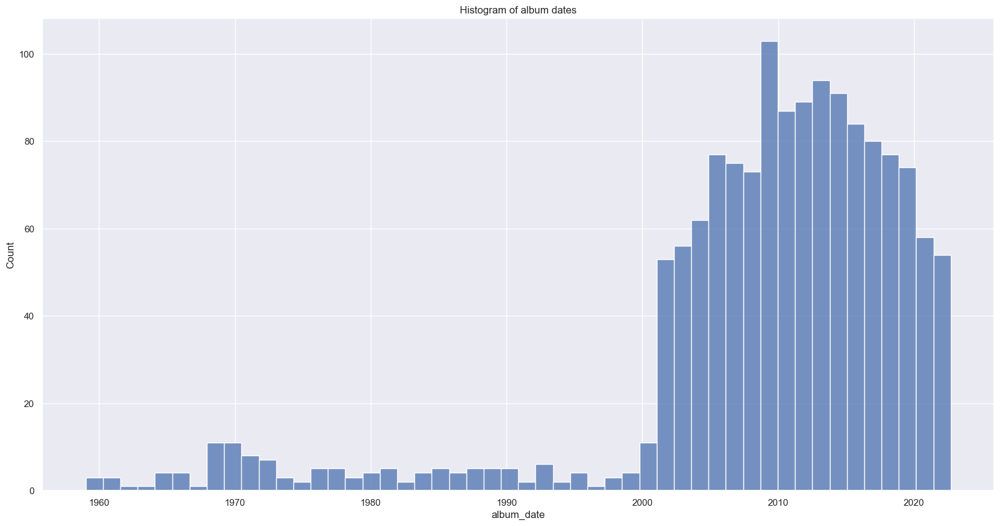

In [191]:
plt.figure(figsize=(20, 10))

sns.histplot(metacritic_scores["album_date"], bins=50)

plt.title("Histogram of album dates")
plt.show()

As we can see, we have very little data from before 2000. Let us focus our analysis on only the period between 2000 to 2022;

In [192]:
metacritic_scores = metacritic_scores[
    metacritic_scores["album_date"] >= np.datetime64("2000")
].copy()

#### User/Critic Distributions

For our first step, let us plot the histogram of critic and user scores;

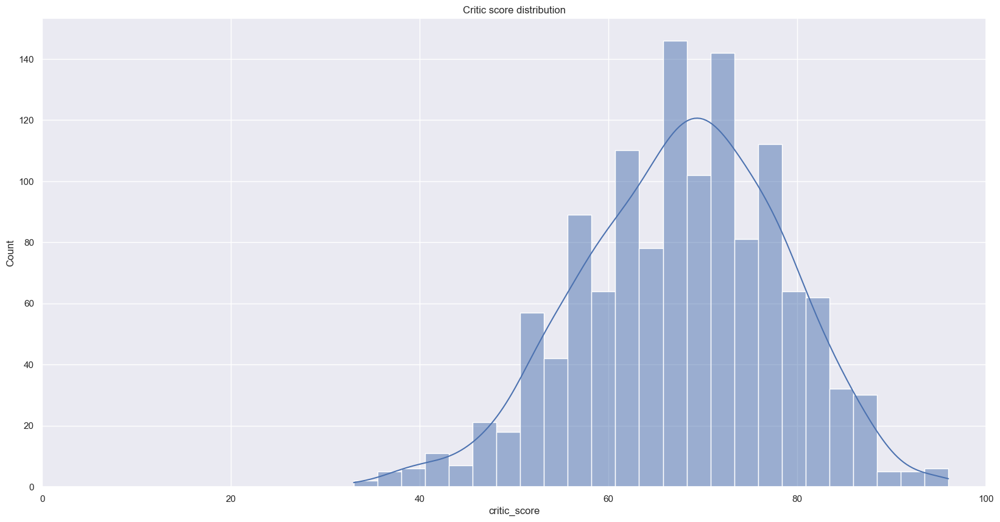

In [193]:
plt.figure(figsize=(20, 10))

sns.histplot(metacritic_scores["critic_score"], kde=True)

plt.xlim([0, 100])

plt.title("Critic score distribution")
plt.show()

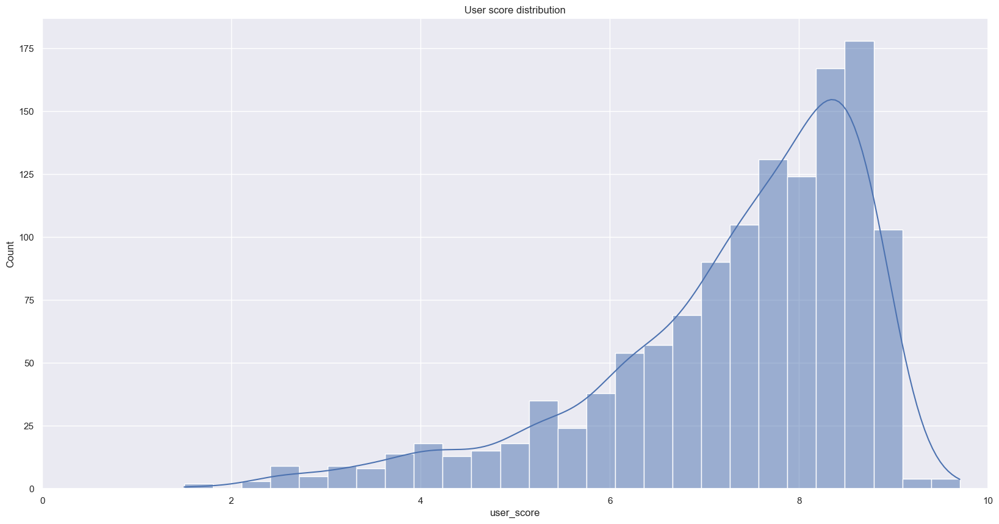

In [194]:
plt.figure(figsize=(20, 10))

sns.histplot(metacritic_scores["user_score"], kde=True)

plt.xlim([0, 10])

plt.title("User score distribution")
plt.show()

The critic scores appears to be a somewhat normally distributed, around a score of 70. Meanwhile, the user scores is heavily left-skewed, with a median at around 7.5.

#### User/Critic Scores Over Time

Now, let us check the critic scores over time:

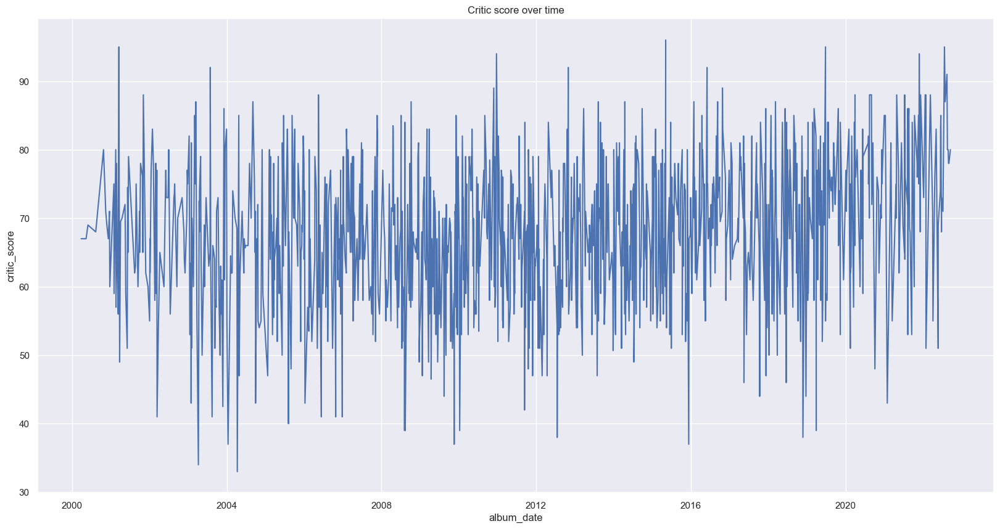

In [195]:
plt.figure(figsize=(20, 10))

sns.lineplot(
    y=metacritic_scores["critic_score"], x=metacritic_scores["album_date"], ci=None
)

plt.title("Critic score over time")
plt.show()

Let us run a rolling average;

In [196]:
metacritic_scores.sort_values(by="album_date", inplace=True)

In [197]:
rolling = (
    metacritic_scores[["album_date", "user_score", "critic_score"]]
    .set_index("album_date")
    .rolling(72)
    .mean()
)

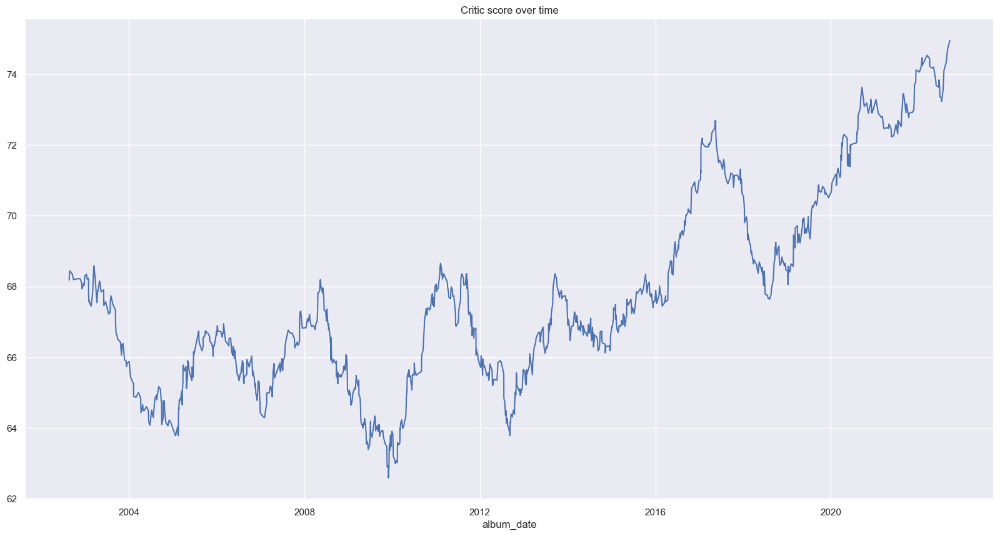

In [198]:
plt.figure(figsize=(20, 10))

sns.lineplot(y=rolling["critic_score"].values, x=rolling["critic_score"].index, ci=None)

plt.title("Critic score over time")
plt.show()

There appears to be a clear overall upwards trend in the average critic score over time, from 2012 to 2022. From 2000 to 2012, it appears to have remained about flat.

What about user score?

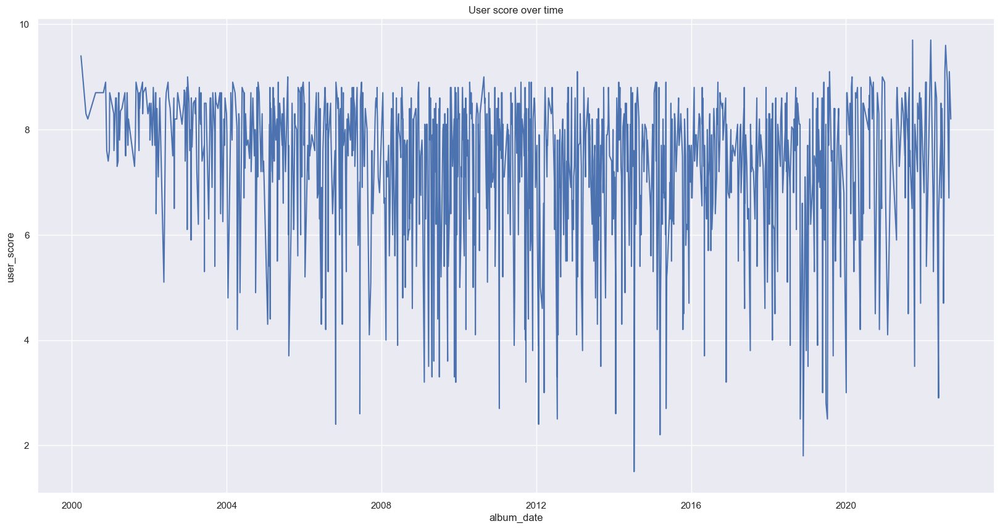

In [199]:
plt.figure(figsize=(20, 10))

sns.lineplot(
    y=metacritic_scores["user_score"], x=metacritic_scores["album_date"], ci=None
)

plt.title("User score over time")
plt.show()

We need another rolling average.

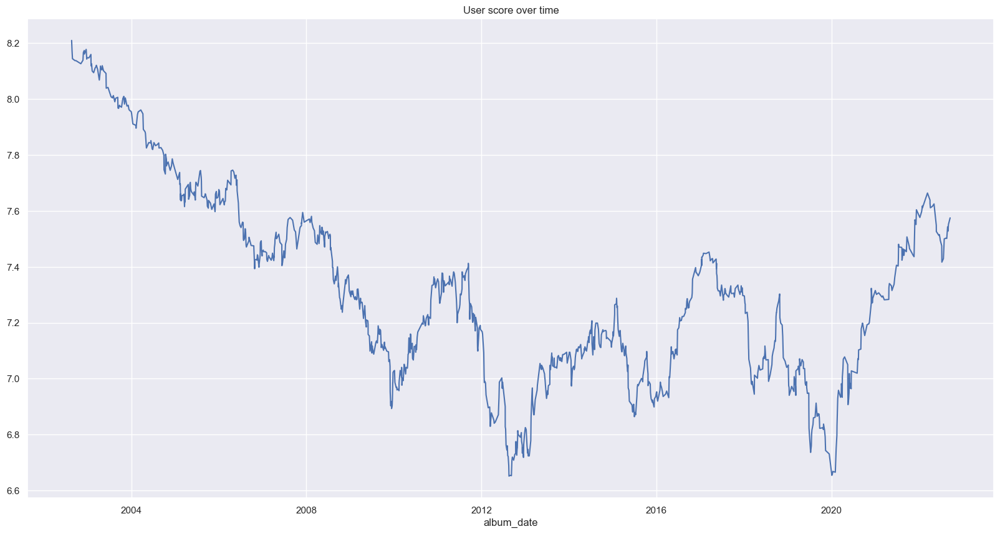

In [200]:
plt.figure(figsize=(20, 10))

sns.lineplot(y=rolling["user_score"].values, x=rolling["user_score"].index, ci=None)

plt.title("User score over time")
plt.show()

Interestingly, the user score seems to have decreased from 2004 to 2016, and then recently has risen again, from 2016 to 2020.

#### Reviews With Comments

However, not all users actually leave reviews; most simply just leave a rating with no comment. What if we only look at users who left a full review?

In [201]:
# scores for a positive, neutral and negative review
scores = np.array([9, 5, 1])

In [202]:
def get_rating_score(dist):
    distribution = np.array(orjson.loads(dist))
    return np.sum(distribution * scores) / np.sum(distribution)

In [203]:
metacritic_scores["user_reviews"] = metacritic_scores[
    "user_distribution"
].progress_apply(get_rating_score)

  0%|          | 0/1297 [00:00<?, ?it/s]

In [204]:
rolling = (
    metacritic_scores[["album_date", "user_score", "user_reviews"]]
    .set_index("album_date")
    .rolling(72)
    .median()
)

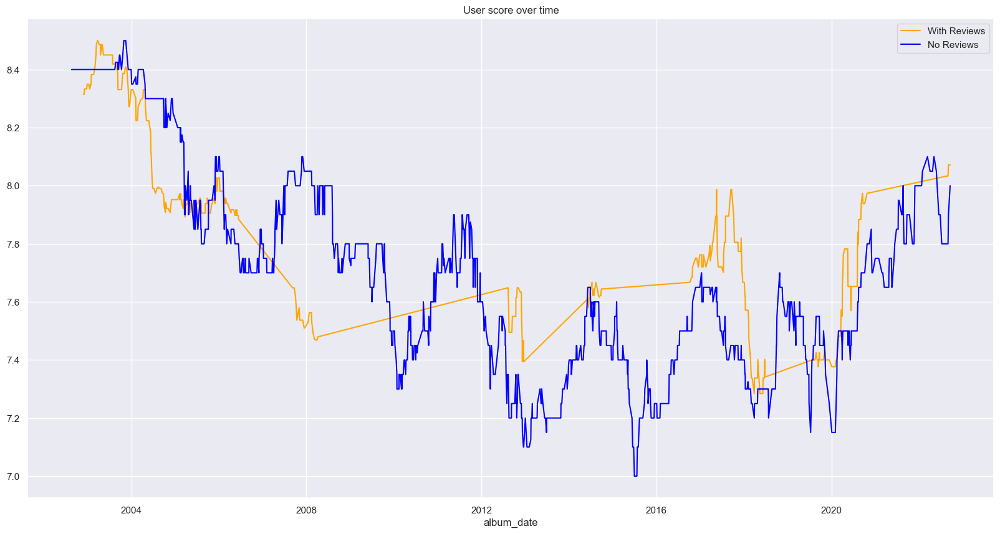

In [205]:
plt.figure(figsize=(20, 10))

sns.lineplot(
    y=rolling["user_reviews"].values,
    x=rolling.index,
    ci=None,
    color="orange",
    label="With Reviews",
)
sns.lineplot(
    y=rolling["user_score"].values,
    x=rolling.index,
    ci=None,
    color="blue",
    label="No Reviews",
)

plt.legend()
plt.title("User score over time")
plt.show()

The data seems to line up well (at least, the general trend). This justifies our use of the general user score in place of the score with reviews only.

#### Charting Songs

Another way to quantify album popularity, is by their charting songs. We can see if albums nowadays have more charting songs, or if their songs chart higher on average.

In [206]:
song_ranking_on_chart = hot_100.groupby(["song_name", "artist"])["ranking"].min()

In [207]:
def get_charting_song_info(row):
    album_songs = row["top_100_songs"]

    data = []

    for song in album_songs:
        data.append(song_ranking_on_chart.loc[tuple(song)])

    return len(album_songs), np.mean(data)

In [208]:
metacritic_scores[["no_songs", "average_song_pos"]] = metacritic_scores.progress_apply(
    get_charting_song_info, result_type="expand", axis=1
)

  0%|          | 0/1297 [00:00<?, ?it/s]

Let us run a rolling average:

In [209]:
rolling = (
    metacritic_scores[["album_date", "no_songs", "average_song_pos"]]
    .set_index("album_date")
    .rolling(72)
    .mean()
)

Now let us plot the average number of charting songs per album over time:

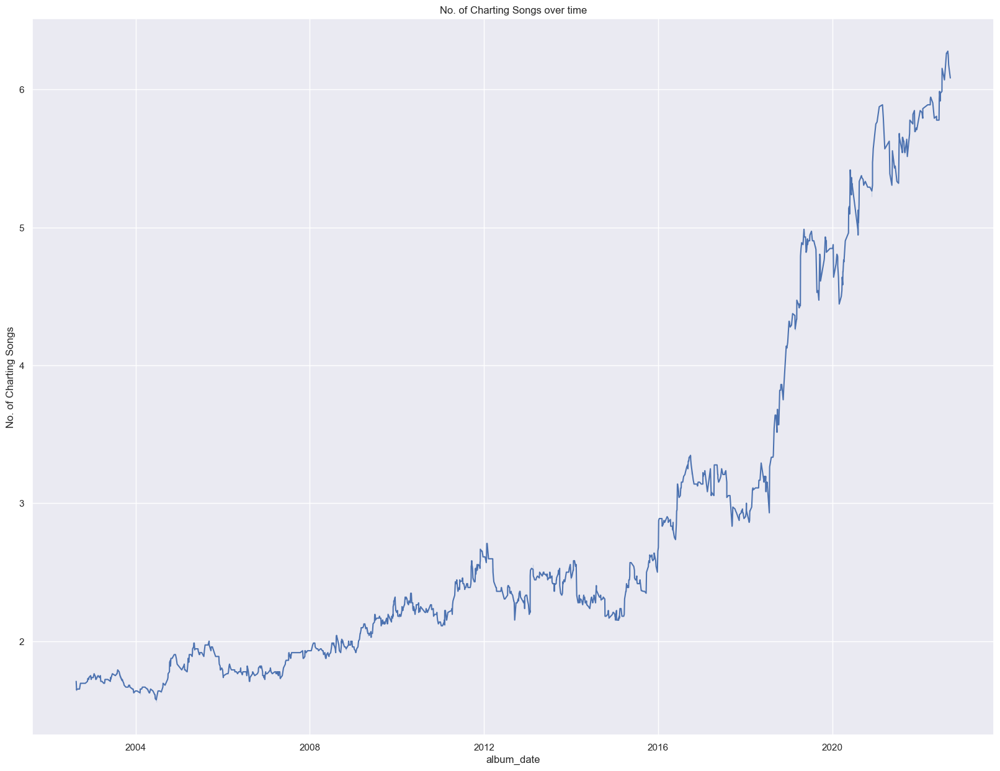

In [210]:
plt.figure(figsize=(20, 15))

ax = sns.lineplot(
    x=rolling.index,
    y=rolling["no_songs"].values,
)

plt.title("No. of Charting Songs over time")
plt.ylabel("No. of Charting Songs")
plt.show()

There seems to be an increasing trend. This signifies that, perhaps, to the wider audience, who did not leave ratings on Metacritic, albums have become better over time, especially between 2018 to 2022.

What about average song placements on the charts?

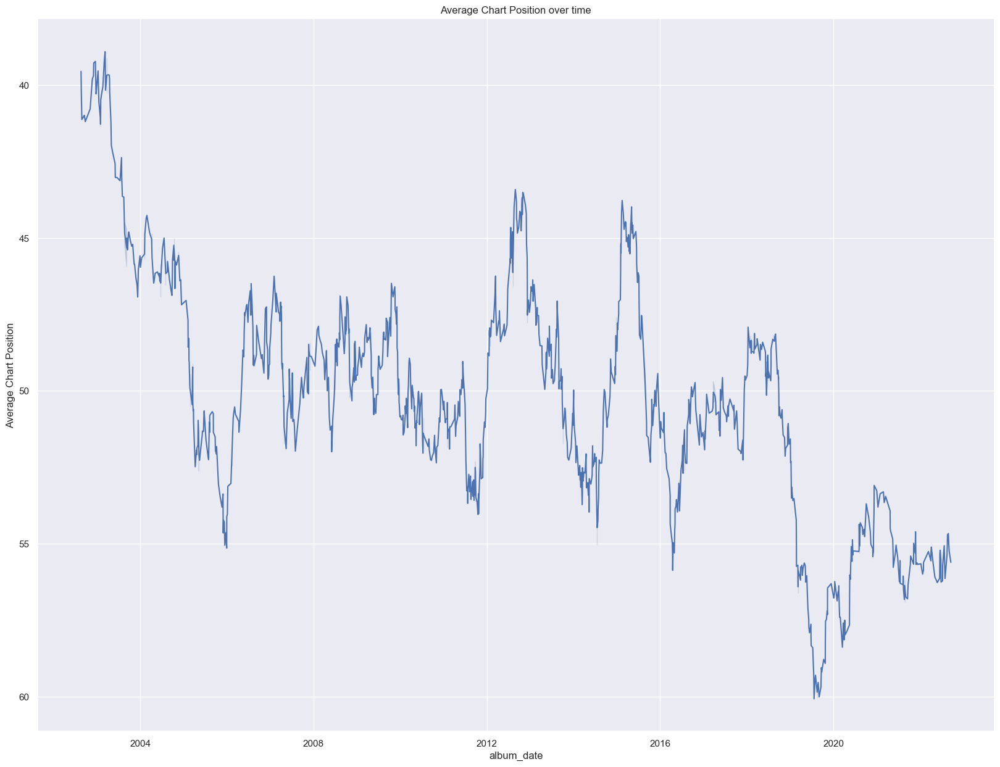

In [211]:
plt.figure(figsize=(20, 15))

ax = sns.lineplot(
    x=rolling.index,
    y=rolling["average_song_pos"].values,
)

ax.invert_yaxis()

plt.title("Average Chart Position over time")
plt.ylabel("Average Chart Position")
plt.show()

Interesting. It appears that, even though the average amount of charting songs is rising, the average position of these songs is falling, especially in the region between 2018 to 2022 where we saw the greatest rise in the number of total songs on the chart.

In conclusion, despite having more songs on the chart, the songs do seem to be less highly popular than before. This may be related with our results about new artists, due to people simply listening to music from the same few people nowadays.

#### Highest Scoring Albums

Now, let us investigate the albums with the best user score, vs. the best critic score.

In [212]:
metacritic_by_user = metacritic_scores.sort_values(
    by="user_score", ascending=False
).head(25)

In [213]:
metacritic_by_critic = metacritic_scores.sort_values(
    by="critic_score", ascending=False
).head(25)

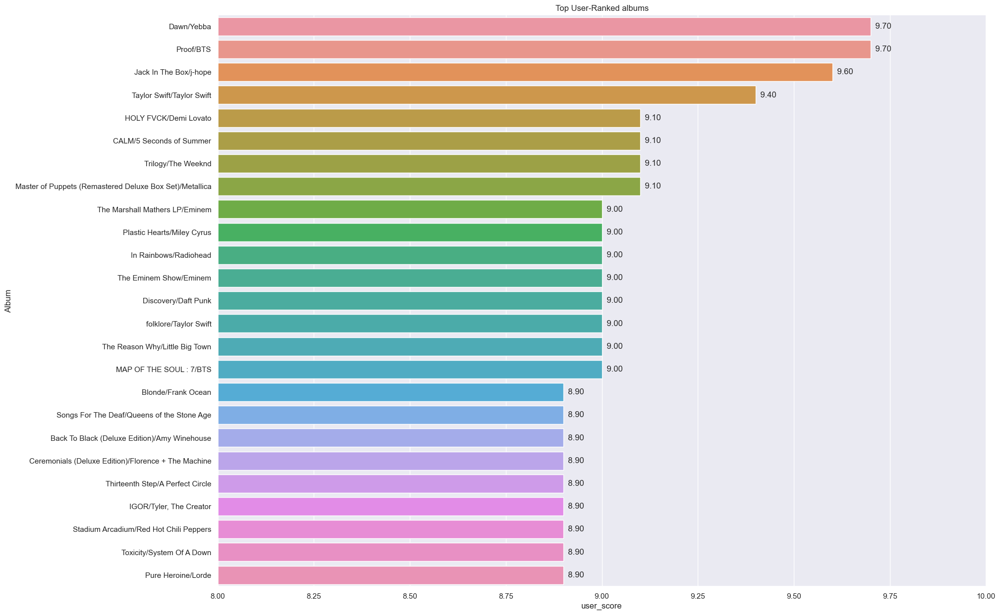

In [214]:
plt.figure(figsize=(20, 15))

ax = sns.barplot(
    x=metacritic_by_user["user_score"],
    y=metacritic_by_user["album_name"] + "/" + metacritic_by_user["artist"],
)
ax.bar_label(ax.containers[0], fmt="  %.2f")

plt.xlim((8, 10))

plt.title("Top User-Ranked albums")
plt.ylabel("Album")
plt.show()

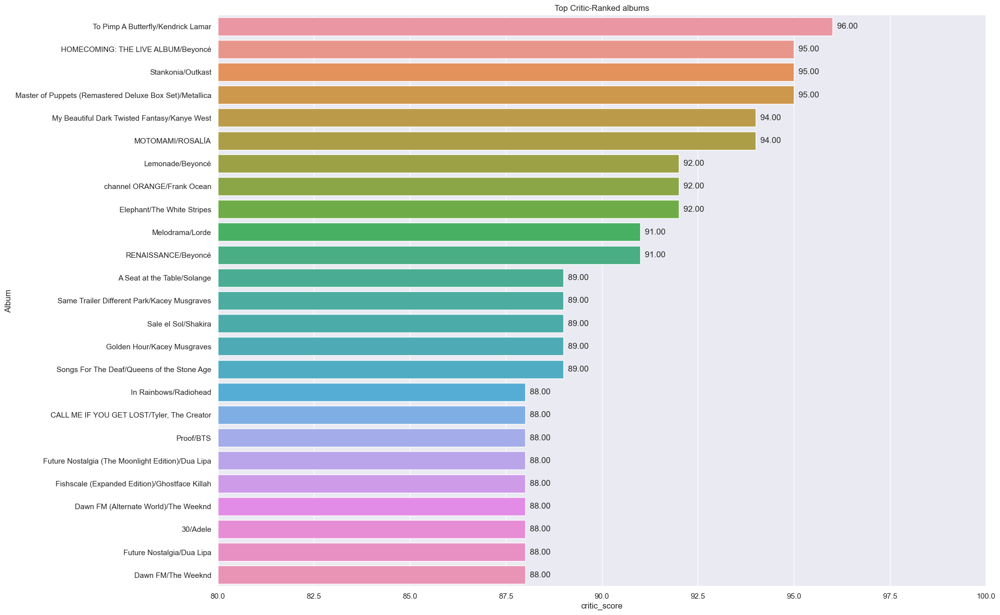

In [215]:
plt.figure(figsize=(20, 15))

ax = sns.barplot(
    x=metacritic_by_critic["critic_score"],
    y=metacritic_by_critic["album_name"] + "/" + metacritic_by_critic["artist"],
)
ax.bar_label(ax.containers[0], fmt="  %.2f")

plt.xlim((80, 100))

plt.title("Top Critic-Ranked albums")
plt.ylabel("Album")
plt.show()

It seems that the critic's top ratings don't really match up to the users'.

#### Critic vs. User

Let us investigate further with a plot:

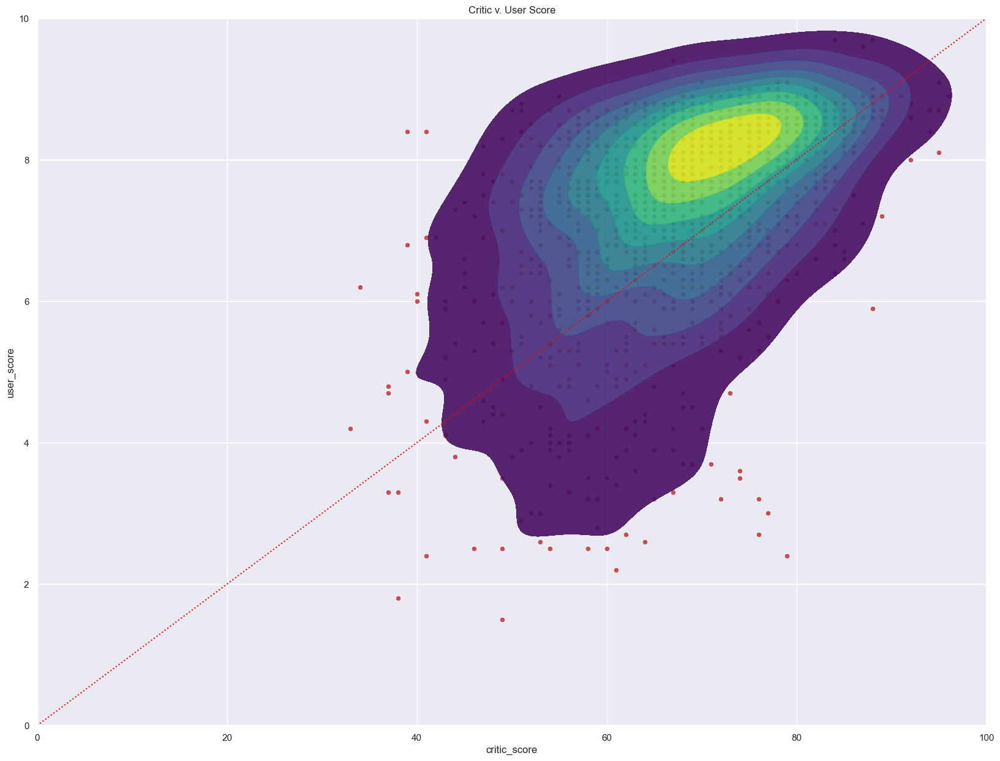

In [216]:
plt.figure(figsize=(20, 15))

sns.scatterplot(
    x=metacritic_scores["critic_score"], y=metacritic_scores["user_score"], color="r"
)

ax = sns.kdeplot(
    x=metacritic_scores["critic_score"],
    y=metacritic_scores["user_score"],
    cmap="viridis",
    fill=True,
    alpha=0.9,
)

plt.ylim((0, 10))
plt.xlim((0, 100))

ax.add_line(plt.Line2D((0, 100), (0, 10), ls=":", color="red"))

plt.title("Critic v. User Score")
plt.show()

The KDE suggests that user scores are, on average, slightly higher than critic scores, as evidenced by the red line. This is true especially as critic score rises.

However, it does seem that, in general, user ratings rise as critic rating rises.

Let us investigate by plotting a barplot of critic and user rating for the top 10 critically acclaimed albums:

In [217]:
to_plot = (
    metacritic_by_critic[["album_name", "artist", "user_score", "critic_score"]]
    .head(10)
    .copy()
)

In [218]:
to_plot_a = to_plot.rename(columns={"user_score": "score"}).drop(
    columns=["critic_score"]
)
to_plot_b = to_plot.rename(columns={"critic_score": "score"}).drop(
    columns=["user_score"]
)

In [219]:
to_plot_a["score"] *= 10

In [220]:
to_plot_a["type"] = "User"
to_plot_b["type"] = "Critic"

In [221]:
to_plot = pd.concat([to_plot_b, to_plot_a])

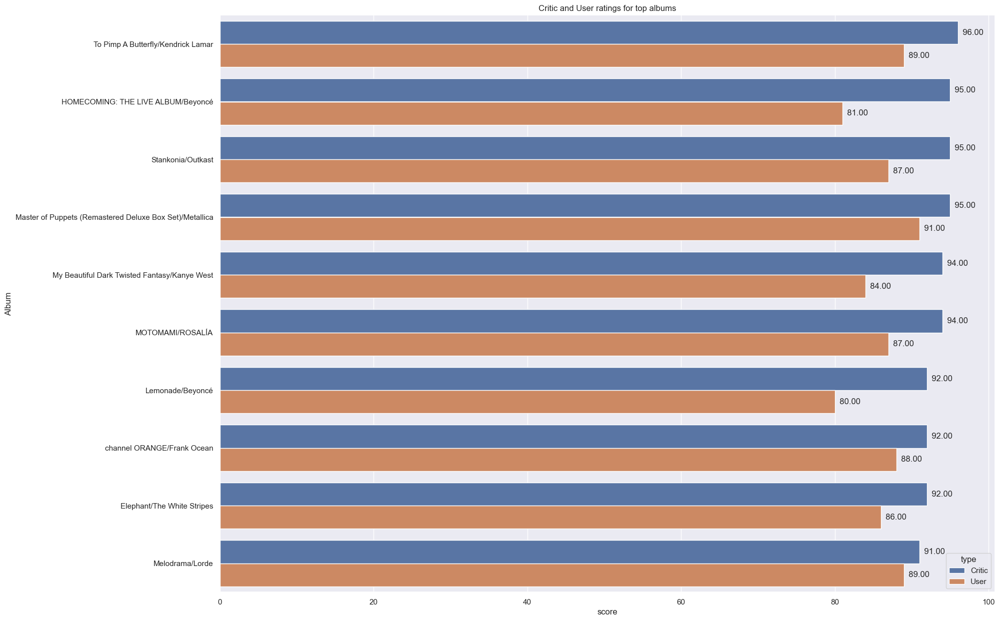

In [222]:
plt.figure(figsize=(20, 15))

ax = sns.barplot(
    x=to_plot["score"],
    y=to_plot["album_name"] + "/" + to_plot["artist"],
    hue=to_plot["type"],
)
ax.bar_label(ax.containers[0], fmt="  %.2f")
ax.bar_label(ax.containers[1], fmt="  %.2f")

plt.title("Critic and User ratings for top albums")
plt.ylabel("Album")
plt.show()

Interestingly, the user score seems to be much lower for these albums. A user score of 8.0 is quite low, and looking at the distribution histogram, would place the album at ~300th place in terms of user rating.

<a id='findings'></a>

# Findings & Conclusions

<a id='q1res'/>

## Q1: Music Formats

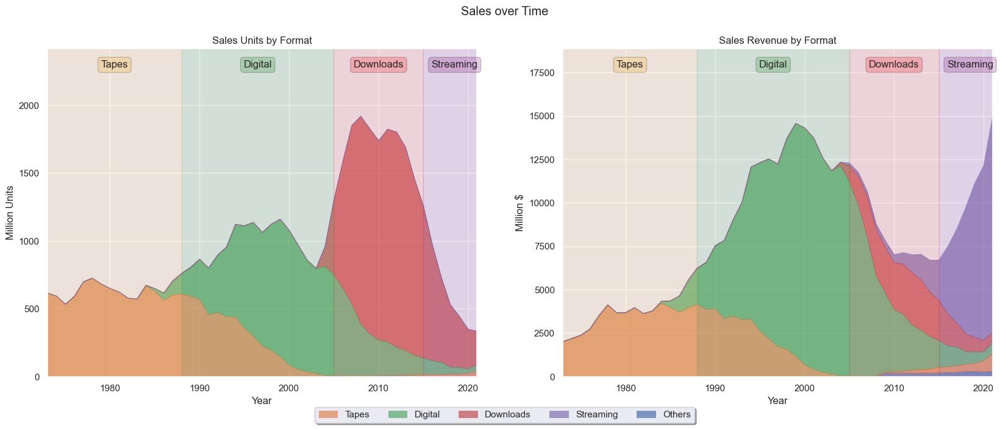

In [223]:
fig, axs = plt.subplots(1, 2, figsize=(20, 7))

riaa_sales_volume_grouped.plot.area(
    title="Sales Units by Format",
    ylabel="Million Units",
    xlabel="Year",
    color=colours,
    alpha=0.7,
    linewidth=0.5,
    ax=axs[0],
    legend=None,
)

riaa_sales_revenue_grouped.plot.area(
    title="Sales Revenue by Format",
    ylabel="Million $",
    xlabel="Year",
    color=colours,
    alpha=0.7,
    linewidth=0.5,
    ax=axs[1],
    legend=None,
)

for ax in axs:
    # remove extra space
    ax.set_xlim((1973, 2021))

    # make space for labels
    ax.set_ylim((0, ax.get_ylim()[1] * 1.2))

    # Coloured regions
    ax.axvspan(1973, 1988, color="orange", alpha=0.1)
    ax.axvspan(1988, 2005, color="green", alpha=0.1)
    ax.axvspan(2005, 2015, color="red", alpha=0.1)
    ax.axvspan(2015, 2022, color="purple", alpha=0.1)

    # Labelling regions
    ax.annotate(
        xy=((1973 + 1988) / 2, (ax.get_ylim()[1] * 0.95)),
        text="Tapes",
        ha="center",
        va="center",
        bbox={
            "boxstyle": "round",
            "fc": "orange",
            "ec": "black",
            "alpha": 0.2,
        },
    )
    ax.annotate(
        xy=((1988 + 2005) / 2, (ax.get_ylim()[1] * 0.95)),
        text="Digital",
        ha="center",
        va="center",
        bbox={
            "boxstyle": "round",
            "fc": "green",
            "ec": "black",
            "alpha": 0.2,
        },
    )
    ax.annotate(
        xy=((2005 + 2015) / 2, (ax.get_ylim()[1] * 0.95)),
        text="Downloads",
        ha="center",
        va="center",
        bbox={
            "boxstyle": "round",
            "fc": "red",
            "ec": "black",
            "alpha": 0.2,
        },
    )
    ax.annotate(
        xy=((2015 + 2022) / 2, (ax.get_ylim()[1] * 0.95)),
        text="Streaming",
        ha="center",
        va="center",
        bbox={
            "boxstyle": "round",
            "fc": "purple",
            "ec": "black",
            "alpha": 0.2,
        },
    )


handles, labels = axs[1].get_legend_handles_labels()
order = [1, 2, 3, 4, 0]
fig.legend(
    [handles[pos] for pos in order],
    [labels[pos] for pos in order],
    loc="lower center",
    bbox_to_anchor=(0.5, -0.01),
    ncol=5,
    fancybox=True,
    shadow=True,
)

fig.suptitle("Sales over Time")
fig.show()

As we can see from the figure, there was a huge jump in revenue around the year 2000, despite only a mediocre jump in total sales. This shows the value of digital distribution methods, like the CD, or the DVD, as compared to tapes, like Casettes.

This is perhaps because of the accessibility of digital formats. CDs and DVDs can be used for many things besides music, and are a more general-purpose format, giving it high accessibility. Combined with the explosion of the Personal Computer around that time, CDs seem to have been very popular.

Meanwhile, downloads offered the biggest amount of total sales, but caused the total industry revenue to reach new lows. This implies that downloads were not very lucrative to the music industry. Perhaps, due to their ease to produce, from their lack of physical media, artists underpriced downloads, and as a collective, their revenue fell. Artists may have also been trying to move listeners away from more costly digital records, and thus underpriced them.

Yet, lately, streaming has been restoring the revenue of the music industry. Since streaming sells no units, it is not reflected in the sales volume, however, the gated nature of licensing and the advertisement revenue really adds up, and really benefits the industry. Being an easy-to-produce medium, while being so restrictive and easy to enforce, makes streaming a very good choice for the industry.

Another useful graph is the one ranking profits per unit sold;

In [224]:
# function to draw annotated horizontal lines
def hannotate(ax, y, dy, xmin, xmax, xlabel, color, prefix="", label=None):
    text = label if label is not None else f"{prefix}{round(y, 2)}"

    ax.hlines(y, xmin, xmax, ls="--", color=color)
    ax.text(
        x=xlabel,
        y=y + dy,
        s=text,
        ha="center",
        va="center",
        bbox={
            "boxstyle": "round",
            "fc": color,
            "ec": "black",
            "alpha": 0.2,
        },
    )

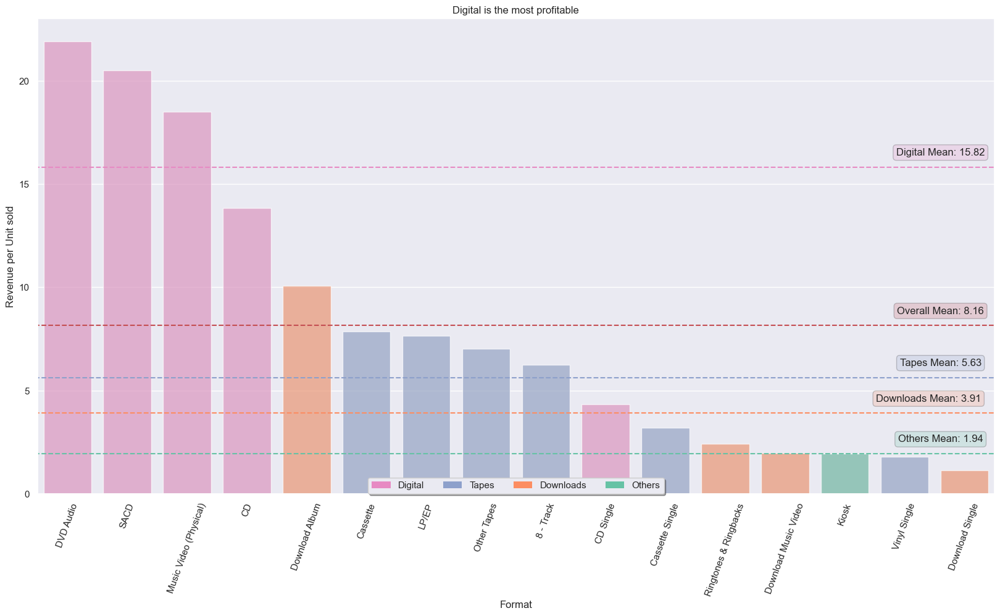

In [225]:
plt.figure(figsize=(20, 10))

sns.barplot(
    x=revenue_per_unit["Format"],
    y=revenue_per_unit["Value"],
    palette=revenue_per_unit["Colour"],
    alpha=0.7,
)

for label in plt.gca().get_xticklabels():
    label.set_rotation(70)

plt.ylabel("Revenue per Unit sold")
plt.xlabel("Format")

plt.title("Digital is the most profitable")

legend_colours = [Patch(fc=color[i], ec="#FFFFFF00") for i in range(4)]

plt.legend(
    reversed(legend_colours),
    reversed(revenue_order),
    loc="lower center",
    bbox_to_anchor=(0.5, -0.01),
    ncol=5,
    fancybox=True,
    shadow=True,
)

# fix the x limit, to make sure our annotation doesn't shift the graph
plt.xlim(plt.gca().get_xlim())

# add mean line
mean = np.mean(revenue_per_unit["Value"])
hannotate(plt.gca(), mean, 0.7, -1, 16, 14.6, "r", "Overall Mean: ")

# mean line for each group
label_x = [14.6, 14.4, 14.6, 14.6]
means = revenue_per_unit.groupby("Format Group")["Value"].mean()

for i in range(4):
    color_index = revenue_order.index(means.index[i])
    hannotate(
        plt.gca(),
        means.values[i],
        0.7,
        -1,
        16,
        label_x[i],
        color[color_index],
        f"{means.index[i]} Mean: ",
    )

plt.show()

As seen by the mean lines, we can see that digital media really is the best in terms of revenue per unit, with the mean being almost double that of the overall mean, and almost triple of the next best category, tapes. This supports our conclusions from the previous graph.

As a recommendation, and a conclusion, music companies should move to streaming as fast as possible, and should mostly leave digital behind. For physical distribution, DVDs and CDs seem to be key formats for musical distribution.

<a id='q2res'/>

## Q2: New Artists

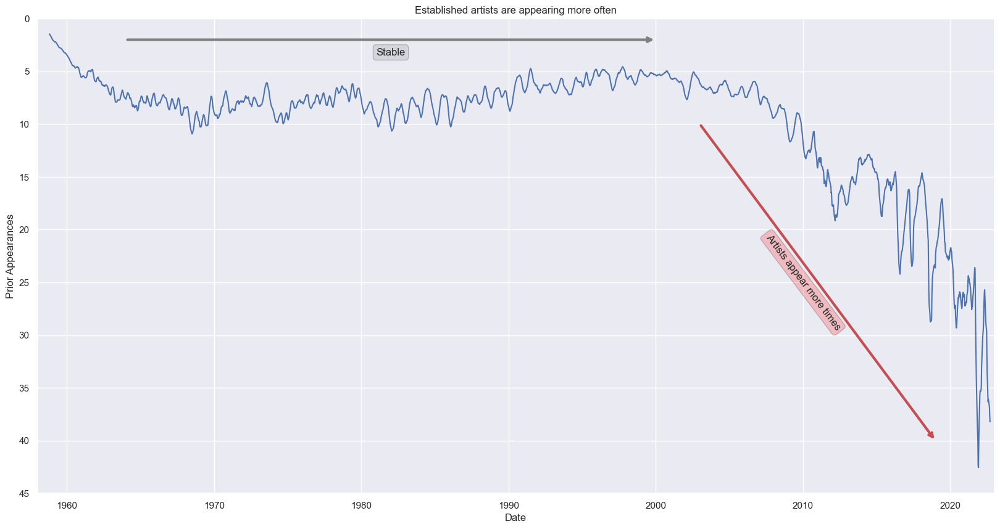

In [226]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(x=average_appearances.index, y=average_appearances.values, ci=None)

# zoom in
ax.set_ylim((45, 0))
ax.set_xlim((pd.Timestamp("1958"), pd.Timestamp("2023")))

# add arrows
ax.annotate(
    "",
    (pd.Timestamp("1964"), 2),
    (pd.Timestamp("2000"), 2),
    arrowprops={"arrowstyle": "<-", "ec": "gray", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("1982"),
    3.2,
    "Stable",
    va="center",
    ha="center",
    bbox={
        "boxstyle": "round",
        "fc": "gray",
        "ec": "black",
        "alpha": 0.2,
    },
)

ax.annotate(
    "",
    (pd.Timestamp("2003"), 10),
    (pd.Timestamp("2019"), 40),
    arrowprops={"arrowstyle": "<-", "ec": "r", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2010"),
    25,
    "Artists appear more times",
    va="center",
    ha="center",
    rotation=-53,
    bbox={
        "boxstyle": "round",
        "fc": "red",
        "ec": "black",
        "alpha": 0.2,
    },
)

plt.title("Established artists are appearing more often")
plt.xlabel("Date")
plt.ylabel("Prior Appearances")
plt.show()

From this graph, we see that between around 1965 to 2000, the average prior appearances for artists appearing on the chart was quite stable, at around 5-10 prior appearances, reaching a peak of newness at 2000, where the average charting artist only appeared 5 times prior.

As we progress through the 21st century, however, the average charting artist starts to have more and more prior appearances, increasing all the way to 35 prior appearances on the charts. This shows that new artists, in the current climate, are struggling to find a foothold in the industry.

Another useful graph is the date of first appearance;

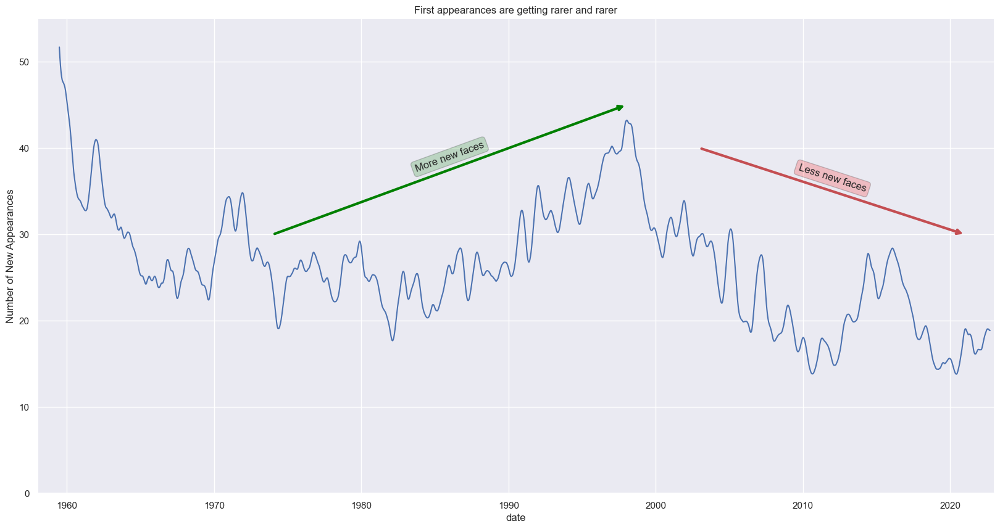

In [227]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(x=hot_100_first_count.index, y=hot_100_first_count.values, ci=None)

# zoom in
ax.set_ylim((0, 55))
ax.set_xlim((pd.Timestamp("1958"), pd.Timestamp("2023")))

# add arrows
ax.annotate(
    "",
    (pd.Timestamp("1974"), 30),
    (pd.Timestamp("1998"), 45),
    arrowprops={"arrowstyle": "<-", "ec": "green", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("1986"),
    39,
    "More new faces",
    va="center",
    ha="center",
    rotation=20,
    bbox={
        "boxstyle": "round",
        "fc": "green",
        "ec": "black",
        "alpha": 0.2,
    },
)

ax.annotate(
    "",
    (pd.Timestamp("2003"), 40),
    (pd.Timestamp("2021"), 30),
    arrowprops={"arrowstyle": "<-", "ec": "r", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2012"),
    36.5,
    "Less new faces",
    va="center",
    ha="center",
    rotation=-18,
    bbox={
        "boxstyle": "round",
        "fc": "red",
        "ec": "black",
        "alpha": 0.2,
    },
)

plt.title("First appearances are getting rarer and rarer")
plt.ylabel("Number of New Appearances")

plt.show()

As we can see, the number of new faces on the charts reached a peak at around 1998, and has been trailing downwards ever since.

This does not bode well for new artists who wish to enter the market. Most charting artists, nowadays, are consistent charters, and new artists have not been charting as well.

A recommendation for new artists, is to not give up hope, and just keep releasing songs. As we can see, songs by new artists are not charting as well today, and just because a song doesn't chart, doesn't mean that it has no value. Build up a loyal fanbase, and once you start getting chart hits, you're more likely to stay.

<a id='q3res'/>

## Q3: Song Happiness

In [228]:
rolling = mean_valence.rolling(72).mean()

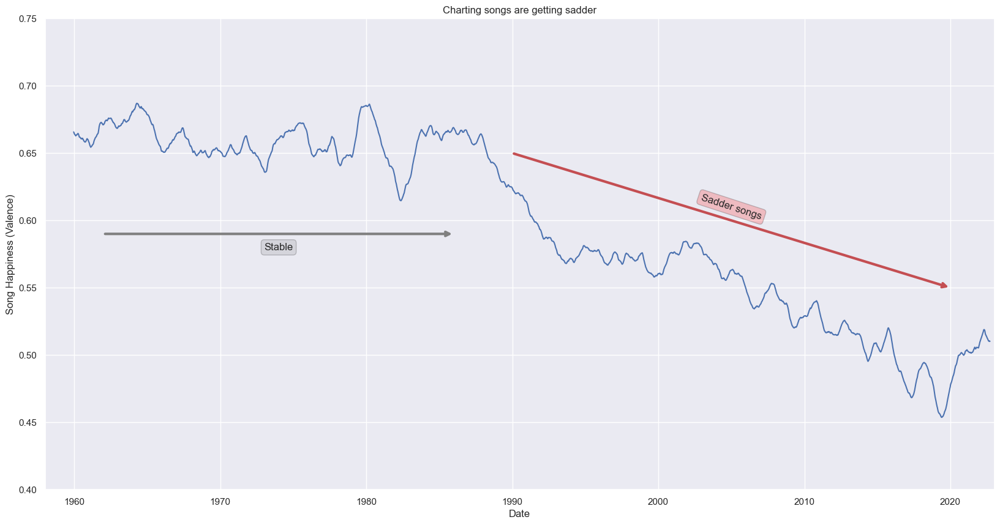

In [229]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(x=rolling.index, y=rolling.values, ci=None)

ax.set_ylim((0.4, 0.75))
ax.set_xlim((pd.Timestamp("1958"), pd.Timestamp("2023")))

ax.annotate(
    "",
    (pd.Timestamp("1962"), 0.59),
    (pd.Timestamp("1986"), 0.59),
    arrowprops={"arrowstyle": "<-", "ec": "gray", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("1974"),
    0.58,
    "Stable",
    va="center",
    ha="center",
    bbox={
        "boxstyle": "round",
        "fc": "gray",
        "ec": "black",
        "alpha": 0.2,
    },
)

ax.annotate(
    "",
    (pd.Timestamp("1990"), 0.65),
    (pd.Timestamp("2020"), 0.55),
    arrowprops={"arrowstyle": "<-", "ec": "r", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2005"),
    0.61,
    "Sadder songs",
    va="center",
    ha="center",
    rotation=-18,
    bbox={
        "boxstyle": "round",
        "fc": "red",
        "ec": "black",
        "alpha": 0.2,
    },
)

plt.title("Charting songs are getting sadder")
plt.ylabel("Song Happiness (Valence)")
plt.xlabel("Date")

plt.show()

Between 1960 to 1990, the charting songs were all around the same happiness, at a valence of around 0.66. However, from the 1990s onwards, the average charting song has become sadder and sadder, it seems, decreasing from a valence of 0.66 to 0.50 in that timespan. It seems that the energetic dancepop of the 80s is now much less prominent in the new age.

The fact that the songs are getting sadder could be related to listeners' need for more nuanced and cynical music, after the hyperenergetic 80s dancepop music, causing more sadder songs to end up on the chart. Alternatively, artists themselves could just be producing sadder music. Songs, nowadays, are more likely to be an outlet for artists to discuss problems and issues, a prime example being **Pumped Up Kicks** by band *Foster the People*, a song released in 2010, written in response to school shootings in America.

However, the recent rise of K-pop, and its energetic, happy tone, puts that into question. Perhaps, after a long dry spell of happy music, listeners will warm up to it again.

What about actual chart position?

R-value is -0.027652704428732924; P-value is 0.04615568801548025


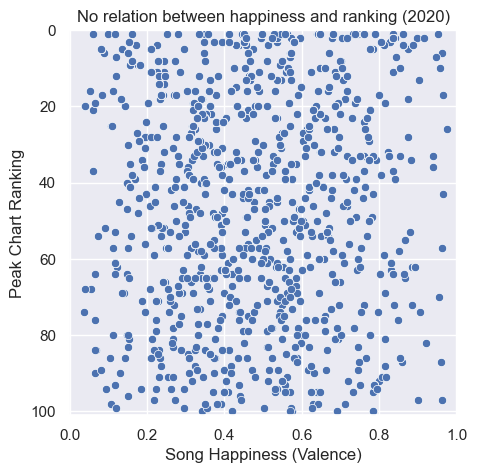

In [230]:
plt.figure(figsize=(5, 5))

ax = sns.scatterplot(
    y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["valence"]
)

ax.set_ylim((101, 0))
ax.set_xlim((-0.001, 1.001))

r, p = stats.pearsonr(
    y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["valence"]
)
print(f"R-value is {r}; P-value is {p}")

plt.title("No relation between happiness and ranking (2020)")

plt.ylabel("Peak Chart Ranking")
plt.xlabel("Song Happiness (Valence)")
plt.show()

As we can see, the peak chart position is quite random, even in a year of sad chart hits like 2020. This implies that, although the average charting song is getting sadder, the highest charting songs are not, in fact, sadder than those nearer to the bottom of the chart.

In conclusion, an artist may want to consider making sadder songs to make it on the charts, however should not expect it to score any higher on the chart than any other charting song.

<a id='q4res'/>

## Q4: Song Length

In [231]:
rolling = mean_length.rolling(72).mean()

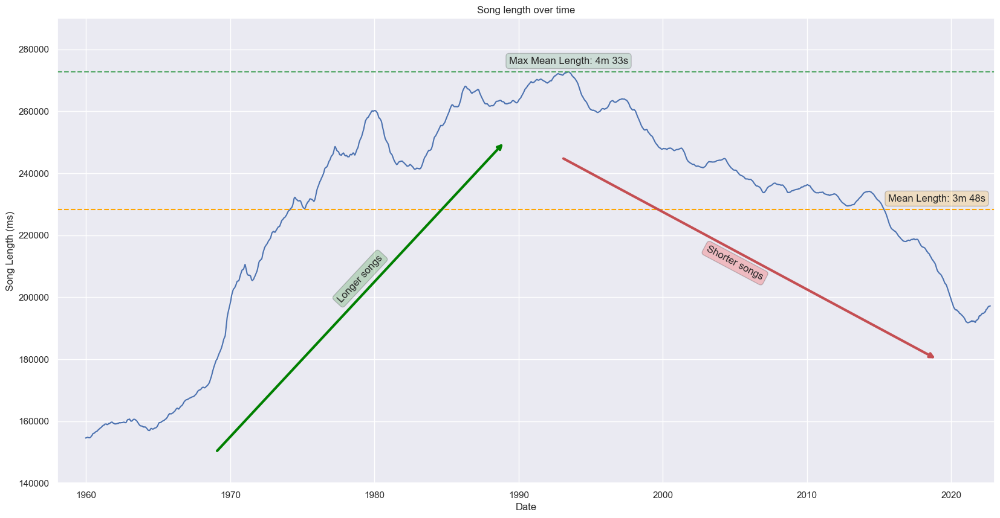

In [232]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(x=rolling.index, y=rolling.values, ci=None)

ax.set_ylim((140000, 290000))
ax.set_xlim((pd.Timestamp("1958"), pd.Timestamp("2023")))

# max line
max_entry = rolling.idxmax()
max_length = rolling.loc[max_entry]
max_length_mins, max_length_secs = map(round, divmod(max_length / 1000, 60))
hannotate(
    ax,
    max_length,
    3500,
    ax.get_xlim()[0],
    ax.get_xlim()[1],
    max_entry,
    "g",
    "",
    label=f"Max Mean Length: {max_length_mins}m {max_length_secs}s",
)

# mean line
mean_length = rolling.mean()
mean_length_mins, mean_length_secs = map(round, divmod(mean_length / 1000, 60))
hannotate(
    ax,
    mean_length,
    3500,
    ax.get_xlim()[0],
    ax.get_xlim()[1],
    pd.Timestamp('2019'),
    "orange",
    "",
    label=f"Mean Length: {mean_length_mins}m {mean_length_secs}s",
)

ax.annotate(
    "",
    (pd.Timestamp("1969"), 150000),
    (pd.Timestamp("1989"), 250000),
    arrowprops={"arrowstyle": "<-", "ec": "green", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("1979"),
    206000,
    "Longer songs",
    va="center",
    ha="center",
    rotation=47,
    bbox={
        "boxstyle": "round",
        "fc": "green",
        "ec": "black",
        "alpha": 0.2,
    },
)

ax.annotate(
    "",
    (pd.Timestamp("1993"), 245000),
    (pd.Timestamp("2019"), 180000),
    arrowprops={"arrowstyle": "<-", "ec": "r", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2005"),
    211000,
    "Shorter songs",
    va="center",
    ha="center",
    rotation=-28,
    bbox={
        "boxstyle": "round",
        "fc": "red",
        "ec": "black",
        "alpha": 0.2,
    },
)


plt.title("Song length over time")
plt.ylabel("Song Length (ms)")
plt.xlabel("Date")

plt.show()

As we can see, the average song length made a huge jump between 1965 to 1993, jumping from an average of 2m 40s back in 1965, to a maximum of 4m 33s around 1993.

However, in the modern day, the average charting song length has been falling, down to around 3m 10s nowadays. This trend indeed began around the start of the internet age, however it seems that this has been a trend before most social media has existed. Social media and attention span decreases may have exacerbated the effect of the decrease in song length, however it seems that songs were getting shorter way before then.

What about chart position?

R-value is -0.08349699400655643; P-value is 1.6381962139576552e-09


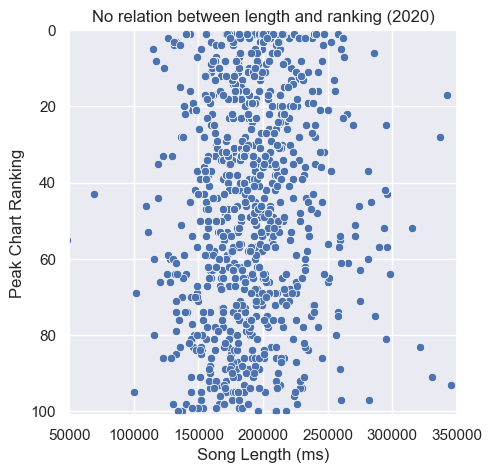

In [233]:
plt.figure(figsize=(5, 5))

ax = sns.scatterplot(
    y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["length_ms"]
)

ax.set_ylim((101, 0))
ax.set_xlim((50000, 350000))

r, p = stats.pearsonr(
    y=hot_100_analysis_2020["ranking"], x=hot_100_analysis_2020["length_ms"]
)
print(f"R-value is {r}; P-value is {p}")

plt.title("No relation between length and ranking (2020)")

plt.ylabel("Peak Chart Ranking")
plt.xlabel("Song Length (ms)")
plt.show()

Again, there appears to be no relation between song length and peak chart. The R-value is very, very small; this signifies little to no correlation between peak chart position and length. As with song happiness, it seems that one might want to make their songs around the 3 minute mark to end up on the charts, but there seems to be no correlation between your peak chart placement and your song length.

An artist may, hence, aim to make their songs around 3 minutes long, if they want to have the best chance of capturing the attention of the listeners. However, when it comes to actual chart position, song length is really not an important factor at all.

<a id='q5res'/>

## Q5: Music Ratings

In [234]:
rolling = (
    metacritic_scores[["album_date", "user_score", "critic_score"]]
    .set_index("album_date")
    .rolling(72)
    .mean()
)

In [235]:
rolling_cr = rolling["critic_score"]
rolling_usr = rolling["user_score"]

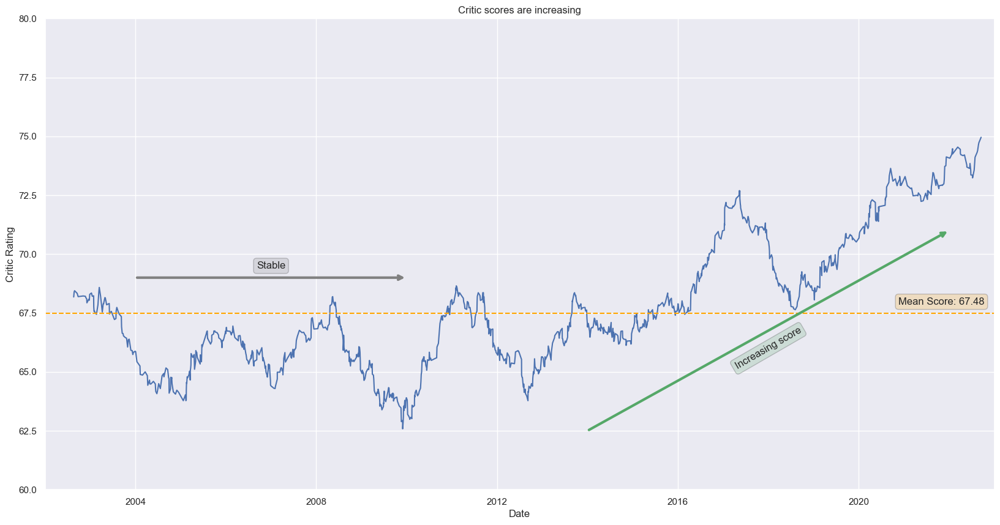

In [236]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(y=rolling_cr.values, x=rolling_cr.index, ci=None)

ax.set_ylim((60, 80))
ax.set_xlim((pd.Timestamp("2002"), pd.Timestamp("2023")))

# mean line
hannotate(
    ax,
    rolling_cr.mean(),
    .5,
    ax.get_xlim()[0],
    ax.get_xlim()[1],
    pd.Timestamp('2021-11'),
    "orange",
    "Mean Score: ",
)

ax.annotate(
    "",
    (pd.Timestamp("2004"), 69),
    (pd.Timestamp("2010"), 69),
    arrowprops={"arrowstyle": "<-", "ec": "gray", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2007"),
    69.5,
    "Stable",
    va="center",
    ha="center",
    bbox={
        "boxstyle": "round",
        "fc": "gray",
        "ec": "black",
        "alpha": 0.2,
    },
)

ax.annotate(
    "",
    (pd.Timestamp("2014"), 62.5),
    (pd.Timestamp("2022"), 71),
    arrowprops={"arrowstyle": "<-", "ec": "g", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2018"),
    66,
    "Increasing score",
    va="center",
    ha="center",
    rotation=30,
    bbox={
        "boxstyle": "round",
        "fc": "g",
        "ec": "black",
        "alpha": 0.2,
    },
)

plt.title("Critic scores are increasing")
plt.ylabel("Critic Rating")
plt.xlabel("Date")
plt.show()

As we can see, critics are rating newer albums higher and higher. After being stable between 2004 to 2012, at a rating of around 66.5, it has recently been increasing quite rapidly, up to around 73.5 today. Critics indeed seem to think that the albums today are better than those of the years before.

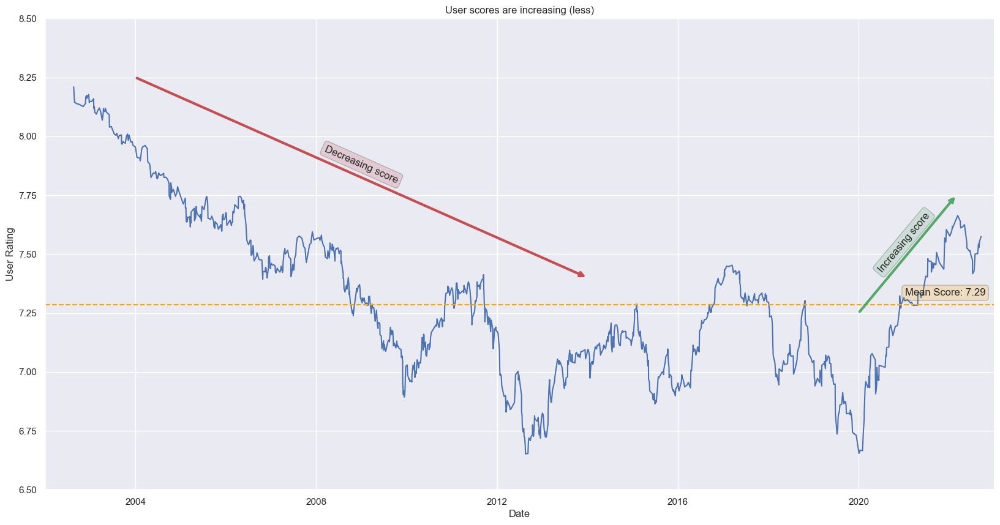

In [237]:
plt.figure(figsize=(20, 10))

ax = sns.lineplot(y=rolling_usr.values, x=rolling_usr.index, ci=None)

ax.set_ylim((6.5, 8.5))
ax.set_xlim((pd.Timestamp("2002"), pd.Timestamp("2023")))

# mean line
hannotate(
    ax,
    rolling_usr.mean(),
    .05,
    ax.get_xlim()[0],
    ax.get_xlim()[1],
    pd.Timestamp('2021-12'),
    "orange",
    "Mean Score: ",
)

ax.annotate(
    "",
    (pd.Timestamp("2004"), 8.25),
    (pd.Timestamp("2014"), 7.4),
    arrowprops={"arrowstyle": "<-", "ec": "r", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2009"),
    7.88,
    "Decreasing score",
    va="center",
    ha="center",
    bbox={
        "boxstyle": "round",
        "fc": "r",
        "ec": "black",
        "alpha": 0.2,
    },
    rotation=-24,
)

ax.annotate(
    "",
    (pd.Timestamp("2020"), 7.25),
    (pd.Timestamp("2022-03"), 7.75),
    arrowprops={"arrowstyle": "<-", "ec": "g", "lw": 3},
    color="r",
)
ax.text(
    pd.Timestamp("2021"),
    7.55,
    "Increasing score",
    va="center",
    ha="center",
    rotation=50,
    bbox={
        "boxstyle": "round",
        "fc": "g",
        "ec": "black",
        "alpha": 0.2,
    },
)

plt.title("User scores are increasing (less)")

plt.ylabel("User Rating")
plt.xlabel("Date")
plt.show()

Interestingly, the users seem to have thought that music was better nearer to 2002, and has rated new music consistently lower until around 2012. Recently, though, from 2020 onwards, we have actually seen an uptick in user ratings, and now the average charting album is a 7.5/10 for users. Interestingly, this margin, of 73.5/100 for critics, and 7.5/10 for users, is the lowest it has been, compared to, for example, the mean ratings, which show that users rated an average album 7.29/10, while critics only rated it 67.48/100, a discreptancy of ~4%.

So, critics and users both seem to agree that music lately has been better. This suggests that the music industry is improving, both to the casual user, and the much more technical critics. For new artists, this might not be a good time to start, since it means that people are satisfied with those at the top right now; however, it does necessitate some praise to the new artists who have made it onto the charts.

<a id='rec'/>

# Recommendations or Further Works

For any new artists out there, now may not be the best time to make your foray into the industry. With listeners both listening to music from more established artists more often, and with them being satisfied with the current songs, as shown by ratings, now may not be the best time to hope for a song to chart.

For the established artists, keep up the good work! Both critics and listeners seem to like your music better now, than in the decade prior. To score hits, consider making songs between 3 minutes to 3 minutes 30 seconds, and perhaps be a bit more critical in your songs.

For the industry in general, streaming is incredibly worthwhile to your revenue. In terms of revenue, streaming is one of the main reasons the music industry is back where it was in its heyday. Don't use downloads for internet distribution; and for physical distribution, CDs and DVDs are your best bets for revenue.

Note that the metacritic data, used in answering Q5, has only ~1000 entries, so the applicability of the data may be slightly in question. For future work, the scraping could definitely be improved on, to garner more accurate data.

Also, there's a lot of parameters in the Spotify audio analysis that was simply ignored and just used in the modelling; maybe the relationships between some of those could be explored more in detail.

All in all, this was a very fun project, and I really enjoyed learning more about the music industry, and pop music in general, while putting together this report.

<a id='ref'></a>

# References

- https://github.com/ijl/orjson for the fast JSON parsing library *orjson*.

- https://beautiful-soup-4.readthedocs.io/en/latest/ for the *BeautifulSoup* library (used in webscraping).